__author__ = 'Armando Collado-Villaverde'

__email__ = 'armando.collado@uah.es'

# Expansion of the SYM-H storms dataset

Contains the expansion of the Siciliano dataset (https://doi.org/10.1029/2020SW002589) using the storms identified in (https://doi.org/10.1007/s11069-023-06241-1), to allow for backwards compairson, the newly considered storms are added to the existing sets. The only exception is the test storms in 2018 which will be used in the secondary test set that only uses the preliminary parameters to simulate a environment closer to an operational scenario

* [Previous organization (Siciliano set)](#section_1)
* [Correspondence of the new considered storms to Siciliano set](#section_2)
* [Expansion of the dataset](#section_3)
    * [Separate the storms for which the preliminary data is available](#section_3_1)
    * [Initial distribution by storm class](#section_3_2)
        * [Classification of the new considered storms](#section_3_2_1)
    * [Assign the new storms to each subset](#section_3_3)
    * [New distribution and test key storms classified by their intensity](#section_3_4)
    * [Plot of the storms](#section_3_5)
        * [Plot of the superintense storms](#section_3_5_1)
        * [Plot of the intense storms](#section_3_5_2)
        * [Plot of the moderate storms](#section_3_5_3)
        * [Plot of the low storms](#section_3_5_4)
        * [Plot of the test key storms](#section_3_5_5)
    * [Superposed epoch analysis](#section_3_6)
        * [Low storms analysis](#section_3_6_1)
        * [Moderate storms analysis](#section_3_6_2)
        * [Intense storms analysis](#section_3_6_3)
        * [Superintense storms analysis](#section_3_6_4)        
    * [Classification of the storms per cycle and subset](#section_3_7)
        * [Check for multiple overlapping with Siciliano](#section_3_7_1)
    * [Print the storms to copy it to a .py file](#section_3_8)
        * [Cross-compare the storm dates with the ICME catalog](#section_3_8_1)
        * [Save to JSON file](#section_3_8_2)        

In [1]:
import pandas as pd
import numpy as np
import siciliano_dates
import utils
from datetimerange import DateTimeRange
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from IPython.display import display

plt.rcParams["figure.dpi"] = 150
sns.set_theme(style="whitegrid")
sns.set_context("paper")

/home/isg/anaconda3/envs/tf2-14/lib/python3.10/site-packages/spacepy/time.py:2367: UserWarning: Leapseconds may be out of date. Use spacepy.toolbox.update(leapsecs=True)
  warnings.warn('Leapseconds may be out of date.'


In [2]:
indices = pd.read_pickle('./data/sym_index.pkl', compression = 'gzip')

invalid_dates_sym = [
                 '2003-06-27 23:45:00',
                 '2003-06-27 23:50:00',
                 '2003-06-27 23:55:00',
                 '2003-11-03 10:10:00',
                 '2003-11-24 15:00:00',
]

indices.loc[invalid_dates_sym, 'SYM_H'] = np.nan
indices[['SYM_H']] = indices[['SYM_H']].interpolate()

# Previous organization (Siciliano set) <a class="anchor" id="section_1"></a>

In [3]:
previous_df = pd.DataFrame(columns = ['Storm index', 'Subset', 'Start date', 'End date', 'Min SYM-H', 'Classification'])

prev_train = siciliano_dates.TRAIN_STORM_DATES
prev_train_start = [pd.to_datetime(x[0]) for x in prev_train]
prev_train_end = [pd.to_datetime(x[1]) + pd.DateOffset(minutes=1) for x in prev_train]
prev_val = siciliano_dates.VAL_STORM_DATES
prev_val_start = [pd.to_datetime(x[0]) for x in prev_val]
prev_val_end = [pd.to_datetime(x[1]) + pd.DateOffset(minutes=1) for x in prev_val]
prev_test = siciliano_dates.TEST_STORM_DATES
prev_test_start = [pd.to_datetime(x[0]) for x in prev_test]
prev_test_end = [pd.to_datetime(x[1]) + pd.DateOffset(minutes=1) for x in prev_test]

global_storm = 1

for date_start, date_end in zip(prev_train_start, prev_train_end):
    mn = indices[date_start:date_end]["SYM_H"].min()
    classification = utils.from_min_sym_to_class(mn)
    previous_df.loc[len(previous_df)] = [global_storm, 'Training', date_start, date_end, int(mn), classification]
    global_storm += 1
    
for date_start, date_end in zip(prev_val_start, prev_val_end):
    mn = indices[date_start:date_end]["SYM_H"].min()
    classification = utils.from_min_sym_to_class(mn)
    previous_df.loc[len(previous_df)] = [global_storm, 'Validation', date_start, date_end, int(mn), classification]
    global_storm += 1
    

for date_start, date_end in zip(prev_test_start, prev_test_end):
    mn = indices[date_start:date_end]["SYM_H"].min()
    classification = utils.from_min_sym_to_class(mn)    
    previous_df.loc[len(previous_df)] = [global_storm, 'Test', date_start, date_end, int(mn), classification]
    global_storm += 1

In [4]:
print('Previous organization')
display(previous_df.set_index('Storm index'))

Previous organization


,Subset,Start date,End date,Min SYM-H,Classification
Storm index,,,,,
1,Training,1998-02-14,1998-02-23,-119,Low
2,Training,1998-08-02,1998-08-09,-168,Moderate
3,Training,1998-09-19,1998-09-30,-213,Moderate
4,Training,1999-02-16,1999-02-25,-127,Low
5,Training,1999-10-15,1999-10-26,-218,Moderate
6,Training,2000-07-09,2000-07-20,-335,Intense
7,Training,2000-08-06,2000-08-17,-235,Intense
8,Training,2000-09-15,2000-09-26,-196,Moderate
9,Training,2000-11-01,2000-11-16,-174,Moderate


In [5]:
prev_train_storms_superintense = previous_df.loc[
    (previous_df["Subset"] == "Training")
    & (previous_df["Classification"] == "Superintense")    
]

prev_validation_storms_superintense = previous_df.loc[
    (previous_df["Subset"] == "Validation")
    & (previous_df["Classification"] == "Superintense")    
]

prev_test_storms_superintense = previous_df.loc[
    (previous_df["Subset"] == "Test")
    & (previous_df["Classification"] == "Superintense")    
]

prev_train_storms_intense = previous_df.loc[
    (previous_df["Subset"] == "Training")
    & (previous_df["Classification"] == "Intense")    
]

prev_validation_storms_intense = previous_df.loc[
    (previous_df["Subset"] == "Validation")
    & (previous_df["Classification"] == "Intense")    
]

prev_test_storms_intense = previous_df.loc[
    (previous_df["Subset"] == "Test")
    & (previous_df["Classification"] == "Intense")    
]

prev_train_storms_moderate = previous_df.loc[
    (previous_df["Subset"] == "Training")
    & (previous_df["Classification"] == "Moderate")    
]

prev_validation_storms_moderate = previous_df.loc[
    (previous_df["Subset"] == "Validation")
    & (previous_df["Classification"] == "Moderate")    
]

prev_test_storms_moderate = previous_df.loc[
    (previous_df["Subset"] == "Test")
    & (previous_df["Classification"] == "Moderate")    
]

prev_train_storms_low = previous_df.loc[
    (previous_df["Subset"] == "Training")
    & (previous_df["Classification"] == "Low")    
]

prev_validation_storms_low = previous_df.loc[
    (previous_df["Subset"] == "Validation")
    & (previous_df["Classification"] == "Low")    
]

prev_test_storms_low = previous_df.loc[
    (previous_df["Subset"] == "Test")
    & (previous_df["Classification"] == "Low")    
]

In [6]:
new_storms = pd.read_csv('./data/storms_sym.csv', parse_dates = ['Start date', 'End date'])
new_storms['classification'] = new_storms['classification'].apply(str.title)
new_storms = new_storms.loc[new_storms['Start date'] > pd.to_datetime('1998-01-01')].reset_index(drop=True)
new_storms['solar_cycle'] = 23
new_storms.loc[new_storms['Start date'] > pd.to_datetime('2008-1-4'), 'solar_cycle'] = 24
new_storms.loc[new_storms['Start date'] > pd.to_datetime('2019-12-1'), 'solar_cycle'] = 25

In [7]:
def sanity_check(new_storms, dfx):
    for row_index, row in new_storms.iterrows():
        real_min = dfx[row['Start date'] : row['End date']]['SYM_H'].min()
        real_class = utils.from_min_sym_to_class(real_min)
        if (real_class != row['classification']):
            print(row, 'class is incorrect, real min:', real_min, 'real class:', real_class)
            break
    else:
        print('All the storms have the correct class')
    
sanity_check(new_storms, indices)

All the storms have the correct class


In [8]:
def check_belonging_previous_set(start_date, end_date):
    time_range = DateTimeRange(start_date, end_date)
    
    global_index = 1
    
    for prev_start, prev_end in zip(prev_test_start, prev_test_end):
        test_range = DateTimeRange(prev_start, prev_end)
        intersection = test_range.intersection(time_range)        
        if intersection.start_datetime is not None:
            intersection_duration = intersection.timedelta.days
            if intersection_duration >= 1:
                return global_index, 'old TEST'
        global_index += 1
        
    for prev_start, prev_end in zip(prev_val_start, prev_val_end):
        test_range = DateTimeRange(prev_start, prev_end)
        intersection = test_range.intersection(time_range)
        if intersection.start_datetime is not None:
            intersection_duration = intersection.timedelta.days
            if intersection_duration >= 1:
                return global_index, 'old VALIDATION'
        global_index += 1
    
    for prev_start, prev_end in zip(prev_train_start, prev_train_end):
        test_range = DateTimeRange(prev_start, prev_end)
        intersection = test_range.intersection(time_range)
        if intersection.start_datetime is not None:
            intersection_duration = intersection.timedelta.days
            if intersection_duration >= 1:
                return global_index, 'old TRAIN'
        global_index += 1
    
    return -1, 'New storm'

In [9]:
def check_belonging_previous_set_all(start_date, end_date):
    time_range = DateTimeRange(start_date, end_date)
    
    problematic = False
    overlapping = ''
    overlapped_storms = []
    
    start_test = 26
    for stormi, (prev_start, prev_end) in enumerate(zip(prev_test_start, prev_test_end)):
        test_range = DateTimeRange(prev_start, prev_end)
        intersection = test_range.intersection(time_range)
        if intersection.start_datetime is not None:
            intersection_duration = intersection.timedelta.days
            if intersection_duration >= 1:
                if overlapping != '':
                    problematic = True
                overlapping += f'Test {start_test + stormi}'
                overlapped_storms.append(previous_df.loc[previous_df['Start date'] == prev_start].copy())
        
    start_validation = 21
    for stormi, (prev_start, prev_end) in enumerate(zip(prev_val_start, prev_val_end)):
        test_range = DateTimeRange(prev_start, prev_end)
        intersection = test_range.intersection(time_range)
        if intersection.start_datetime is not None:
            intersection_duration = intersection.timedelta.days
            if intersection_duration >= 1:
                if overlapping != '':
                    problematic = True
                overlapping += f'Val {start_validation + stormi}'
                overlapped_storms.append(previous_df.loc[previous_df['Start date'] == prev_start].copy())
    
    start_train = 1
    for stormi, (prev_start, prev_end) in enumerate(zip(prev_train_start, prev_train_end)):
        test_range = DateTimeRange(prev_start, prev_end)
        intersection = test_range.intersection(time_range)
        if intersection.start_datetime is not None:
            intersection_duration = intersection.timedelta.days
            if intersection_duration >= 1:
                if overlapping != '':
                    problematic = True
                overlapping += f'Train {start_train + stormi}'
                overlapped_storms.append(previous_df.loc[previous_df['Start date'] == prev_start].copy())
    
    if overlapping == '':
        overlapping = 'New storm'    
    return overlapped_storms, problematic, overlapping

# Correspondence to the storms identified in the paper to the Siciliano dataset <a class="anchor" id="section_2"></a>

In [10]:
print('Correspondence new storms to the previous separation')

new_storms_rows = []
new_storm_index = 1

for row in new_storms.iterrows():
    old_index, subset = check_belonging_previous_set(row[1]['Start date'], row[1]['End date'])
    if subset == 'New storm':
        print(f'New storm {new_storm_index} - {row[1]["Start date"].strftime("%Y-%m-%d")}'
          f' to {row[1]["End date"].strftime("%Y-%m-%d")} - Duration: '
          f'{row[1]["TD"]}  '
          f'Min SYM-H: {row[1]["Min SYM-H"]}'
          f' - {row[1]["classification"]}')        
    else:
        print(f'Storm from {row[1]["Start date"].strftime("%Y-%m-%d")}'
              f' to {row[1]["End date"].strftime("%Y-%m-%d")} is the '
              f'{subset} storm with index {old_index}')    
    new_storms_rows.append([new_storm_index, row[1]["Start date"], row[1]["End date"], 
                            row[1]["Min SYM-H"], row[1]['classification'], subset, row[1]['solar_cycle']])
    new_storm_index += 1

Correspondence new storms to the previous separation
Storm from 1998-02-15 to 1998-02-23 is the old TRAIN storm with index 23
New storm 2 - 1998-03-08 to 1998-03-16 - Duration: 8 days  Min SYM-H: -119 - Low
Storm from 1998-05-02 to 1998-05-10 is the old VALIDATION storm with index 18
Storm from 1998-06-24 to 1998-07-01 is the old TEST storm with index 1
Storm from 1998-08-04 to 1998-08-12 is the old TRAIN storm with index 24
New storm 6 - 1998-08-25 to 1998-09-01 - Duration: 7 days  Min SYM-H: -171 - Moderate
Storm from 1998-09-23 to 1998-09-30 is the old TRAIN storm with index 25
New storm 8 - 1998-10-17 to 1998-10-24 - Duration: 7 days  Min SYM-H: -120 - Low
Storm from 1998-11-06 to 1998-11-19 is the old TEST storm with index 2
Storm from 1999-01-11 to 1999-01-19 is the old TEST storm with index 3
Storm from 1999-02-16 to 1999-02-24 is the old TRAIN storm with index 26
New storm 12 - 1999-02-27 to 1999-03-06 - Duration: 7 days  Min SYM-H: -93 - Low
Storm from 1999-04-15 to 1999-04-22

# Expansion of the dataset <a class="anchor" id="section_3"></a>

In [11]:
new_storms_df = pd.DataFrame(columns = ['Storm index', 'Start date', 'End date', 'Min SYM-H', 
                                        'classification', 'previous_subset', 'solar_cycle'],
                            data = new_storms_rows)

from IPython.display import display
with pd.option_context('display.max_rows', 150, 'display.max_columns', 10):
    display(new_storms_df.set_index('Storm index'))    

,Start date,End date,Min SYM-H,classification,previous_subset,solar_cycle
Storm index,,,,,,
1,1998-02-15,1998-02-23,-119,Low,old TRAIN,23
2,1998-03-08,1998-03-16,-119,Low,New storm,23
3,1998-05-02,1998-05-10,-268,Intense,old VALIDATION,23
4,1998-06-24,1998-07-01,-120,Low,old TEST,23
5,1998-08-04,1998-08-12,-168,Moderate,old TRAIN,23
6,1998-08-25,1998-09-01,-171,Moderate,New storm,23
7,1998-09-23,1998-09-30,-213,Moderate,old TRAIN,23
8,1998-10-17,1998-10-24,-120,Low,New storm,23
9,1998-11-06,1998-11-19,-179,Moderate,old TEST,23


In [12]:
new_storms_df['subset'] = new_storms_df['previous_subset']
new_storms_df.loc[new_storms_df['subset'] == 'old TRAIN','subset'] = 'Train'
new_storms_df.loc[new_storms_df['subset'] == 'old VALIDATION','subset'] = 'Validation'
print('Classes for all the considered storms')
new_storms_df.loc[new_storms_df['subset'] == 'old TEST','subset'] = 'Test'
display(new_storms_df.loc[new_storms_df['subset'] != 'Test_key_parameters']['classification'].value_counts())

Classes for all the considered storms


classification
Low             72
Moderate        37
Intense          9
Superintense     4
Name: count, dtype: int64

## Separate the storms for which the preliminary data is available <a class="anchor" id="section_3_1"></a>

In [13]:
new_storms_df.loc[
    new_storms_df['Start date'] > pd.to_datetime('2017-10')
, 'subset'] = 'Test_key_parameters'

In [14]:
test_key_storms_low = new_storms_df.loc[(new_storms_df['subset'] == 'Test_key_parameters') & (new_storms_df['classification'] == 'Low')]
test_key_storms_moderate = new_storms_df.loc[(new_storms_df['subset'] == 'Test_key_parameters') & (new_storms_df['classification'] == 'Moderate')]
test_key_storms_intense = new_storms_df.loc[(new_storms_df['subset'] == 'Test_key_parameters') & (new_storms_df['classification'] == 'Intense')]
test_key_storms_superintense = new_storms_df.loc[(new_storms_df['subset'] == 'Test_key_parameters') & (new_storms_df['classification'] == 'Superintense')]

In [15]:
train_storms_low = new_storms_df.loc[
    (new_storms_df["previous_subset"] == "old TRAIN")
    & (new_storms_df["classification"] == "Low")
    & (new_storms_df["subset"] != "Test_key_parameters")
]
train_storms_moderate = new_storms_df.loc[
    (new_storms_df["previous_subset"] == "old TRAIN")
    & (new_storms_df["classification"] == "Moderate")
    & (new_storms_df["subset"] != "Test_key_parameters")
]
train_storms_intense = new_storms_df.loc[
    (new_storms_df["previous_subset"] == "old TRAIN")
    & (new_storms_df["classification"] == "Intense")
    & (new_storms_df["subset"] != "Test_key_parameters")
]
train_storms_superintense = new_storms_df.loc[
    (new_storms_df["previous_subset"] == "old TRAIN")
    & (new_storms_df["classification"] == "Superintense")
    & (new_storms_df["subset"] != "Test_key_parameters")
]

val_storms_low = new_storms_df.loc[
    (new_storms_df["previous_subset"] == "old VALIDATION")
    & (new_storms_df["classification"] == "Low")
    & (new_storms_df["subset"] != "Test_key_parameters")
]
val_storms_moderate = new_storms_df.loc[
    (new_storms_df["previous_subset"] == "old VALIDATION")
    & (new_storms_df["classification"] == "Moderate")
    & (new_storms_df["subset"] != "Test_key_parameters")
]
val_storms_intense = new_storms_df.loc[
    (new_storms_df["previous_subset"] == "old VALIDATION")
    & (new_storms_df["classification"] == "Intense")
    & (new_storms_df["subset"] != "Test_key_parameters")
]
val_storms_superintense = new_storms_df.loc[
    (new_storms_df["previous_subset"] == "old VALIDATION")
    & (new_storms_df["classification"] == "Superintense")
    & (new_storms_df["subset"] != "Test_key_parameters")
]

test_storms_low = new_storms_df.loc[
    (new_storms_df["previous_subset"] == "old TEST")
    & (new_storms_df["classification"] == "Low")
    & (new_storms_df["subset"] != "Test_key_parameters")
]
test_storms_moderate = new_storms_df.loc[
    (new_storms_df["previous_subset"] == "old TEST")
    & (new_storms_df["classification"] == "Moderate")
    & (new_storms_df["subset"] != "Test_key_parameters")
]
test_storms_intense = new_storms_df.loc[
    (new_storms_df["previous_subset"] == "old TEST")
    & (new_storms_df["classification"] == "Intense")
    & (new_storms_df["subset"] != "Test_key_parameters")
]
test_storms_superintense = new_storms_df.loc[
    (new_storms_df["previous_subset"] == "old TEST")
    & (new_storms_df["classification"] == "Superintense")
    & (new_storms_df["subset"] != "Test_key_parameters")
]

storms_low = new_storms_df.loc[
    (new_storms_df["classification"] == "Low")
    & (new_storms_df["subset"] != "Test_key_parameters")
]

storms_moderate = new_storms_df.loc[
    (new_storms_df["classification"] == "Moderate")
    & (new_storms_df["subset"] != "Test_key_parameters")
]

storms_intense = new_storms_df.loc[
    (new_storms_df["classification"] == "Intense")
    & (new_storms_df["subset"] != "Test_key_parameters")
]

storms_superintense = new_storms_df.loc[
    (new_storms_df["classification"] == "Superintense")
    & (new_storms_df["subset"] != "Test_key_parameters")
]

## Initial distribution by storm class <a class="anchor" id="section_3_2"></a>

Previous distribution
Superintense:
	Train: 1 - 25%
	Validation: 1 - 25%
	Test: 2 - 50%
Intense:
	Train: 5 - 62%
	Validation: 1 - 12%
	Test: 2 - 25%
Moderate:
	Train: 9 - 45%
	Validation: 3 - 15%
	Test: 6 - 30%
Low:
	Train: 5 - 50%
	Validation: 0 - 0%
	Test: 6 - 60%


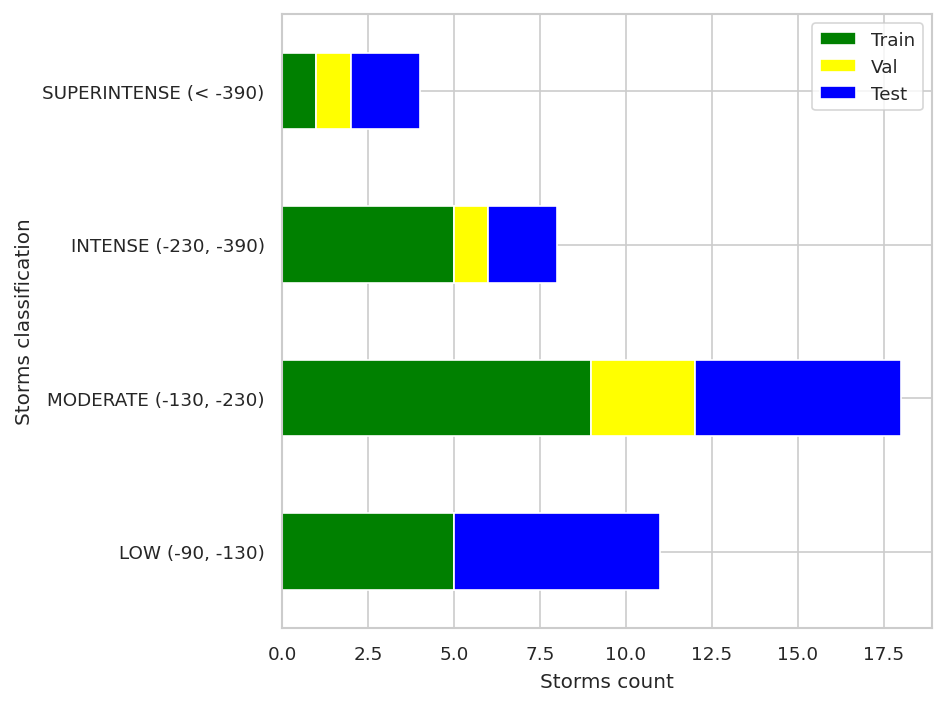

In [16]:
print("Previous distribution")

bar_df = pd.DataFrame(
    {
        f"LOW ({utils.SYM_H_THRESHOLD_LOW}, {utils.SYM_H_THRESHOLD_MODERATE})": [
            len(train_storms_low),
            len(val_storms_low),
            len(test_storms_low),
        ],
        f"MODERATE ({utils.SYM_H_THRESHOLD_MODERATE}, {utils.SYM_H_THRESHOLD_INTENSE})": [
            len(train_storms_moderate),
            len(val_storms_moderate),
            len(test_storms_moderate),
        ],
        f"INTENSE ({utils.SYM_H_THRESHOLD_INTENSE}, {utils.SYM_H_THRESHOLD_SUPERINTENSE})": [
            len(train_storms_intense),
            len(val_storms_intense),
            len(test_storms_intense),
        ],
        f"SUPERINTENSE (< {utils.SYM_H_THRESHOLD_SUPERINTENSE})": [
            len(train_storms_superintense),
            len(val_storms_superintense),
            len(test_storms_superintense),
        ],
    },
    index=["Train", "Val", "Test"],
)

print(f"Superintense:"
      f"\n\tTrain: {len(train_storms_superintense)} - {len(train_storms_superintense) / len(previous_df.loc[previous_df['Classification'] == 'Superintense']) * 100:.0f}%"
      f"\n\tValidation: {len(val_storms_superintense)} - {len(val_storms_superintense) / len(previous_df.loc[previous_df['Classification'] == 'Superintense']) * 100:.0f}%"
      f"\n\tTest: {len(test_storms_superintense)} - {len(test_storms_superintense) / len(previous_df.loc[previous_df['Classification'] == 'Superintense']) * 100:.0f}%"
     )

print(f"Intense:"
      f"\n\tTrain: {len(train_storms_intense)} - {len(train_storms_intense) / len(previous_df.loc[previous_df['Classification'] == 'Intense']) * 100:.0f}%"
      f"\n\tValidation: {len(val_storms_intense)} - {len(val_storms_intense) / len(previous_df.loc[previous_df['Classification'] == 'Intense']) * 100:.0f}%"
      f"\n\tTest: {len(test_storms_intense)} - {len(test_storms_intense) / len(previous_df.loc[previous_df['Classification'] == 'Intense']) * 100:.0f}%"
     )

print(f"Moderate:"
      f"\n\tTrain: {len(train_storms_moderate)} - {len(train_storms_moderate) / len(previous_df.loc[previous_df['Classification'] == 'Moderate']) * 100:.0f}%"
      f"\n\tValidation: {len(val_storms_moderate)} - {len(val_storms_moderate) / len(previous_df.loc[previous_df['Classification'] == 'Moderate']) * 100:.0f}%"
      f"\n\tTest: {len(test_storms_moderate)} - {len(test_storms_moderate) / len(previous_df.loc[previous_df['Classification'] == 'Moderate']) * 100:.0f}%"
     )

print(f"Low:"
      f"\n\tTrain: {len(train_storms_low)} - {len(train_storms_low) / len(previous_df.loc[previous_df['Classification'] == 'Low']) * 100:.0f}%"
      f"\n\tValidation: {len(val_storms_low)} - {len(val_storms_low) / len(previous_df.loc[previous_df['Classification'] == 'Low']) * 100:.0f}%"
      f"\n\tTest: {len(test_storms_low)} - {len(test_storms_low) / len(previous_df.loc[previous_df['Classification'] == 'Low']) * 100:.0f}%"
     )

bar_df.T.plot(
    kind="barh",
    stacked=True,
    color=["Green", "Yellow", "Blue", "Magenta"],
    xlabel="Storms count",
    ylabel="Storms classification",
);
plt.tight_layout();
#plt.savefig('./report_figs/sym_storms_split.png')
plt.show();



### Classification of the new considered storms <a class="anchor" id="section_3_2_1"></a>

In [17]:
print('Classes for the new considered storms')
print(new_storms_df.loc[(new_storms_df['previous_subset'] == 'New storm') &
                       (new_storms_df['subset'] != 'Test_key_parameters')]['classification']
      .value_counts())

Classes for the new considered storms
classification
Low         56
Moderate    18
Intense      1
Name: count, dtype: int64


classification  solar_cycle
Low             23             32
                24             24
Moderate        23             13
                24              5
Intense         23              1
Name: count, dtype: int64


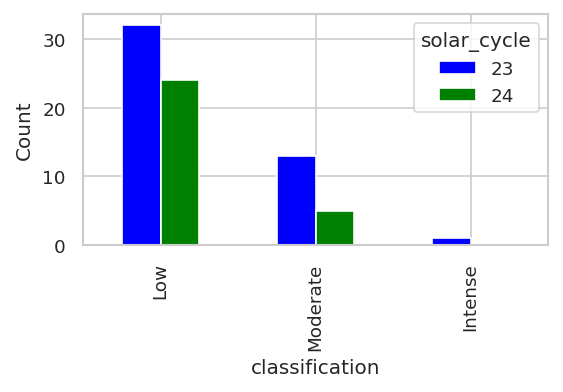

In [18]:
custom_order = {'Low' : 0, 'Moderate' : 1, 'Intense' : 2, 'Superintense' : 3, 23:23, 24:24, 25:25,
               'train': 26, 'validation' : 27, 'test' : 28, 'Test_key_parameters' : 29}

print(new_storms_df.loc[(new_storms_df['previous_subset'] == 'New storm') &
                       (new_storms_df['subset'] != 'Test_key_parameters')]
      [['classification', 'solar_cycle']].value_counts())

bar_data = {
    'classification': ['Low', 'Low', 'Moderate', 'Moderate', 'Intense', 'Intense'],
    'solar_cycle': [23, 24, 23, 24, 23, 24],
    'count': [len(new_storms_df.loc[((new_storms_df['previous_subset'] == 'New storm') & 
                                     (new_storms_df['subset'] != 'Test_key_parameters') & 
                                     (new_storms_df['solar_cycle'] == 23) &
                                     (new_storms_df['classification'] == 'Low')
                                    )]),
              len(new_storms_df.loc[((new_storms_df['previous_subset'] == 'New storm') & 
                                     (new_storms_df['subset'] != 'Test_key_parameters') & 
                                     (new_storms_df['solar_cycle'] == 24) &
                                     (new_storms_df['classification'] == 'Low')
                                    )]),
              len(new_storms_df.loc[((new_storms_df['previous_subset'] == 'New storm') & 
                                     (new_storms_df['subset'] != 'Test_key_parameters') & 
                                     (new_storms_df['solar_cycle'] == 23) &
                                     (new_storms_df['classification'] == 'Moderate')
                                    )]),
              len(new_storms_df.loc[((new_storms_df['previous_subset'] == 'New storm') & 
                                     (new_storms_df['subset'] != 'Test_key_parameters') & 
                                     (new_storms_df['solar_cycle'] == 24) &
                                     (new_storms_df['classification'] == 'Moderate')
                                    )]),
              len(new_storms_df.loc[((new_storms_df['previous_subset'] == 'New storm') & 
                                     (new_storms_df['subset'] != 'Test_key_parameters') & 
                                     (new_storms_df['solar_cycle'] == 23) &
                                     (new_storms_df['classification'] == 'Intense')
                                    )]),
              len(new_storms_df.loc[((new_storms_df['previous_subset'] == 'New storm') & 
                                     (new_storms_df['subset'] != 'Test_key_parameters') & 
                                     (new_storms_df['solar_cycle'] == 24) &
                                     (new_storms_df['classification'] == 'Intense')
                                    )])]              
}

bardf = pd.DataFrame(bar_data)
bardf = bardf.pivot(index='classification', columns='solar_cycle', values='count')

# Create a bar plot with different colors for each solar cycle
colors = ['blue', 'green']

ordered = bardf.sort_index(level=['classification'], key = lambda x : x.map(custom_order))
ax = ordered.plot(kind='bar', color=colors, figsize=(4, 2))
ax.set_ylabel('Count')
plt.show();

## Assign the new storms to each subset <a class="anchor" id="section_3_3"></a>

Considerations:
* The new Intense storm is assigned to the training set
* There are enough moderate storms in the solar cycle 23 to apply the stratified sampling. However, for the solar cycle 24 there are only 5 storms so we apply random splitting
* Since there are sufficient low storms from both solar cycles, the storms for each cycle will be split into the three subsets using the minimum SYM-H peak as a complexity metric, keeping the distribution of each solar cycle consistent across the subsets 
* For the test key storms we will use all that happened after 2017-10-01 since is the earliest date for when we have the key parameters available

In [19]:
new_storms_df.loc[(new_storms_df['previous_subset'] == 'New storm') & (new_storms_df['classification'] == 'Intense'), 'subset'] = 'Train'

In [20]:
test_key_storms_low = new_storms_df.loc[(new_storms_df['subset'] == 'Test_key_parameters') & (new_storms_df['classification'] == 'Low')]
test_key_storms_moderate = new_storms_df.loc[(new_storms_df['subset'] == 'Test_key_parameters') & (new_storms_df['classification'] == 'Moderate')]
test_key_storms_intense = new_storms_df.loc[(new_storms_df['subset'] == 'Test_key_parameters') & (new_storms_df['classification'] == 'Intense')]
test_key_storms_superintense = new_storms_df.loc[(new_storms_df['subset'] == 'Test_key_parameters') & (new_storms_df['classification'] == 'Superintense')]

test_key_storms = new_storms_df.loc[new_storms_df['subset'] == 'Test_key_parameters']

In [21]:
low_new_storms_23 = new_storms_df.loc[
    (new_storms_df['previous_subset'] == 'New storm') & 
    (new_storms_df['solar_cycle'] == 23) & 
    (new_storms_df['classification'] == 'Low')]
moderate_new_storms_23 = new_storms_df.loc[
    (new_storms_df['previous_subset'] == 'New storm') & 
    (new_storms_df['solar_cycle'] == 23) & 
    (new_storms_df['classification'] == 'Moderate')]

low_new_storms_24 = new_storms_df.loc[
    (new_storms_df['previous_subset'] == 'New storm') & 
    (new_storms_df['solar_cycle'] == 24) & 
    (new_storms_df['classification'] == 'Low')]
moderate_new_storms_24 = new_storms_df.loc[
    (new_storms_df['previous_subset'] == 'New storm') & 
    (new_storms_df['solar_cycle'] == 24) & 
    (new_storms_df['classification'] == 'Moderate')]

In [22]:
train_storms = pd.DataFrame(columns = new_storms_df.columns)
val_storms = pd.DataFrame(columns = new_storms_df.columns)
test_storms = pd.DataFrame(columns = new_storms_df.columns)

# Moderate storms in the solar cycle 23
complexities = [item for item in moderate_new_storms_23['Min SYM-H']]
indices_to_split = [item for item in moderate_new_storms_23.index]

binwidth = 30
complexity_bins = np.histogram(complexities, 
                               bins=range(min(complexities), max(complexities) + binwidth, 
                                          binwidth))[1]  # Divide the complexity range into 3 bins
complexity_labels = np.digitize(complexities, complexity_bins)

print('$SUBSET, $COUNT, $PERCENTAGE, $MIN_SYM-H')
print('\nStratified separation of the moderate storms in the solar cycle 23')

indices_train, indices_temp = train_test_split(indices_to_split, test_size=0.4, stratify=complexity_labels, random_state = 5)
complexity_temp = [complexity_labels[indices_to_split.index(i)] for i in indices_temp]
indices_test, indices_valid = train_test_split(indices_temp, test_size=0.3, stratify=complexity_temp, random_state = 5)

print(f'\tindices_train {len(indices_train)}, {len(indices_train) / len(indices_to_split) * 100:.2f}%, {moderate_new_storms_23.loc[indices_train]["Min SYM-H"].values}')
print(f'\tindices_valid {len(indices_valid)}, {len(indices_valid) / len(indices_to_split) * 100:.2f}%, {moderate_new_storms_23.loc[indices_valid]["Min SYM-H"].values}')
print(f'\tindices_test {len(indices_test)}, {len(indices_test) / len(indices_to_split) * 100:.2f}%, {moderate_new_storms_23.loc[indices_test]["Min SYM-H"].values}')

train_storms = pd.concat([train_storms, moderate_new_storms_23.loc[indices_train]])
val_storms = pd.concat([val_storms, moderate_new_storms_23.loc[indices_valid]])
test_storms = pd.concat([test_storms, moderate_new_storms_23.loc[indices_test]])

# Moderate storms in the solar cycle 24
indices_to_split = [item for item in moderate_new_storms_24.index]

print('\nRandom separation of the moderate storms in the solar cycle 24')

indices_train, indices_temp = train_test_split(indices_to_split, test_size=0.35, random_state = 5)
complexity_temp = [complexity_labels[indices_to_split.index(i)] for i in indices_temp]
indices_test, indices_valid = train_test_split(indices_temp, test_size=0.3, random_state = 5)


print(f'indices_train {len(indices_train)}, {len(indices_train) / len(indices_to_split) * 100:.2f}%, {moderate_new_storms_24.loc[indices_train]["Min SYM-H"].values}')
print(f'indices_valid {len(indices_valid)}, {len(indices_valid) / len(indices_to_split) * 100:.2f}%, {moderate_new_storms_24.loc[indices_valid]["Min SYM-H"].values}')
print(f'indices_test {len(indices_test)}, {len(indices_test) / len(indices_to_split) * 100:.2f}%, {moderate_new_storms_24.loc[indices_test]["Min SYM-H"].values}')

train_storms = pd.concat([train_storms, moderate_new_storms_24.loc[indices_train]])
val_storms = pd.concat([val_storms, moderate_new_storms_24.loc[indices_valid]])
test_storms = pd.concat([test_storms, moderate_new_storms_24.loc[indices_test]])

# Low storms in the solar cycle 23
complexities = [item for item in low_new_storms_23['Min SYM-H']]
indices_to_split = [item for item in low_new_storms_23.index]

binwidth = 20
complexity_bins = np.histogram(complexities, 
                               bins=range(min(complexities), max(complexities) + binwidth, 
                                          binwidth))[1]  # Divide the complexity range into 3 bins
complexity_labels = np.digitize(complexities, complexity_bins)

print('\nStratified separation of the low storms in the solar cycle 23')

indices_train, indices_temp = train_test_split(indices_to_split, test_size=0.4, stratify=complexity_labels, random_state = 5)
complexity_temp = [complexity_labels[indices_to_split.index(i)] for i in indices_temp]
indices_test, indices_valid = train_test_split(indices_temp, test_size=0.3, stratify=complexity_temp, random_state = 5)

print(f'\tindices_train {len(indices_train)}, {len(indices_train) / len(indices_to_split) * 100:.2f}%, {low_new_storms_23.loc[indices_train]["Min SYM-H"].values}')
print(f'\tindices_valid {len(indices_valid)}, {len(indices_valid) / len(indices_to_split) * 100:.2f}%, {low_new_storms_23.loc[indices_valid]["Min SYM-H"].values}')
print(f'\tindices_test {len(indices_test)}, {len(indices_test) / len(indices_to_split) * 100:.2f}%, {low_new_storms_23.loc[indices_test]["Min SYM-H"].values}')

train_storms = pd.concat([train_storms, low_new_storms_23.loc[indices_train]])
val_storms = pd.concat([val_storms, low_new_storms_23.loc[indices_valid]])
test_storms = pd.concat([test_storms, low_new_storms_23.loc[indices_test]])

# Low storms in the solar cycle 24
complexities = [item for item in low_new_storms_24['Min SYM-H']]
indices_to_split = [item for item in low_new_storms_24.index]

binwidth = 20
complexity_bins = np.histogram(complexities, 
                               bins=range(min(complexities), max(complexities) + binwidth, 
                                          binwidth))[1]  # Divide the complexity range into 3 bins
complexity_labels = np.digitize(complexities, complexity_bins)

print('\nStratified separation of the low storms in the solar cycle 24')

indices_train, indices_temp = train_test_split(indices_to_split, test_size=0.35, stratify=complexity_labels, random_state = 5)
complexity_temp = [complexity_labels[indices_to_split.index(i)] for i in indices_temp]
indices_test, indices_valid = train_test_split(indices_temp, test_size=0.3, stratify=complexity_temp, random_state = 5)

print(f'indices_train {len(indices_train)}, {len(indices_train) / len(indices_to_split) * 100:.2f}%, {low_new_storms_24.loc[indices_train]["Min SYM-H"].values}')
print(f'indices_valid {len(indices_valid)}, {len(indices_valid) / len(indices_to_split) * 100:.2f}%, {low_new_storms_24.loc[indices_valid]["Min SYM-H"].values}')
print(f'indices_test {len(indices_test)}, {len(indices_test) / len(indices_to_split) * 100:.2f}%, {low_new_storms_24.loc[indices_test]["Min SYM-H"].values}')

train_storms = pd.concat([train_storms, low_new_storms_24.loc[indices_train]])
val_storms = pd.concat([val_storms, low_new_storms_24.loc[indices_valid]])
test_storms = pd.concat([test_storms, low_new_storms_24.loc[indices_test]])

$SUBSET, $COUNT, $PERCENTAGE, $MIN_SYM-H

Stratified separation of the moderate storms in the solar cycle 23
	indices_train 7, 53.85%, [-183 -135 -138 -164 -174 -183 -153]
	indices_valid 2, 15.38%, [-187 -148]
	indices_test 4, 30.77%, [-162 -171 -130 -167]

Random separation of the moderate storms in the solar cycle 24
indices_train 3, 60.00%, [-131 -134 -169]
indices_valid 1, 20.00%, [-141]
indices_test 1, 20.00%, [-160]

Stratified separation of the low storms in the solar cycle 23
	indices_train 19, 59.38%, [ -90  -97 -128  -90 -106  -94 -126  -93 -126 -101 -113  -95 -126 -100
 -109  -93  -90  -91 -114]
	indices_valid 4, 12.50%, [-102 -107 -119 -119]
	indices_test 9, 28.12%, [-112 -101 -108  -90 -120 -107  -93  -94 -114]

Stratified separation of the low storms in the solar cycle 24
indices_train 15, 62.50%, [ -92  -95 -114  -93  -95 -124 -125  -91 -117 -100  -93 -125 -111 -117
 -106]
indices_valid 3, 12.50%, [ -93 -103 -109]
indices_test 6, 25.00%, [ -95 -110  -99 -122 -126 -104]


/tmp/ipykernel_1180411/2504348977.py:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  train_storms = pd.concat([train_storms, moderate_new_storms_23.loc[indices_train]])
/tmp/ipykernel_1180411/2504348977.py:27: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  val_storms = pd.concat([val_storms, moderate_new_storms_23.loc[indices_valid]])
/tmp/ipykernel_1180411/2504348977.py:28: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, t

In [23]:
new_storms_df.iloc[train_storms.index, -1] = 'Train'
new_storms_df.iloc[val_storms.index, -1] = 'Validation'
new_storms_df.iloc[test_storms.index, -1] = 'Test'

In [24]:
custom_order = {'Train': 1, 'Validation': 2, 'Test': 3, 'Test_key_parameters' : 4}
new_storms_df['subset_cat'] = new_storms_df['subset'].map(custom_order)

new_storms_df = new_storms_df.sort_values(['subset_cat', 'Start date'])
new_storms_df = new_storms_df.drop(columns='subset_cat')
new_storms_df['Storm index'] = np.arange(1, len(new_storms_df) + 1)

In [25]:
train_storms_low = train_storms.loc[
    (new_storms_df["subset"] == "Train")
    & (new_storms_df["classification"] == "Low")    
]
train_storms_moderate = new_storms_df.loc[
    (new_storms_df["subset"] == "Train")
    & (new_storms_df["classification"] == "Moderate")    
]
train_storms_intense = new_storms_df.loc[
    (new_storms_df["subset"] == "Train")
    & (new_storms_df["classification"] == "Intense")    
]
train_storms_superintense = new_storms_df.loc[
    (new_storms_df["subset"] == "Train")
    & (new_storms_df["classification"] == "Superintense")    
]

val_storms_low = new_storms_df.loc[
    (new_storms_df["subset"] == "Validation")
    & (new_storms_df["classification"] == "Low")    
]
val_storms_moderate = new_storms_df.loc[
    (new_storms_df["subset"] == "Validation")
    & (new_storms_df["classification"] == "Moderate")    
]
val_storms_intense = new_storms_df.loc[
    (new_storms_df["subset"] == "Validation")
    & (new_storms_df["classification"] == "Intense")    
]
val_storms_superintense = new_storms_df.loc[
    (new_storms_df["subset"] == "Validation")
    & (new_storms_df["classification"] == "Superintense")    
]

test_storms_low = new_storms_df.loc[
    (new_storms_df["subset"] == "Test")
    & (new_storms_df["classification"] == "Low")    
]
test_storms_moderate = new_storms_df.loc[
    (new_storms_df["subset"] == "Test")
    & (new_storms_df["classification"] == "Moderate")    
]
test_storms_intense = new_storms_df.loc[
    (new_storms_df["subset"] == "Test")
    & (new_storms_df["classification"] == "Intense")    
]
test_storms_superintense = new_storms_df.loc[
    (new_storms_df["subset"] == "Test")
    & (new_storms_df["classification"] == "Superintense")    
]

## New distribution and test key storms classified by their intensity <a class="anchor" id="section_3_4"></a>

New distribution
Superintense:
	Train: 1 - 25%
	Validation: 1 - 25%
	Test: 2 - 50%
Intense:
	Train: 6 - 67%
	Validation: 1 - 11%
	Test: 2 - 22%
Moderate:
	Train: 19 - 53%
	Validation: 6 - 17%
	Test: 11 - 31%
Low:
	Train: 34 - 51%
	Validation: 7 - 10%
	Test: 21 - 31%
Test key storms: 1 Moderate 5 Low 


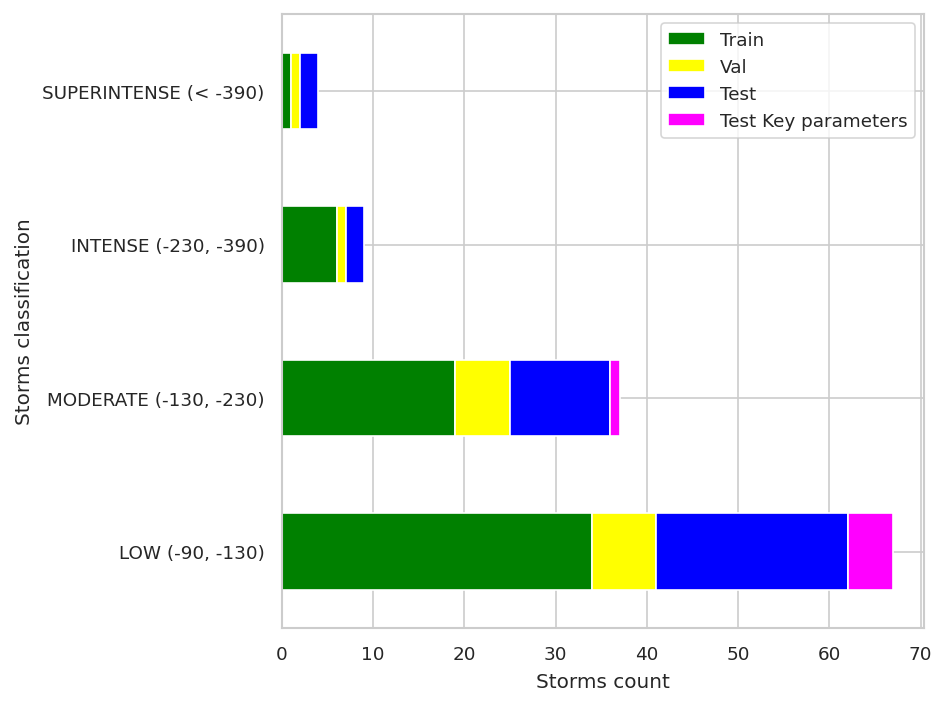

In [26]:
print("New distribution")

bar_df = pd.DataFrame(
    {
        f"LOW ({utils.SYM_H_THRESHOLD_LOW}, {utils.SYM_H_THRESHOLD_MODERATE})": [
            len(train_storms_low),
            len(val_storms_low),
            len(test_storms_low),
            len(test_key_storms_low)
        ],
        f"MODERATE ({utils.SYM_H_THRESHOLD_MODERATE}, {utils.SYM_H_THRESHOLD_INTENSE})": [
            len(train_storms_moderate),
            len(val_storms_moderate),
            len(test_storms_moderate),
            len(test_key_storms_moderate)
        ],
        f"INTENSE ({utils.SYM_H_THRESHOLD_INTENSE}, {utils.SYM_H_THRESHOLD_SUPERINTENSE})": [
            len(train_storms_intense),
            len(val_storms_intense),
            len(test_storms_intense),
            len(test_key_storms_intense)
        ],
        f"SUPERINTENSE (< {utils.SYM_H_THRESHOLD_SUPERINTENSE})": [
            len(train_storms_superintense),
            len(val_storms_superintense),
            len(test_storms_superintense),
            len(test_key_storms_superintense)
        ],
    },
    index=["Train", "Val", "Test", "Test Key parameters"],
)

print(f"Superintense:"
      f"\n\tTrain: {len(train_storms_superintense)} - {len(train_storms_superintense) / len(storms_superintense) * 100:.0f}%"
      f"\n\tValidation: {len(val_storms_superintense)} - {len(val_storms_superintense) / len(storms_superintense) * 100:.0f}%"
      f"\n\tTest: {len(test_storms_superintense)} - {len(test_storms_superintense) / len(storms_superintense) * 100:.0f}%"
     )

print(f"Intense:"
      f"\n\tTrain: {len(train_storms_intense)} - {len(train_storms_intense) / len(storms_intense) * 100:.0f}%"
      f"\n\tValidation: {len(val_storms_intense)} - {len(val_storms_intense) / len(storms_intense) * 100:.0f}%"
      f"\n\tTest: {len(test_storms_intense)} - {len(test_storms_intense) / len(storms_intense) * 100:.0f}%"
     )

print(f"Moderate:"
      f"\n\tTrain: {len(train_storms_moderate)} - {len(train_storms_moderate) / len(storms_moderate) * 100:.0f}%"
      f"\n\tValidation: {len(val_storms_moderate)} - {len(val_storms_moderate) / len(storms_moderate) * 100:.0f}%"
      f"\n\tTest: {len(test_storms_moderate)} - {len(test_storms_moderate) / len(storms_moderate) * 100:.0f}%"
     )

print(f"Low:"
      f"\n\tTrain: {len(train_storms_low)} - {len(train_storms_low) / len(storms_low) * 100:.0f}%"
      f"\n\tValidation: {len(val_storms_low)} - {len(val_storms_low) / len(storms_low) * 100:.0f}%"
      f"\n\tTest: {len(test_storms_low)} - {len(test_storms_low) / len(storms_low) * 100:.0f}%"
     )

str_key = ''
if len(test_key_storms_superintense) > 0:
    str_key += f'{len(test_key_storms_superintense)} Superintense '
if len(test_key_storms_intense) > 0:
    str_key += f'{len(test_key_storms_intense)} Intense '
if len(test_key_storms_moderate) > 0:
    str_key += f'{len(test_key_storms_moderate)} Moderate '
if len(test_key_storms_low) > 0:
    str_key += f'{len(test_key_storms_low)} Low '

print(f"Test key storms: {str_key}")

bar_df.T.plot(
    kind="barh",
    stacked=True,
    color=["Green", "Yellow", "Blue", "Magenta"],
    xlabel="Storms count",
    ylabel="Storms classification",
);
plt.tight_layout();
#plt.savefig('./report_figs/new_sym_storms_split.png')
plt.show();

## Plot of the storms <a class="anchor" id="section_3_5"></a>

### Plot of the superintense storms <a class="anchor" id="section_3_5_1"></a>

Plotting the training superintense storms


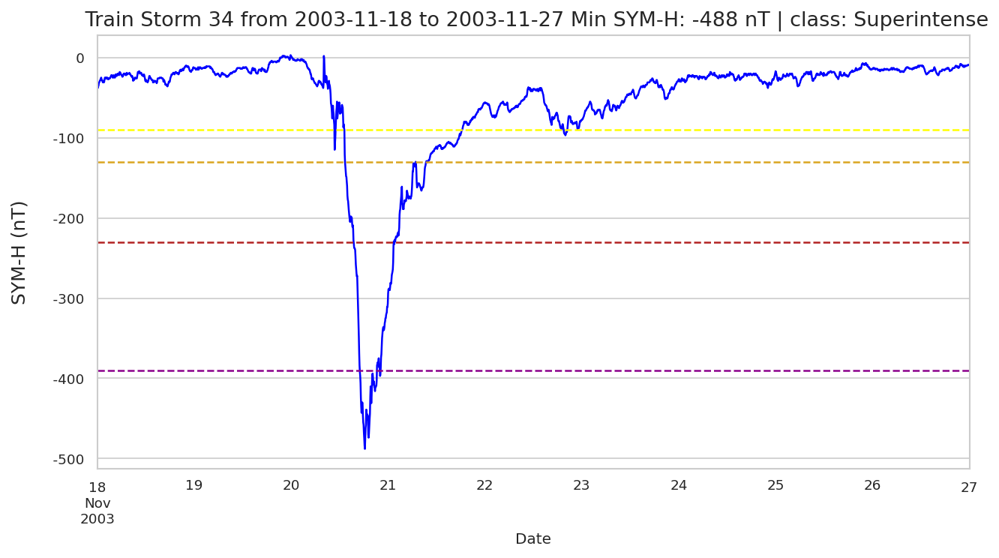

Plotting the validation superintense storms


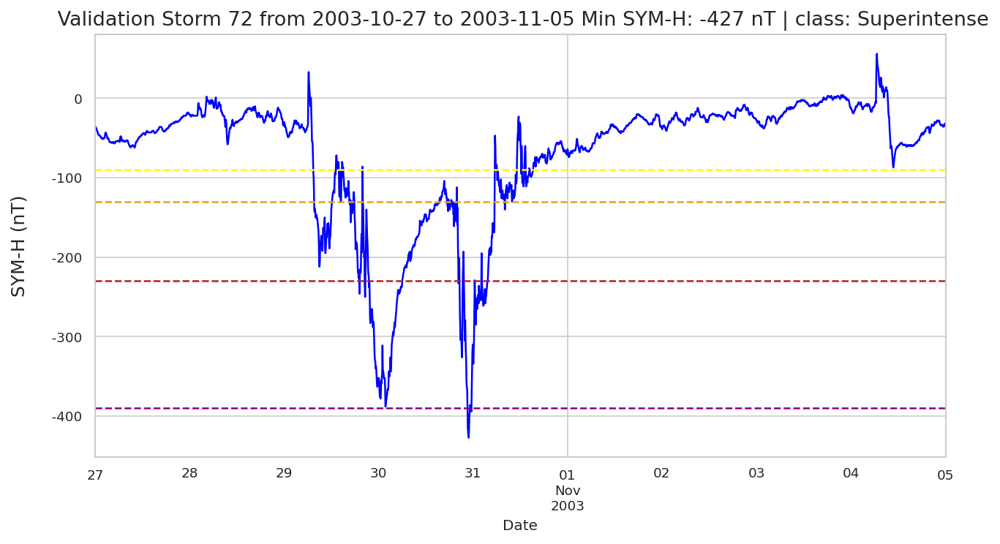

Plotting the test superintense storms


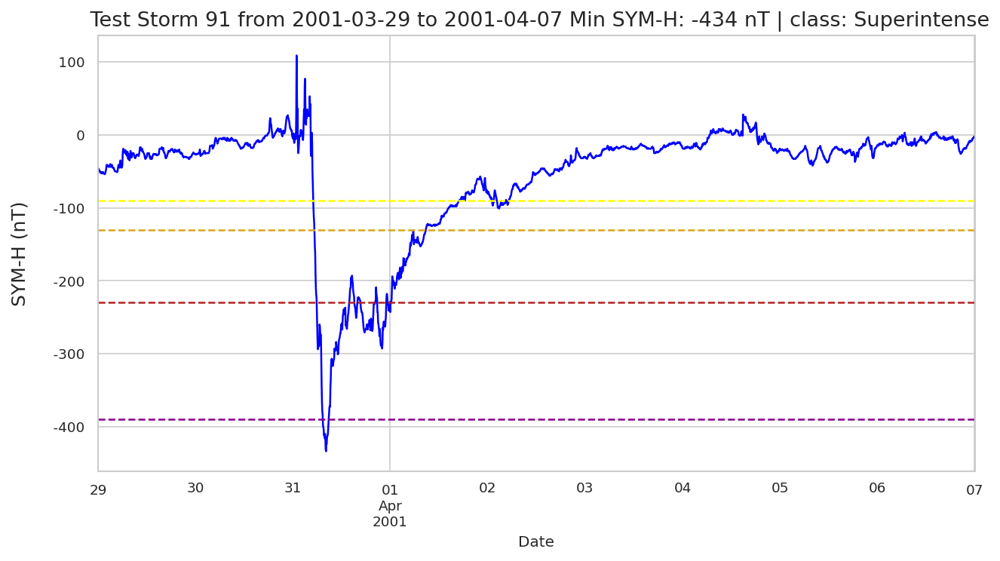

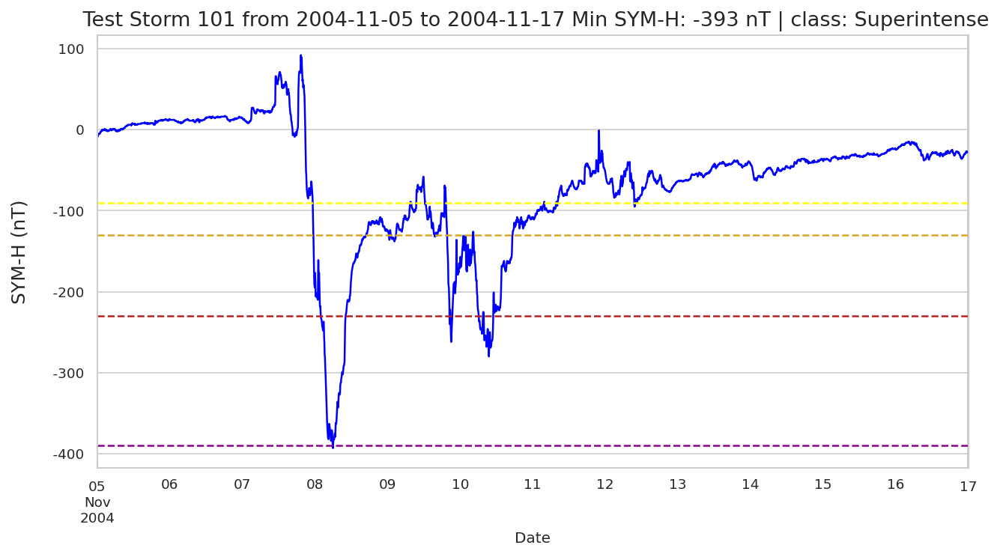

In [27]:
print('Plotting the training superintense storms')
for _,storm_row in new_storms_df.loc[(new_storms_df['classification'] == 'Superintense') & 
                                     (new_storms_df['subset'] == 'Train')].iterrows():
    utils.plot_storm_sym(indices[storm_row['Start date'] : storm_row['End date']], 
                         storm_row['subset'], 
                         storm_row['previous_subset'] == 'New storm',
                         storm_row['Storm index'])
    plt.show();
    
print('Plotting the validation superintense storms')
for _,storm_row in new_storms_df.loc[(new_storms_df['classification'] == 'Superintense') & 
                                     (new_storms_df['subset'] == 'Validation')].iterrows():
    utils.plot_storm_sym(indices[storm_row['Start date'] : storm_row['End date']], 
                         storm_row['subset'], 
                         storm_row['previous_subset'] == 'New storm',
                         storm_row['Storm index'])
    plt.show();
    
print('Plotting the test superintense storms')
for _,storm_row in new_storms_df.loc[(new_storms_df['classification'] == 'Superintense') & 
                                     (new_storms_df['subset'] == 'Test')].iterrows():
    utils.plot_storm_sym(indices[storm_row['Start date'] : storm_row['End date']], 
                         storm_row['subset'], 
                         storm_row['previous_subset'] == 'New storm',
                         storm_row['Storm index'])
    plt.show();

### Plot of the intense storms <a class="anchor" id="section_3_5_2"></a>

Plotting the training intense storms


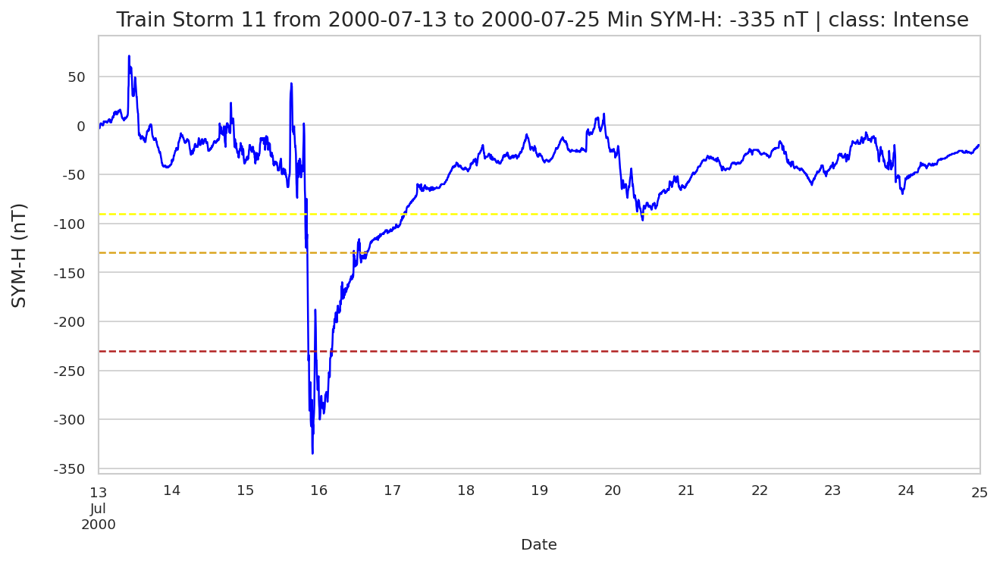

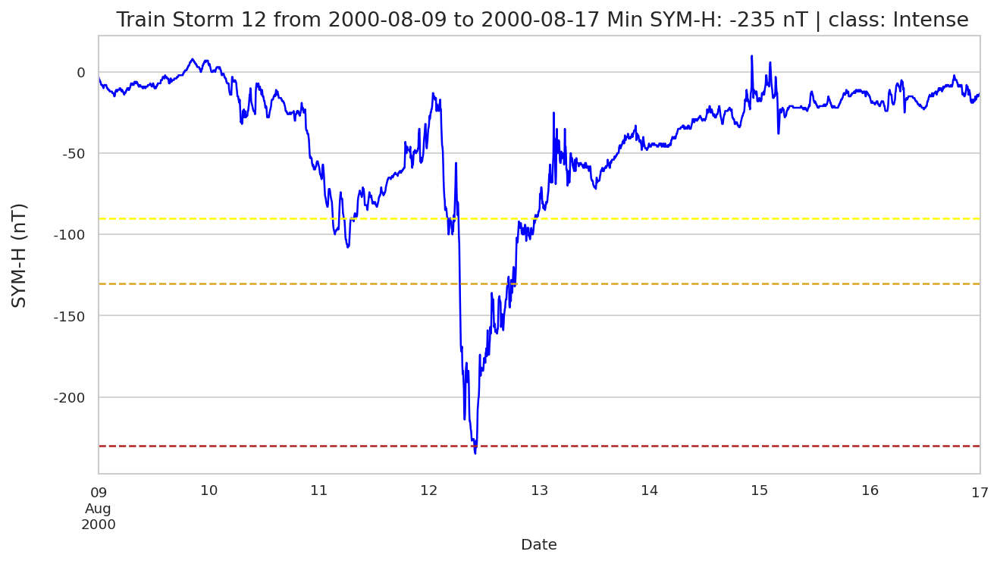

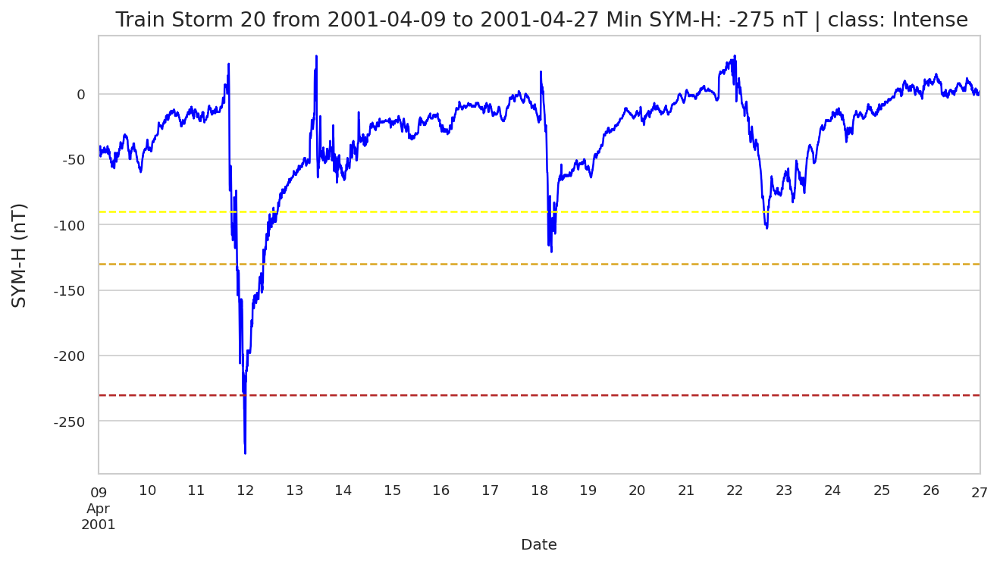

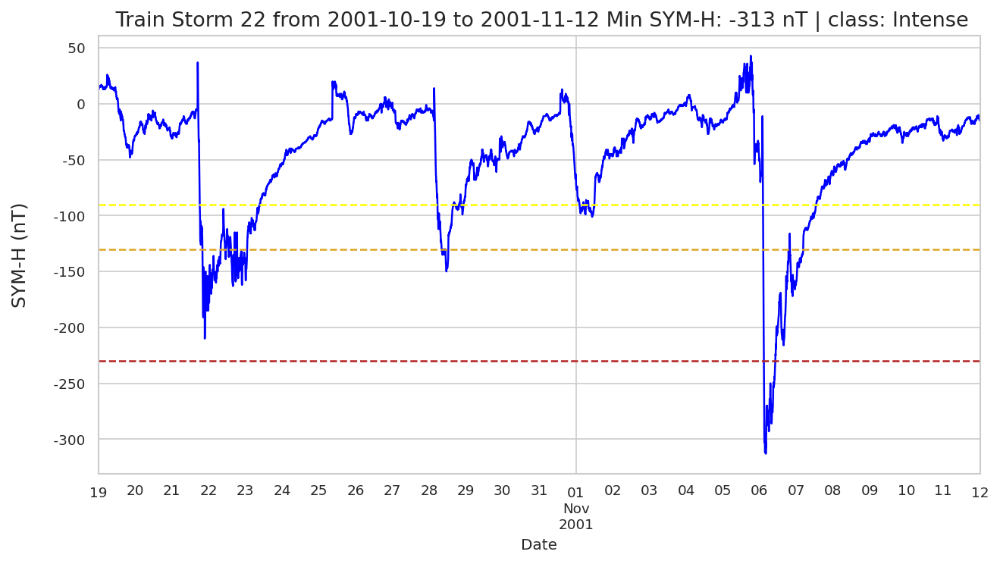

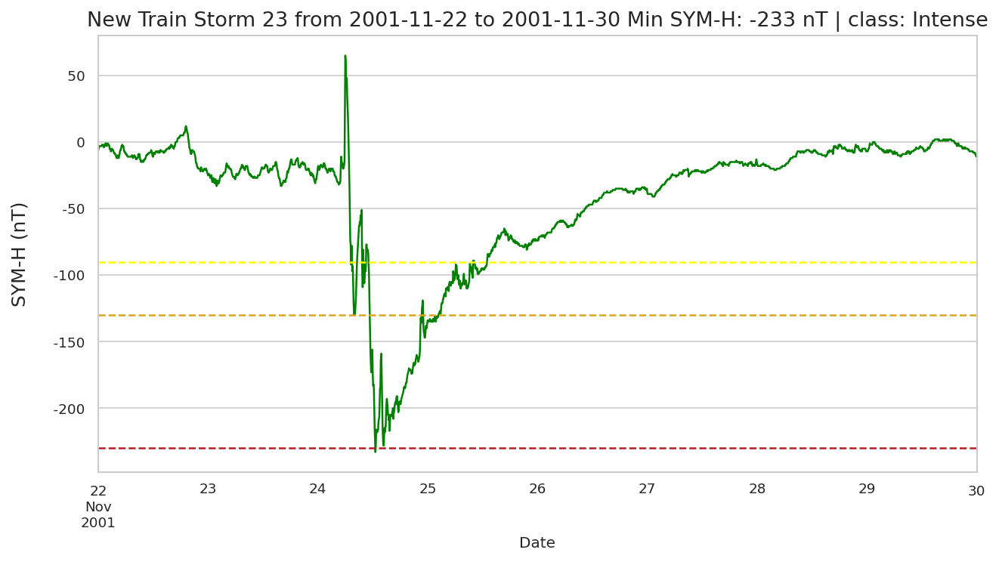

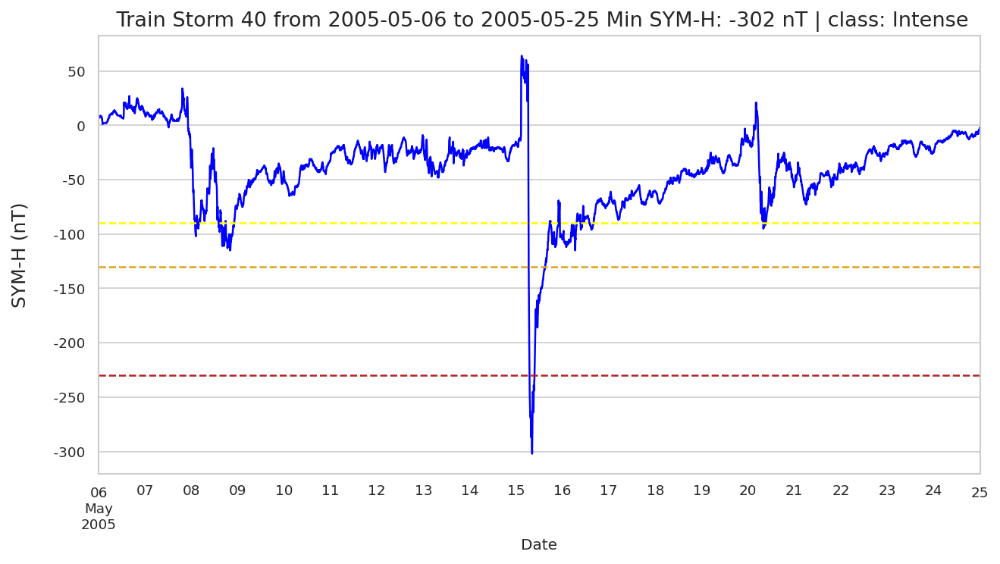

Plotting the validation intense storms


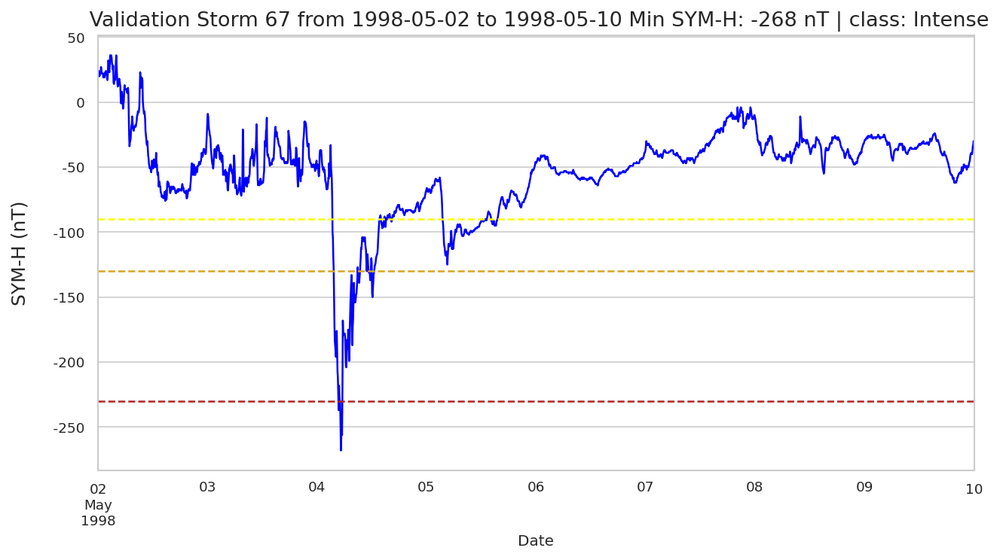

Plotting the test intense storms


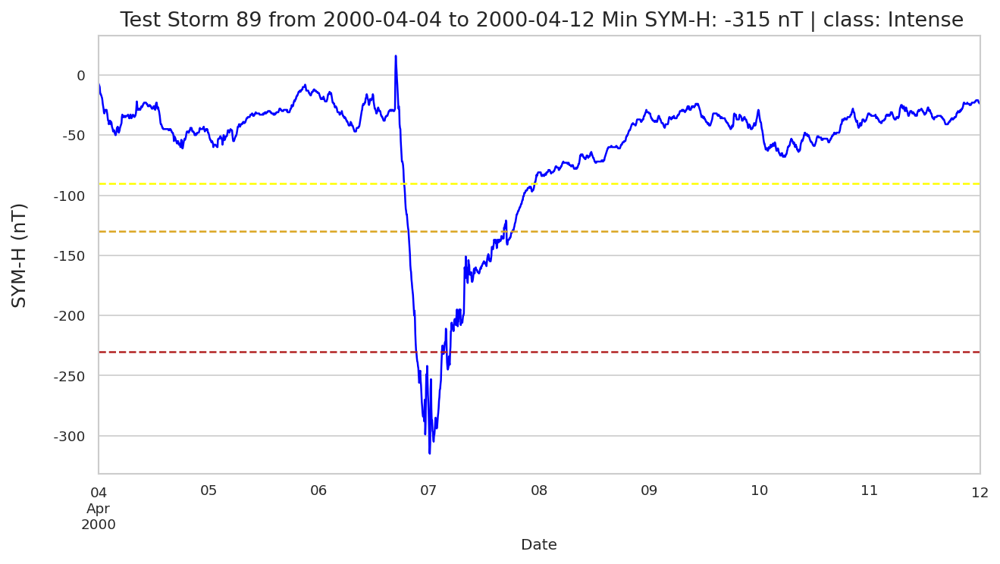

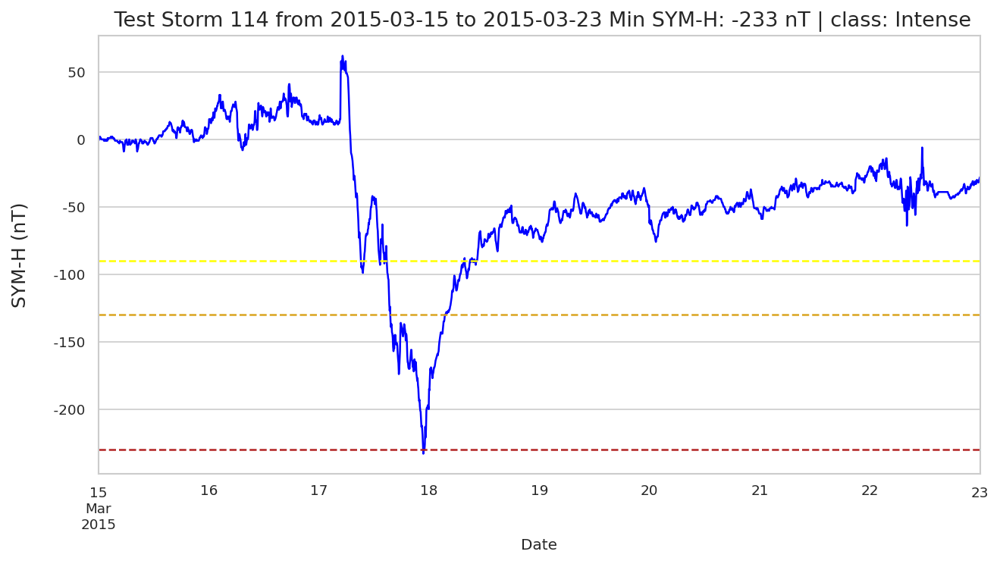

In [28]:
print('Plotting the training intense storms')
for _,storm_row in new_storms_df.loc[(new_storms_df['classification'] == 'Intense') & 
                                     (new_storms_df['subset'] == 'Train')].iterrows():
    utils.plot_storm_sym(indices[storm_row['Start date'] : storm_row['End date']], 
                         storm_row['subset'], 
                         storm_row['previous_subset'] == 'New storm',
                         storm_row['Storm index'])
    plt.show();
    
print('Plotting the validation intense storms')
for _,storm_row in new_storms_df.loc[(new_storms_df['classification'] == 'Intense') & 
                                     (new_storms_df['subset'] == 'Validation')].iterrows():
    utils.plot_storm_sym(indices[storm_row['Start date'] : storm_row['End date']], 
                         storm_row['subset'], 
                         storm_row['previous_subset'] == 'New storm',
                         storm_row['Storm index'])
    plt.show();
    
print('Plotting the test intense storms')
for _,storm_row in new_storms_df.loc[(new_storms_df['classification'] == 'Intense') & 
                                     (new_storms_df['subset'] == 'Test')].iterrows():
    utils.plot_storm_sym(indices[storm_row['Start date'] : storm_row['End date']], 
                         storm_row['subset'], 
                         storm_row['previous_subset'] == 'New storm',
                         storm_row['Storm index'])
    plt.show();

### Plot of the moderate storms <a class="anchor" id="section_3_5_3"></a>

Plotting the training moderate storms


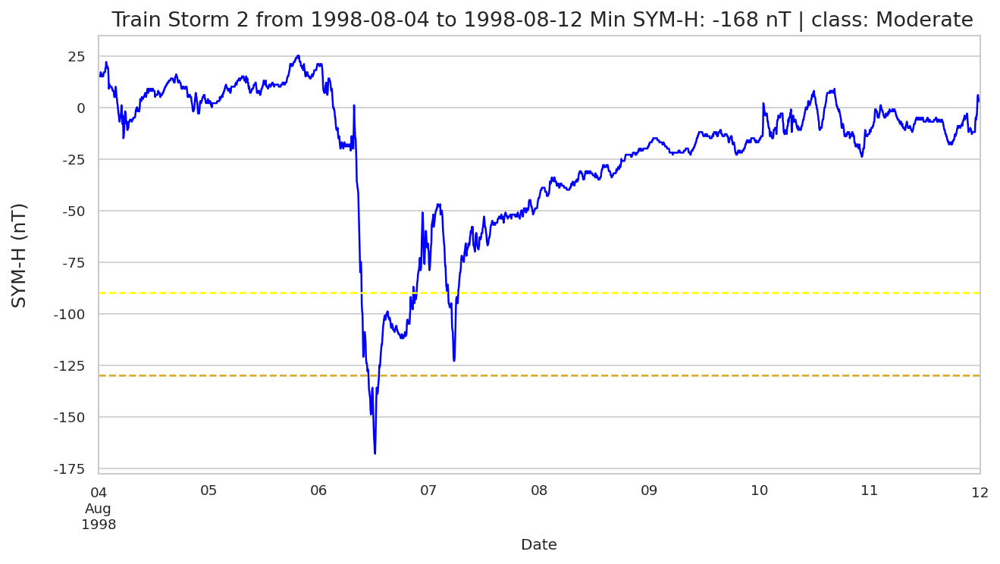

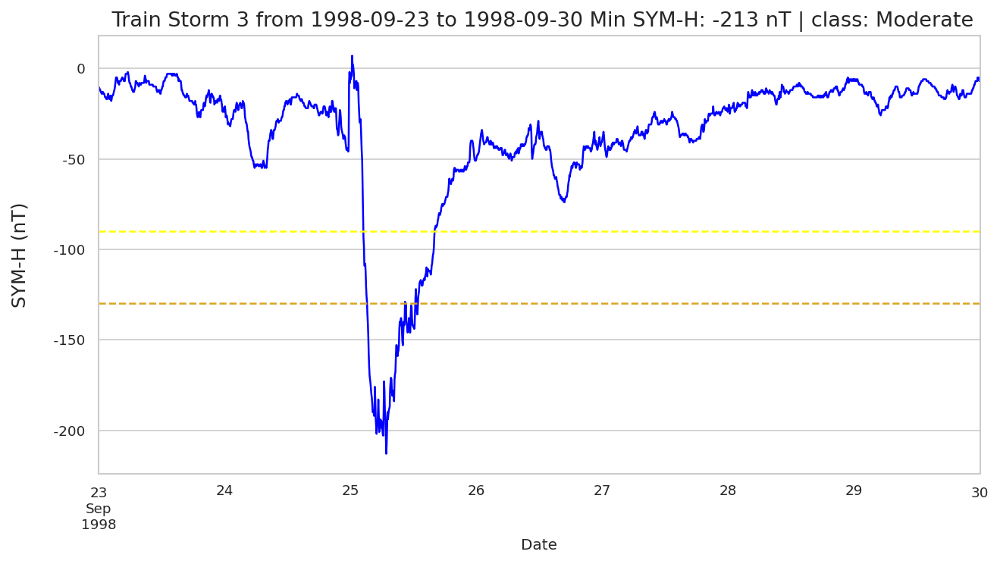

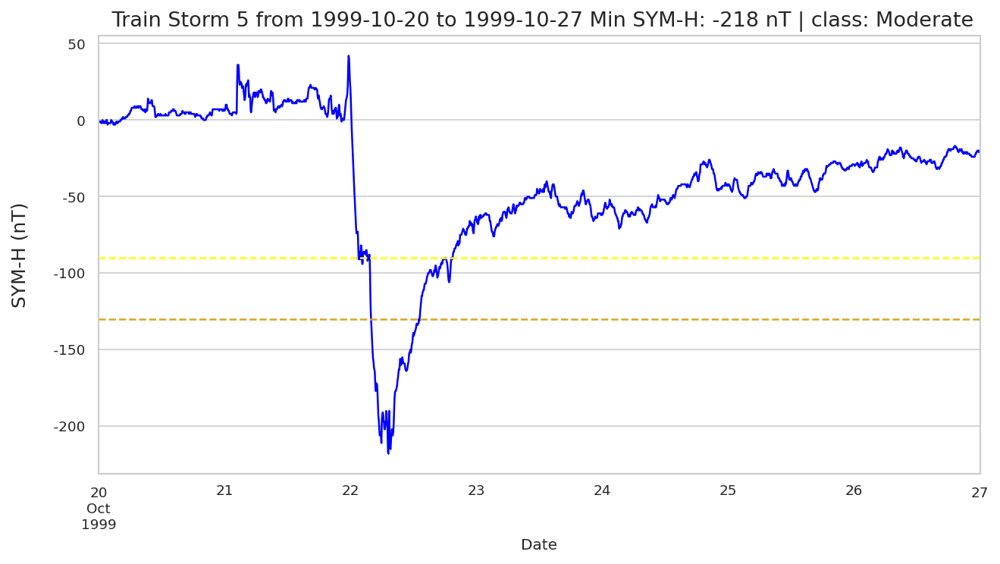

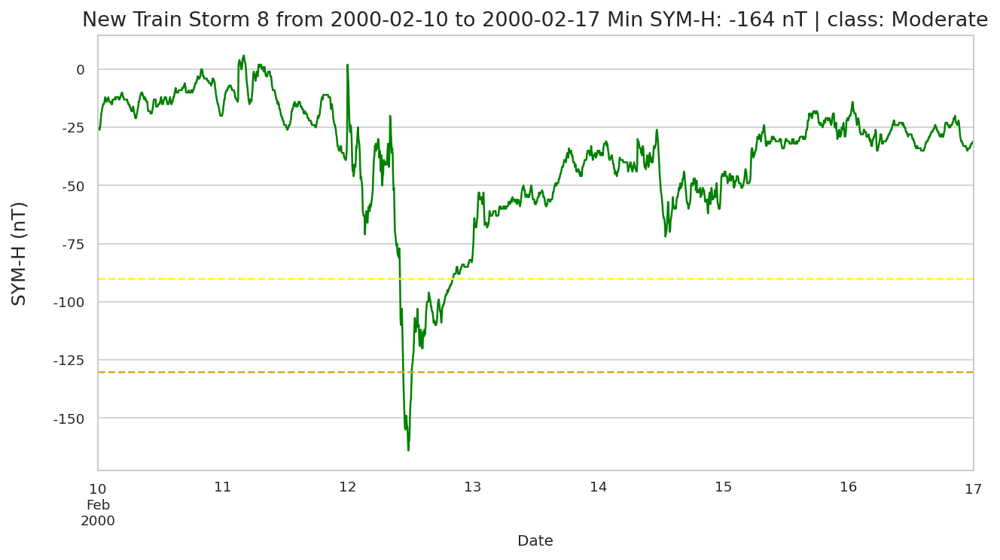

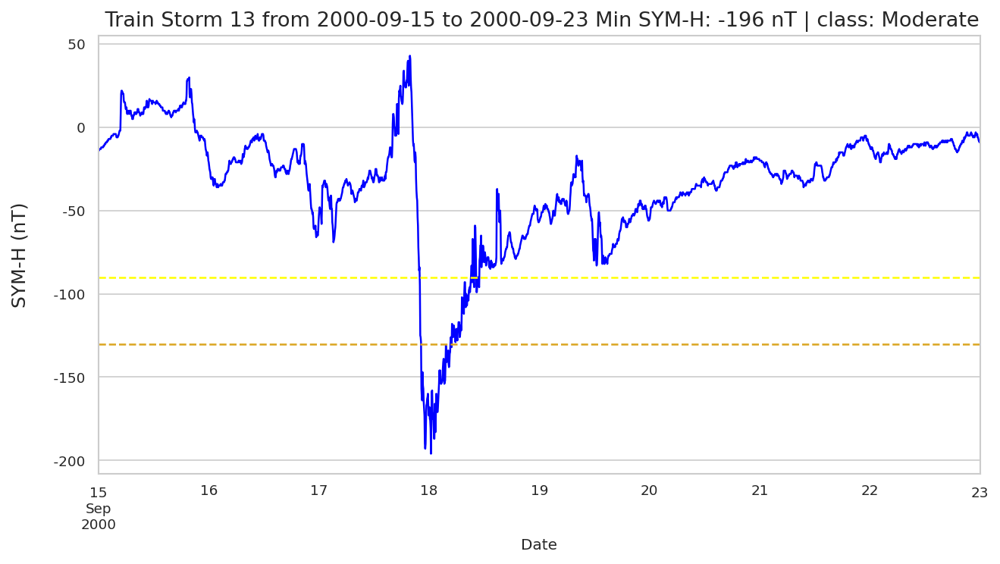

...

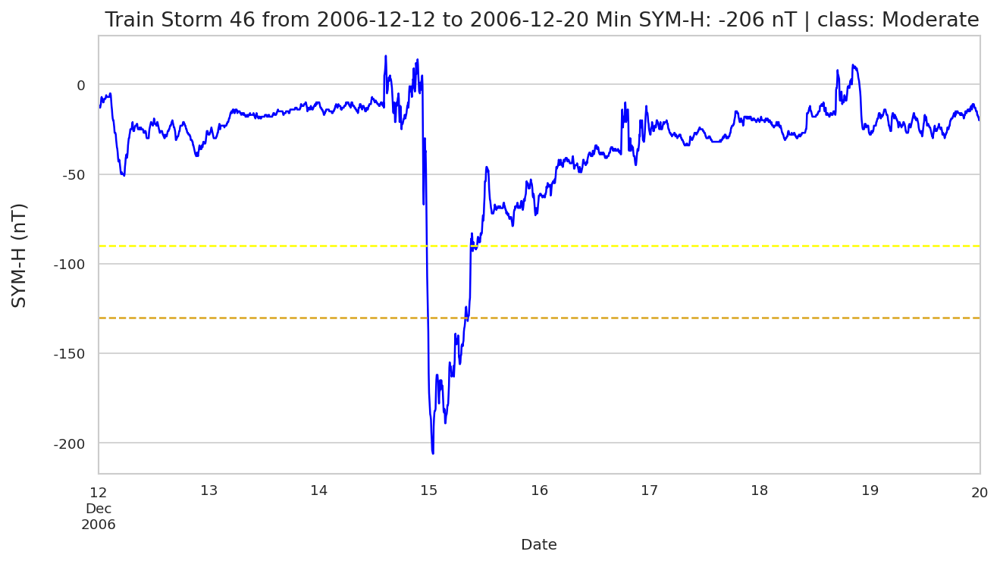

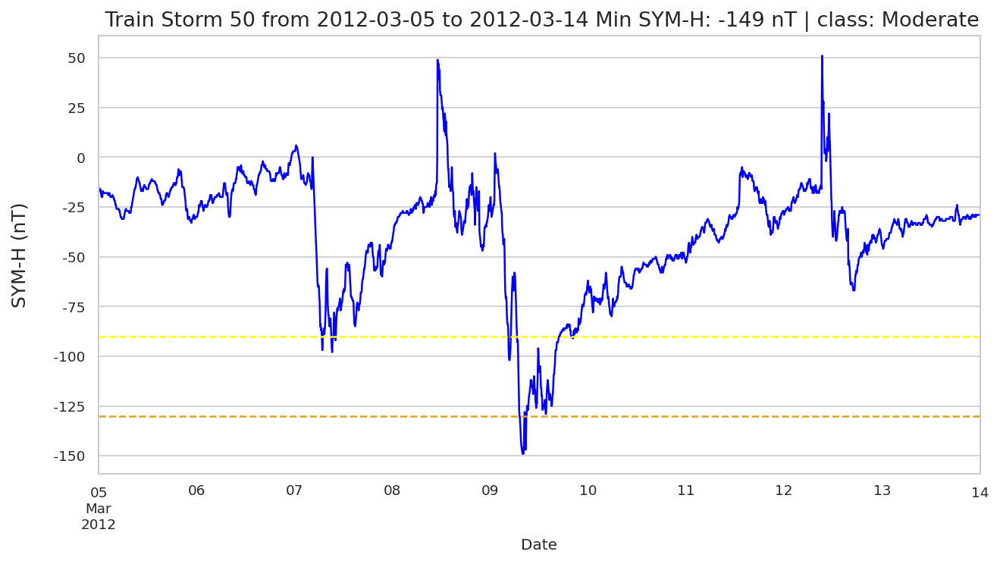

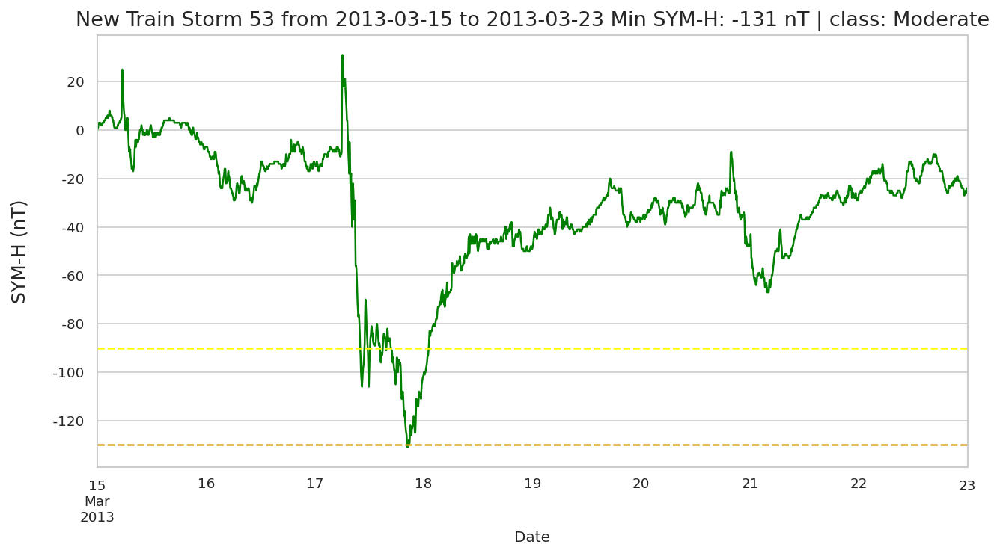

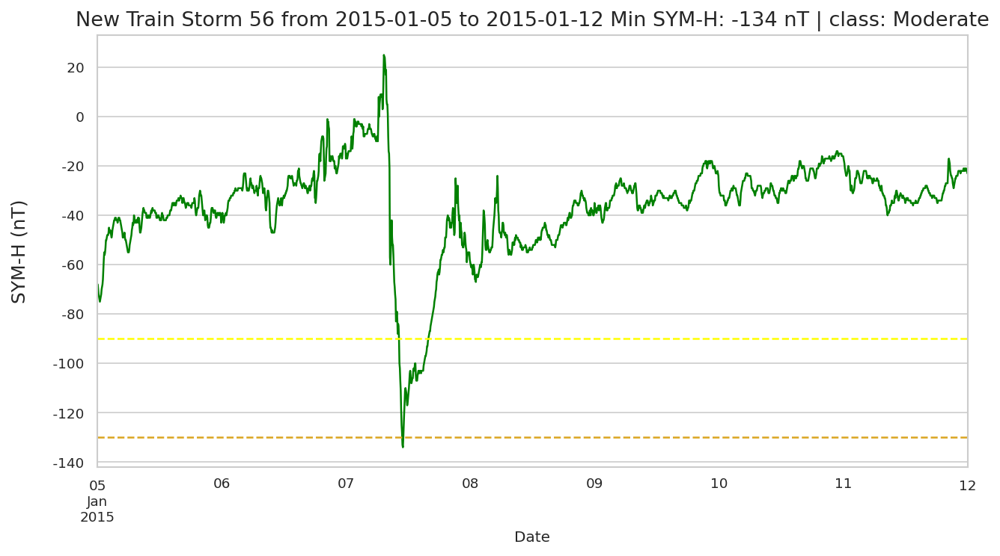

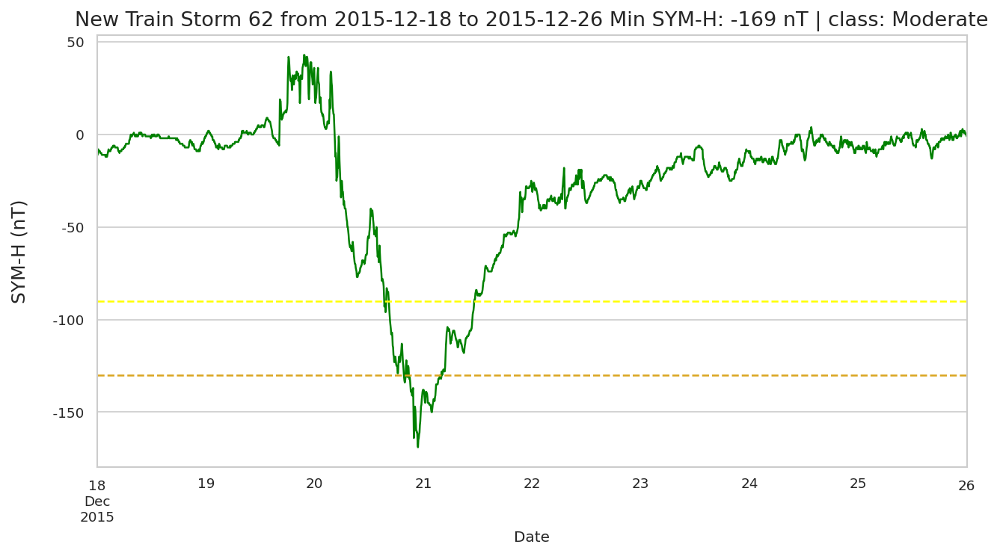

Plotting the validation moderate storms


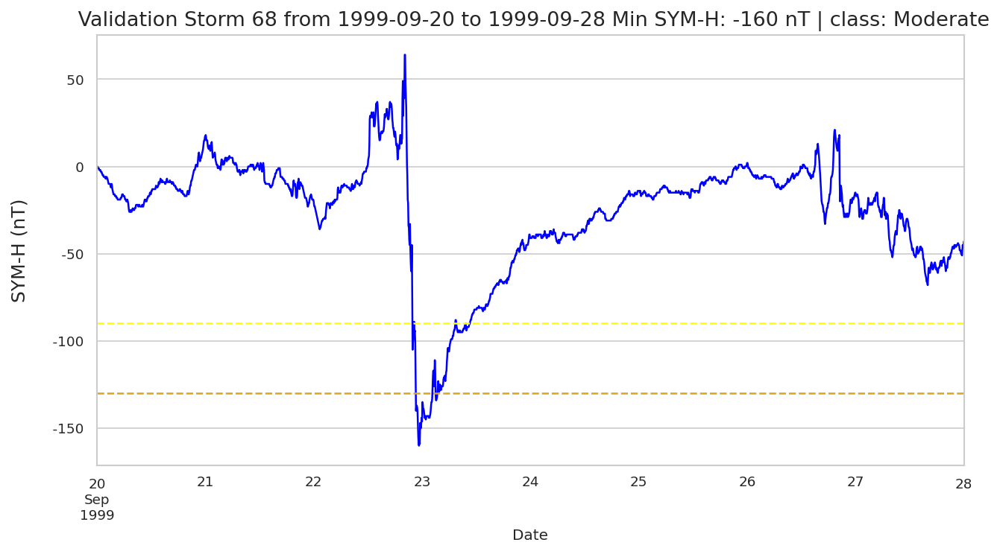

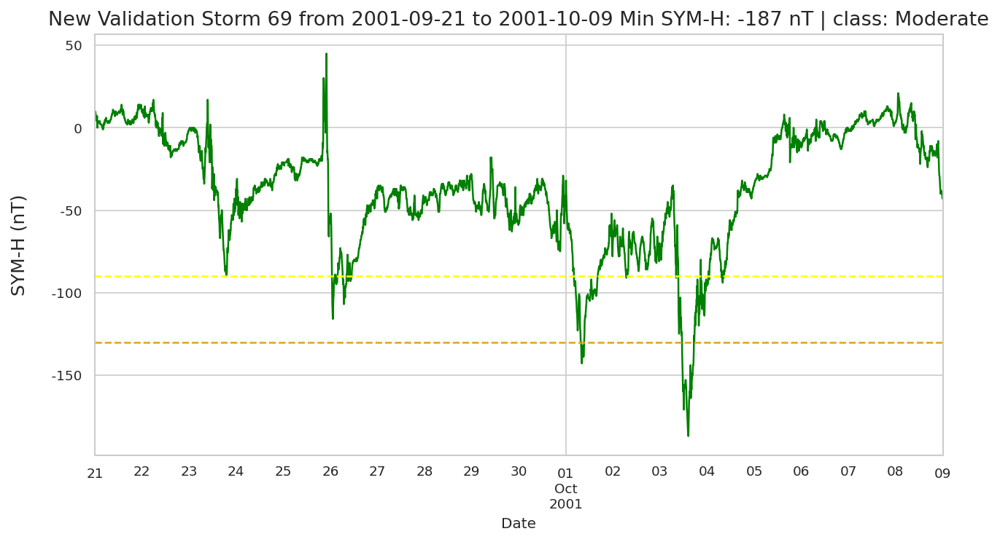

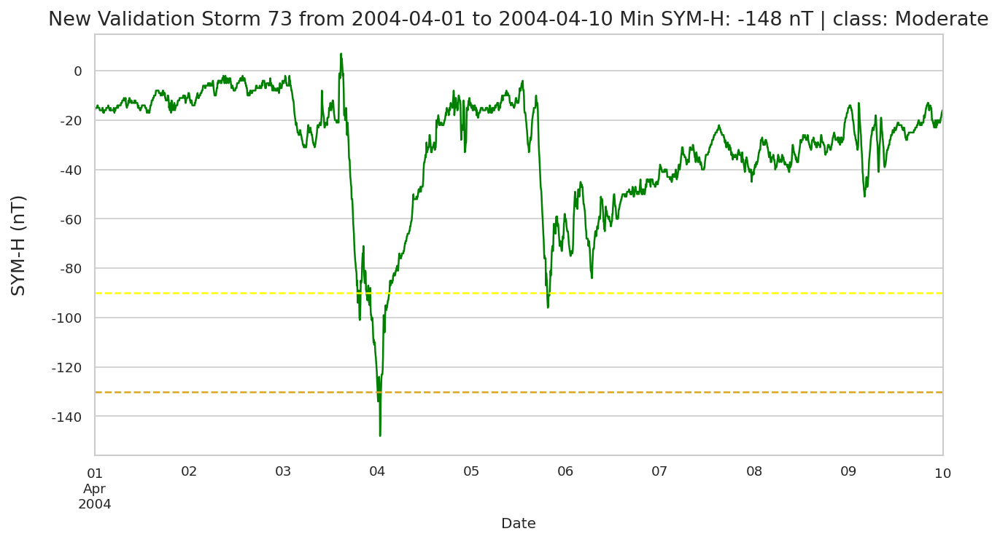

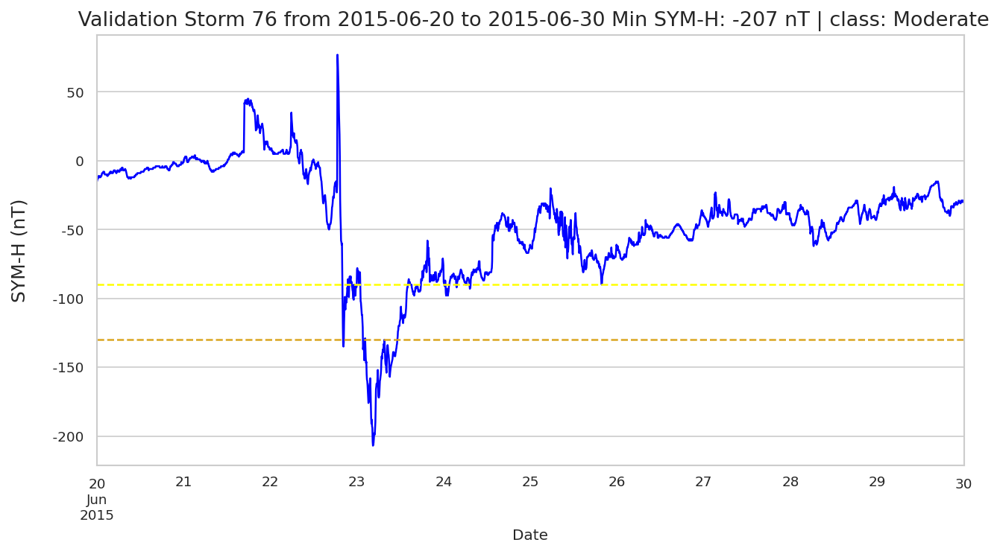

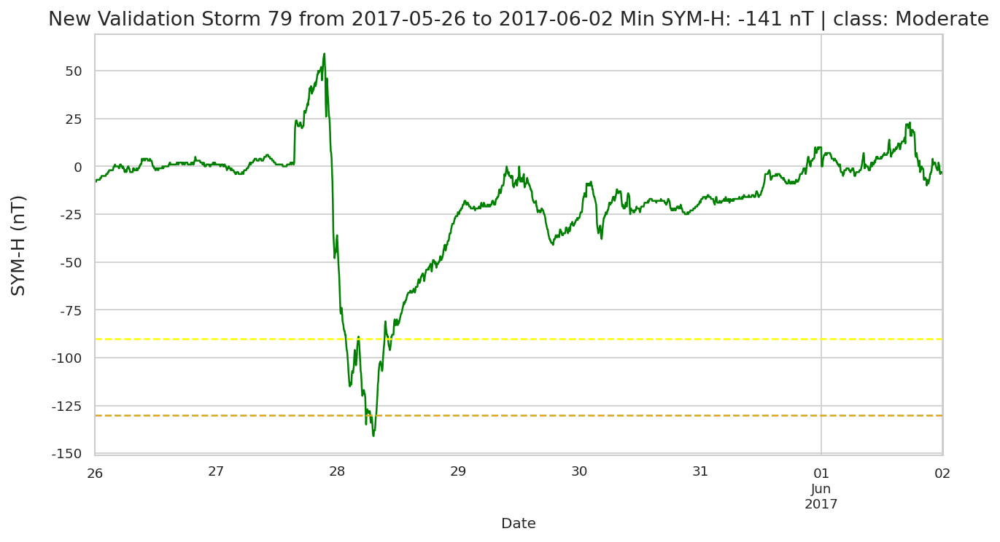

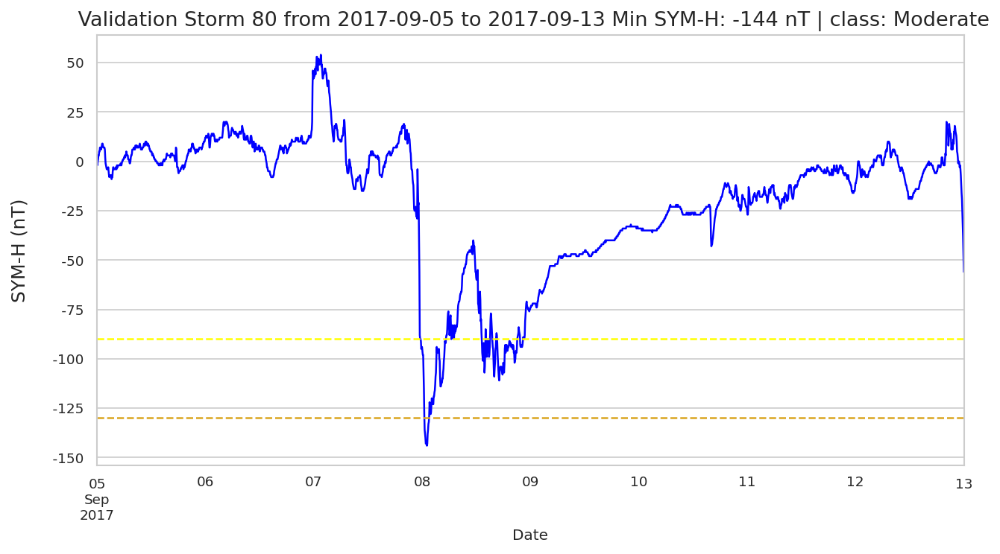

Plotting the test moderate storms


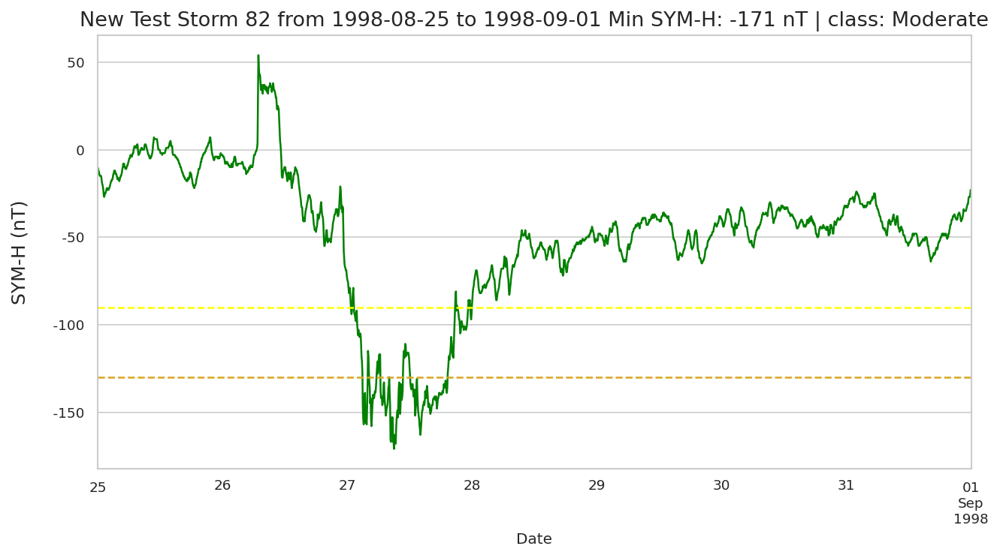

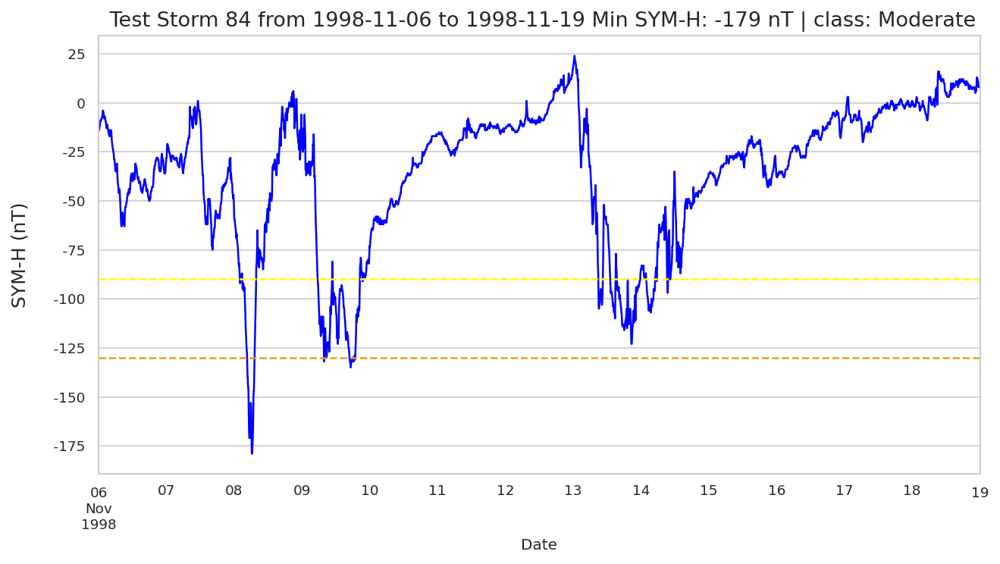

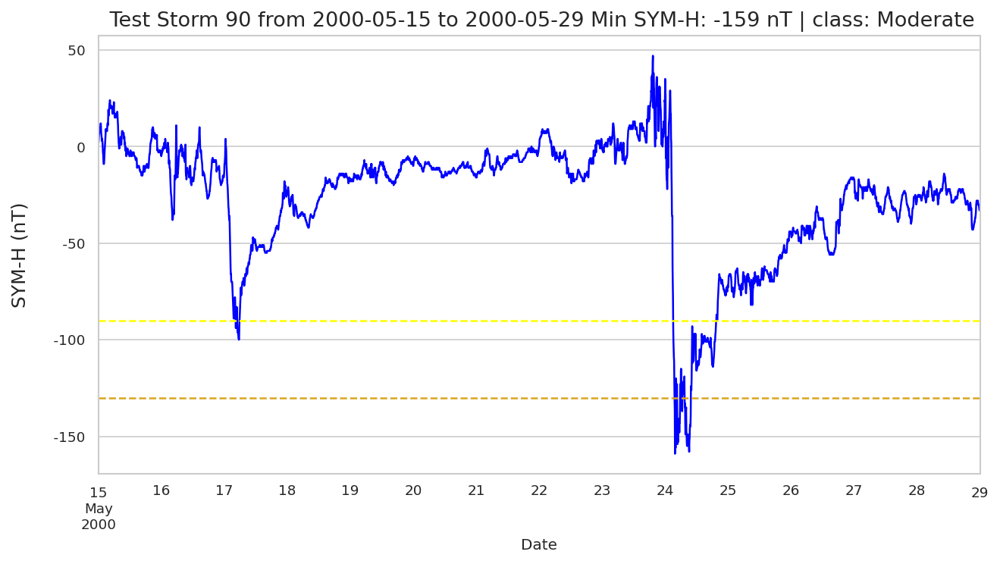

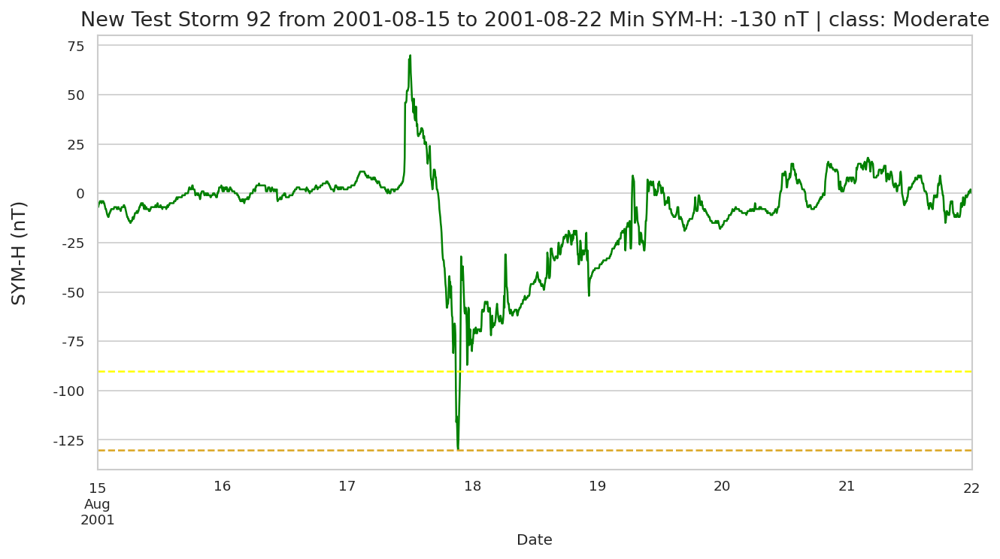

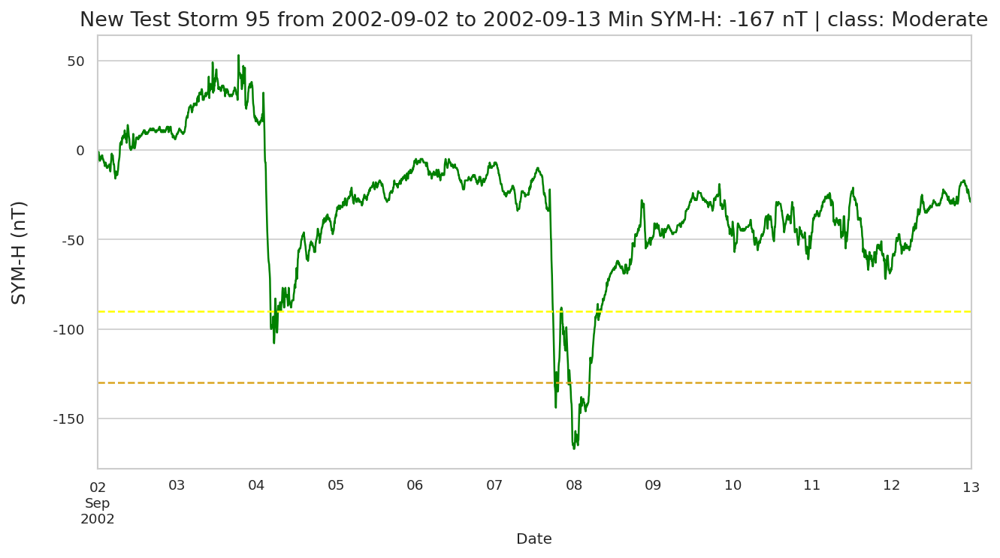

...

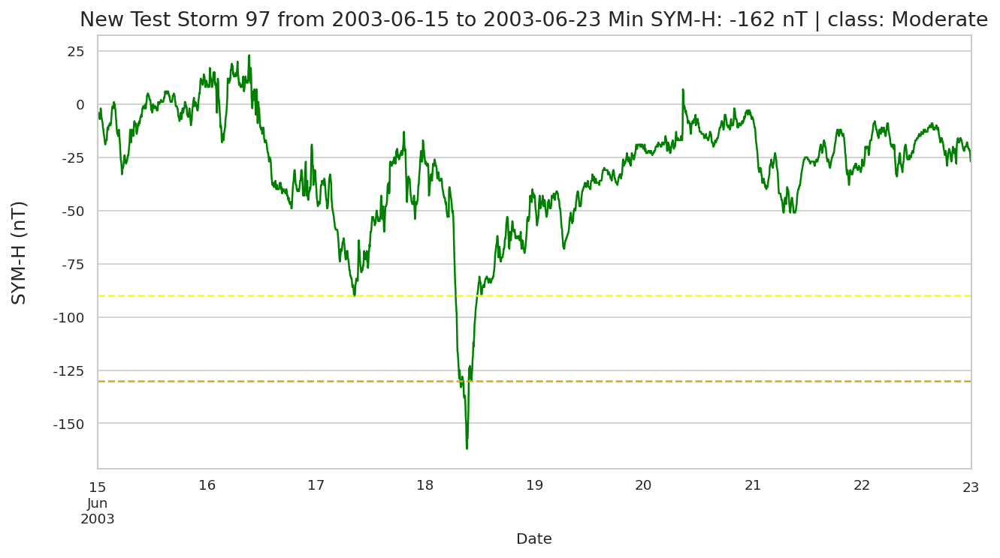

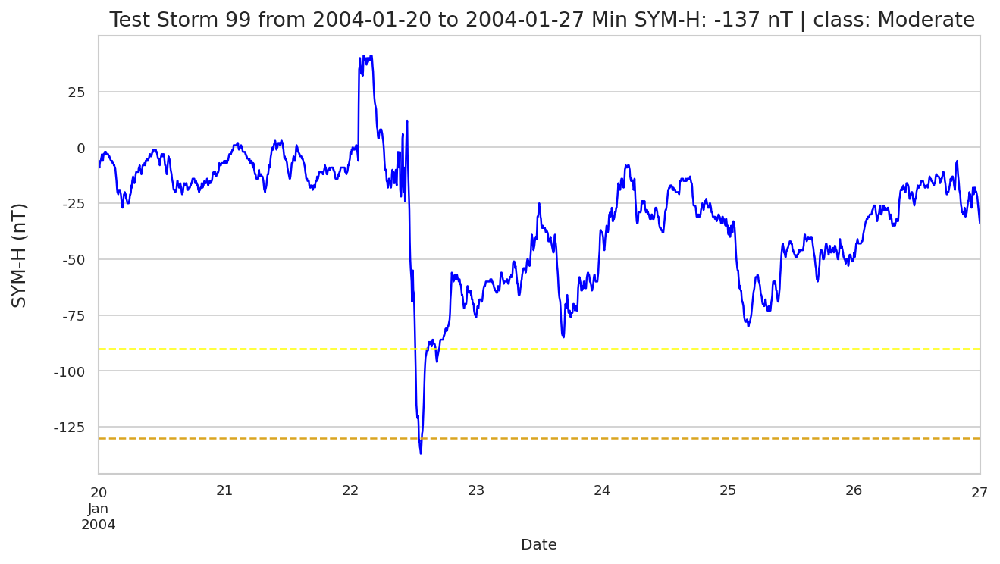

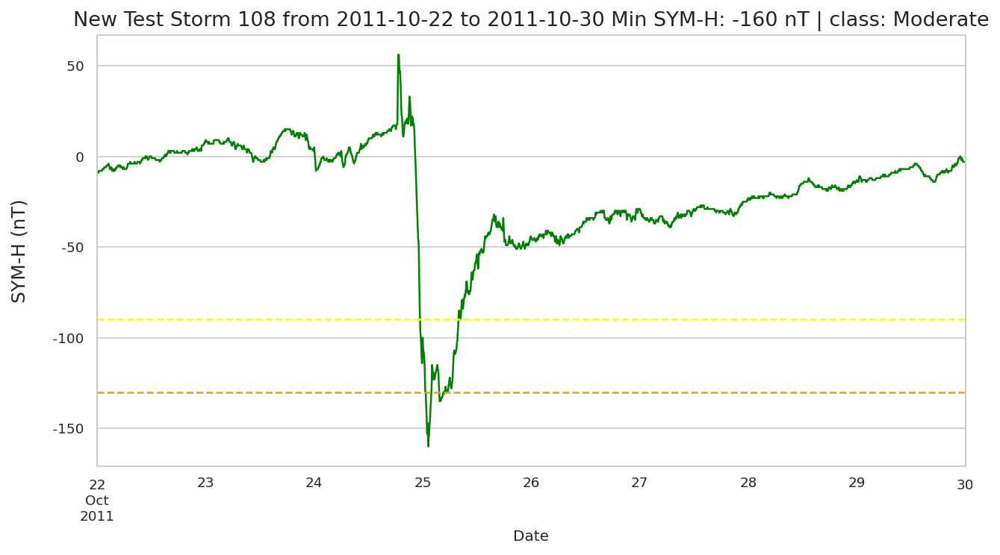

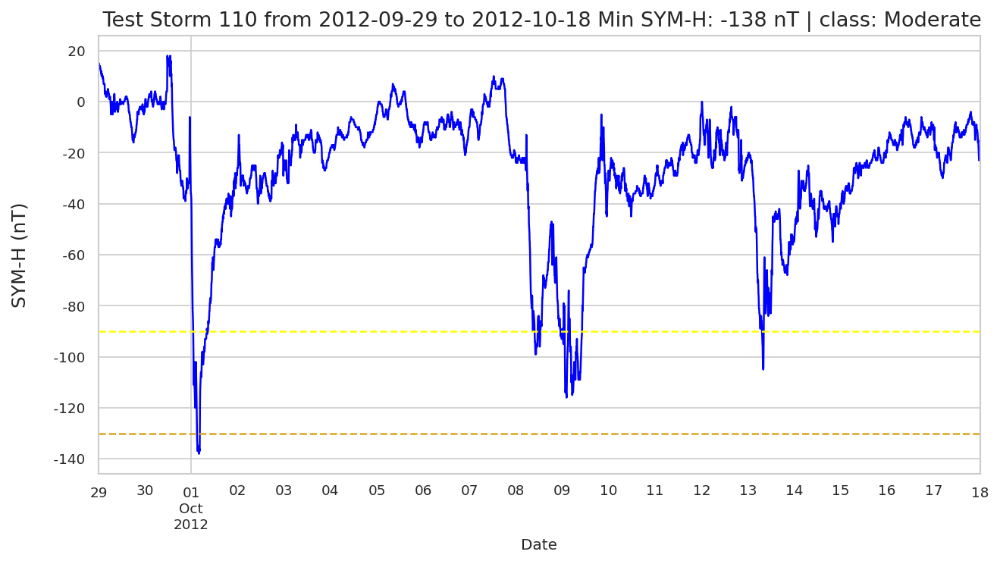

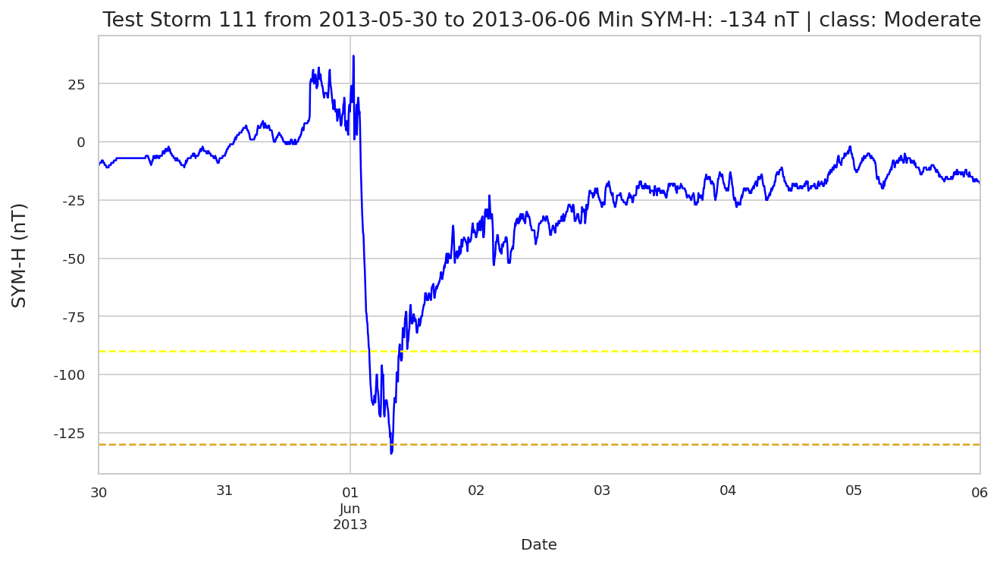

In [29]:
print('Plotting the training moderate storms')
for _,storm_row in new_storms_df.loc[(new_storms_df['classification'] == 'Moderate') & 
                                     (new_storms_df['subset'] == 'Train')].iterrows():
    utils.plot_storm_sym(indices[storm_row['Start date'] : storm_row['End date']], 
                         storm_row['subset'], 
                         storm_row['previous_subset'] == 'New storm',
                         storm_row['Storm index'])
    plt.show();
    
print('Plotting the validation moderate storms')
for _,storm_row in new_storms_df.loc[(new_storms_df['classification'] == 'Moderate') & 
                                     (new_storms_df['subset'] == 'Validation')].iterrows():
    utils.plot_storm_sym(indices[storm_row['Start date'] : storm_row['End date']], 
                         storm_row['subset'], 
                         storm_row['previous_subset'] == 'New storm',
                         storm_row['Storm index'])
    plt.show();
    
print('Plotting the test moderate storms')
for _,storm_row in new_storms_df.loc[(new_storms_df['classification'] == 'Moderate') & 
                                     (new_storms_df['subset'] == 'Test')].iterrows():
    utils.plot_storm_sym(indices[storm_row['Start date'] : storm_row['End date']], 
                         storm_row['subset'], 
                         storm_row['previous_subset'] == 'New storm',
                         storm_row['Storm index'])
    plt.show();

### Plot of the low storms <a class="anchor" id="section_3_5_4"></a>

Plotting the training low storms


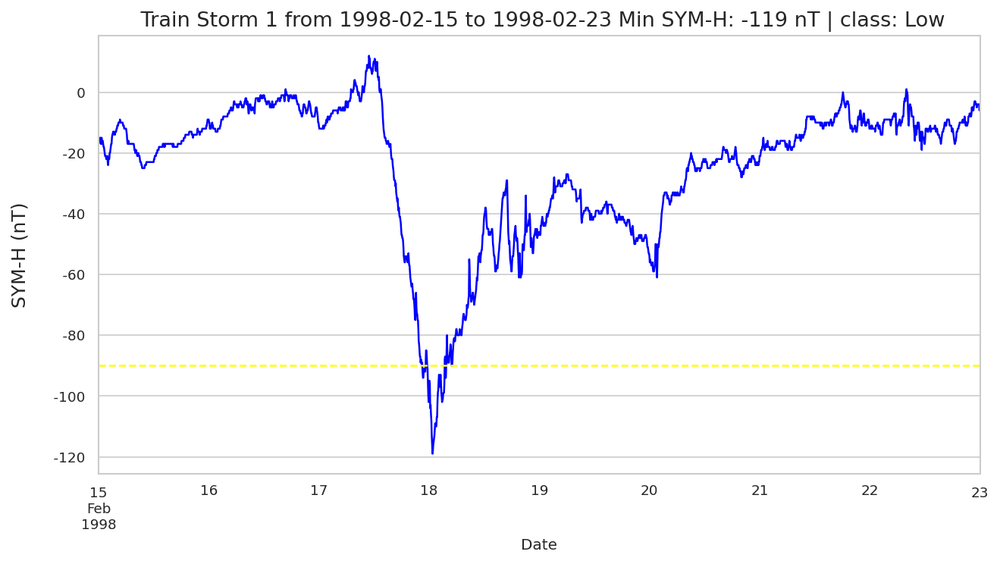

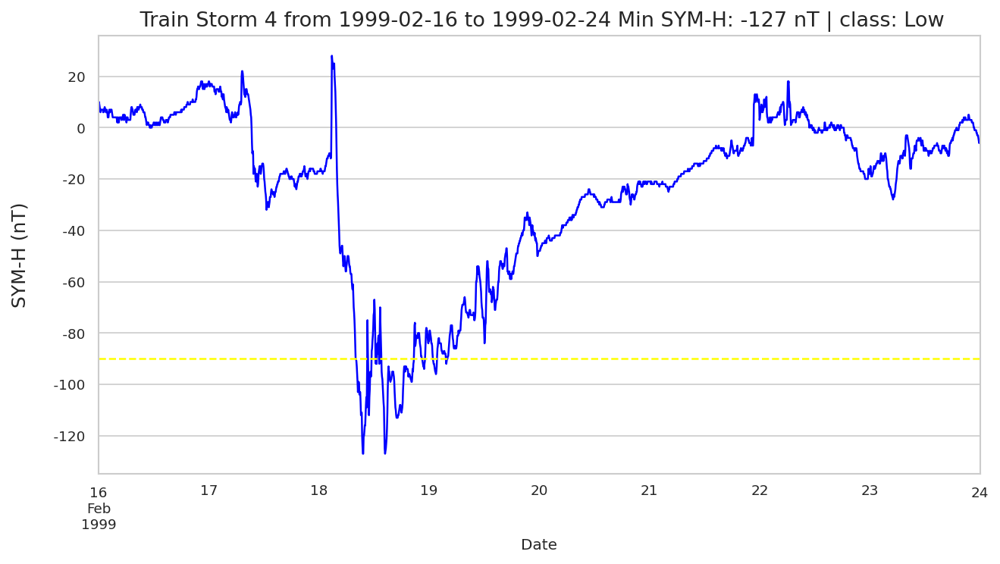

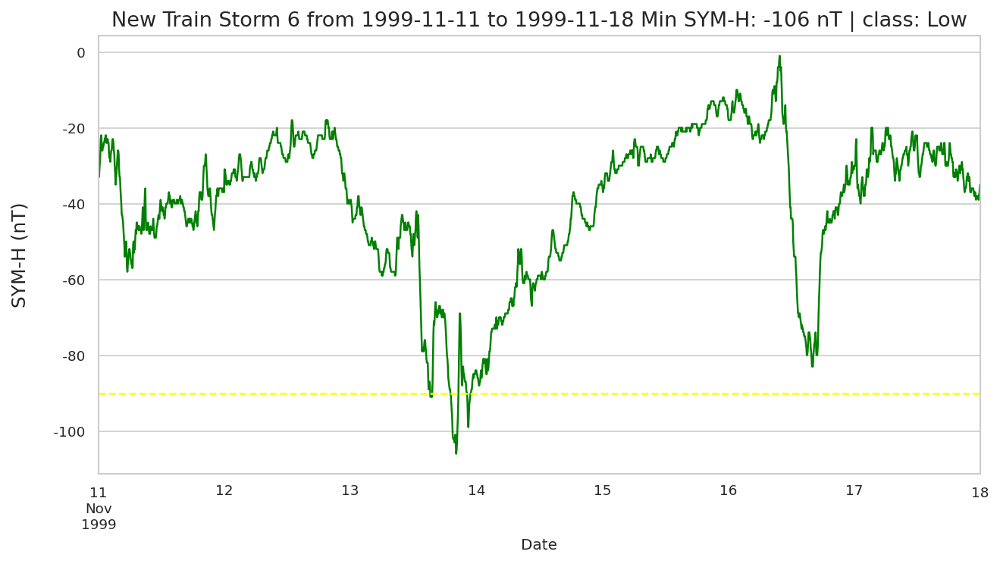

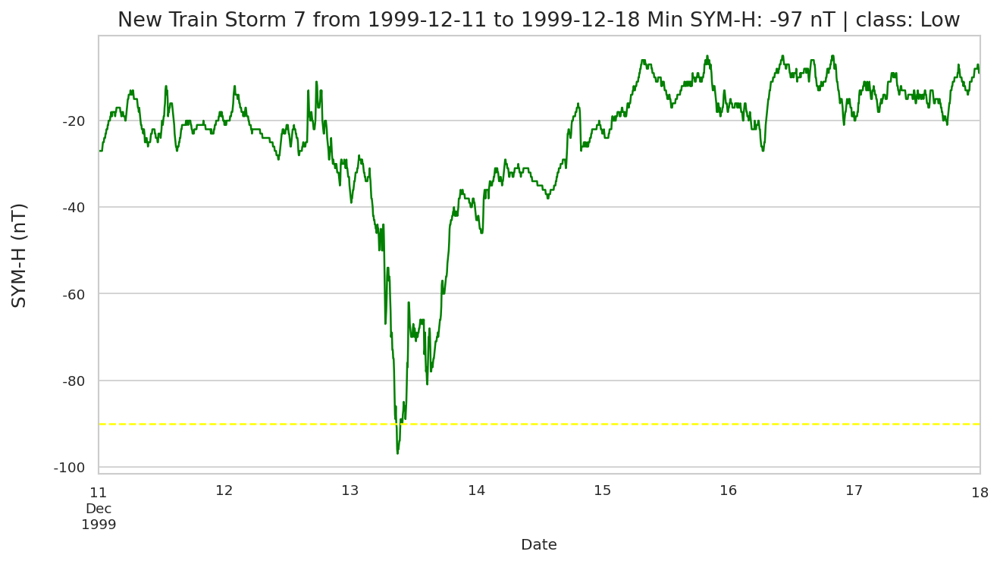

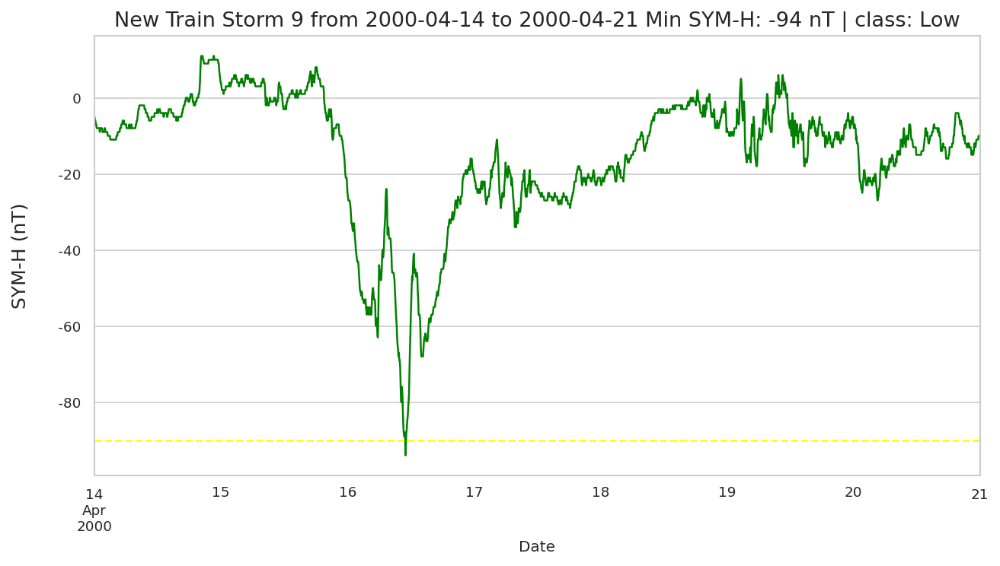

...

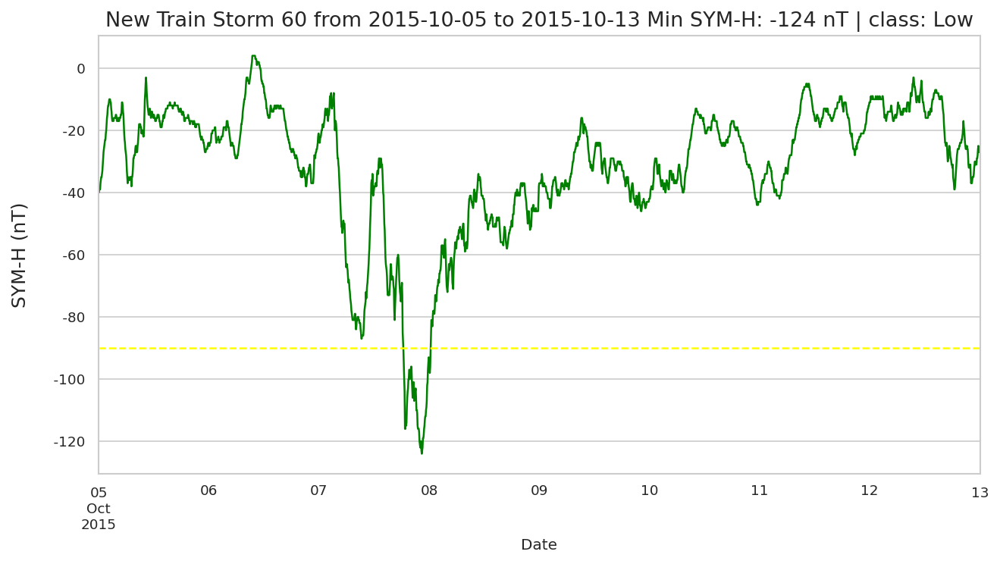

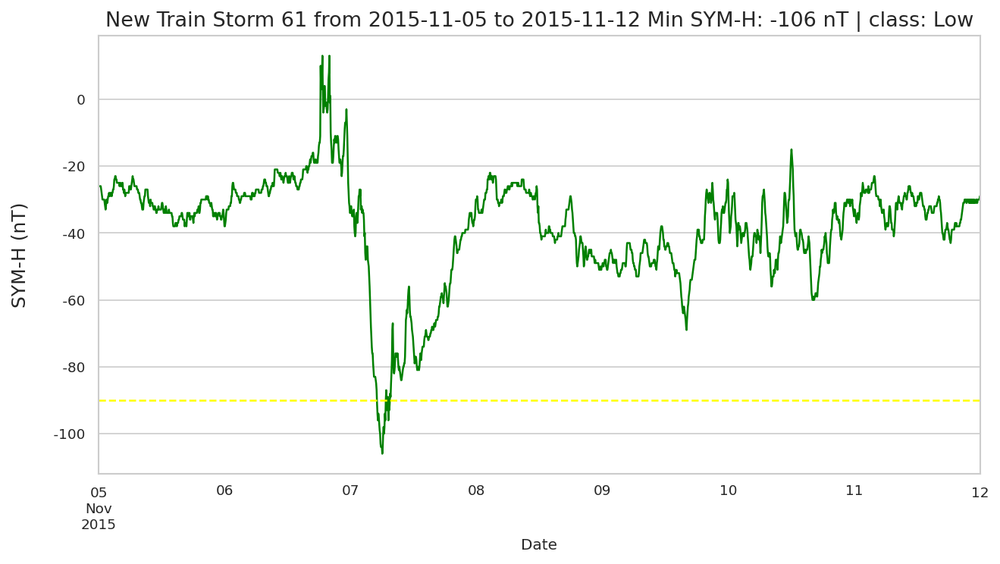

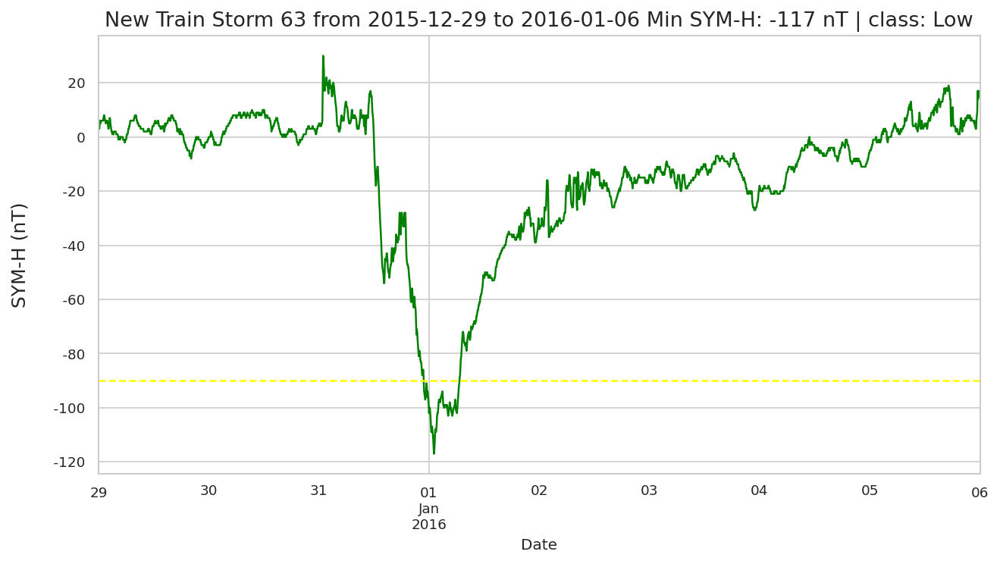

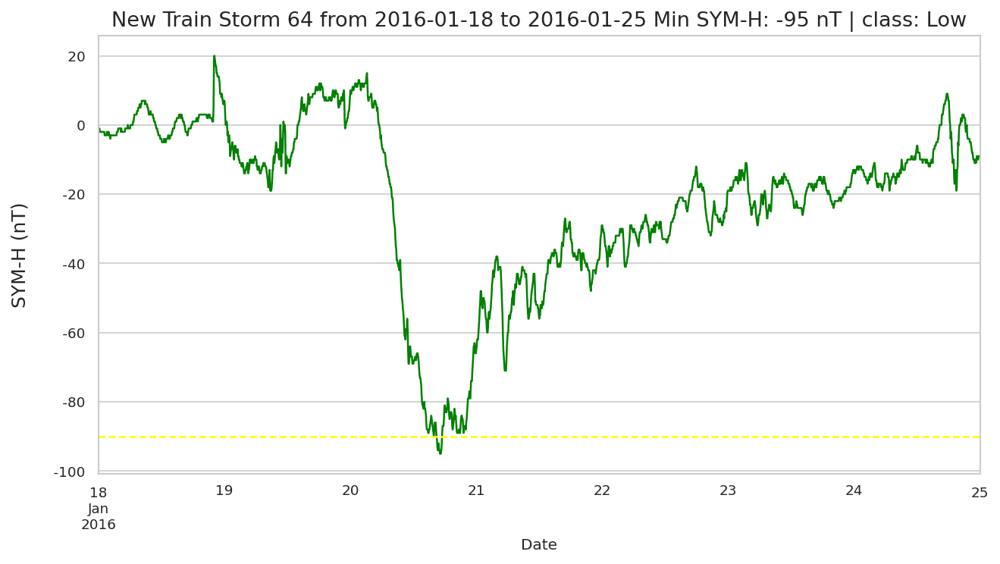

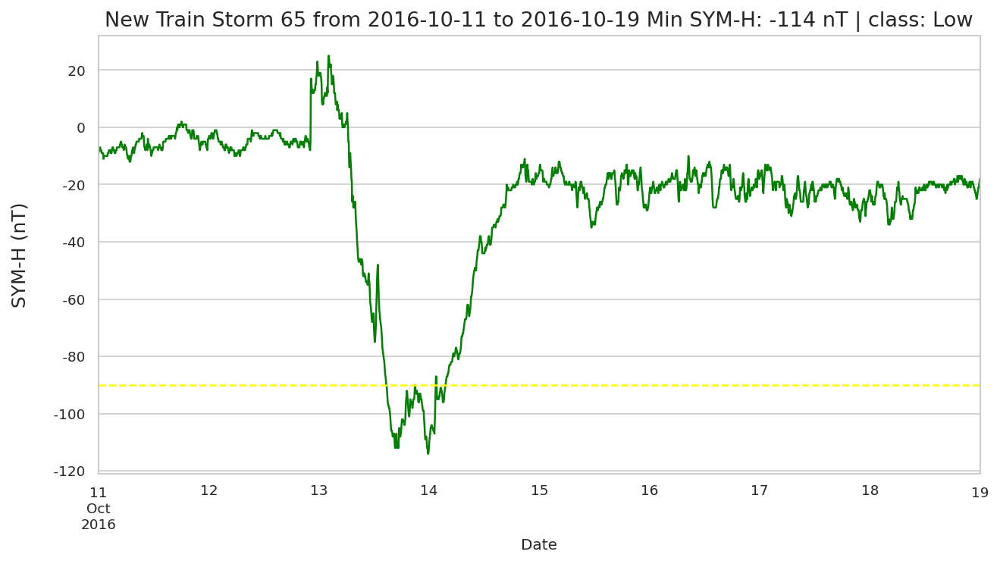

Plotting the validation low storms


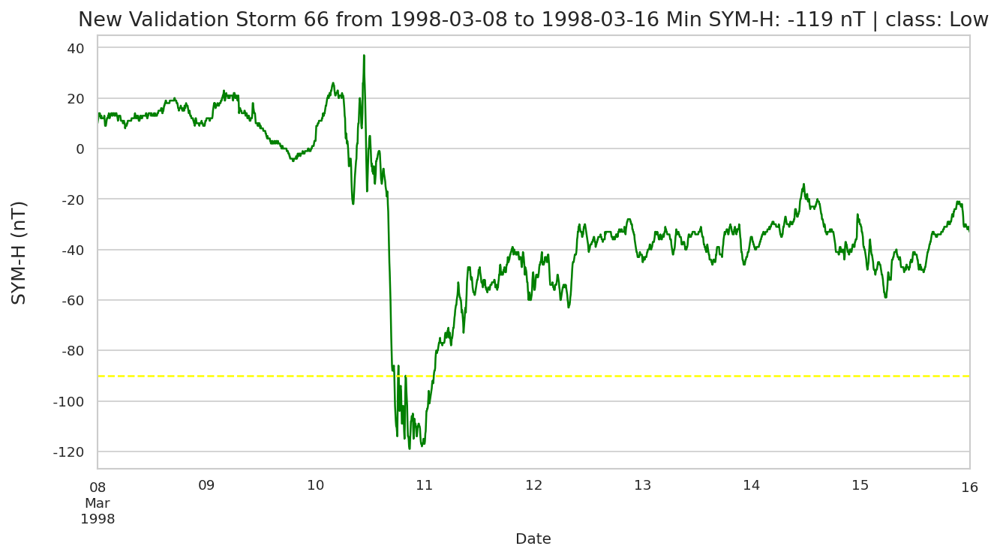

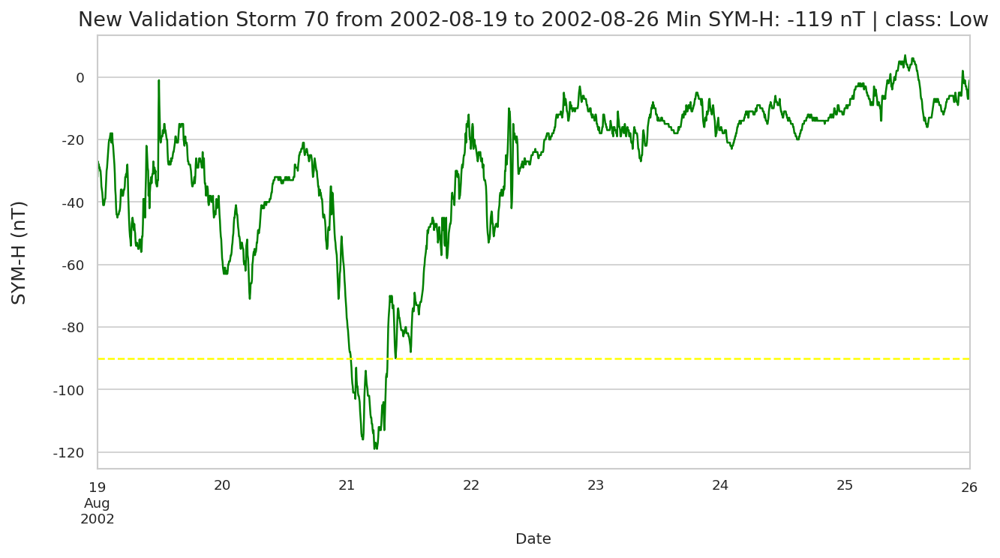

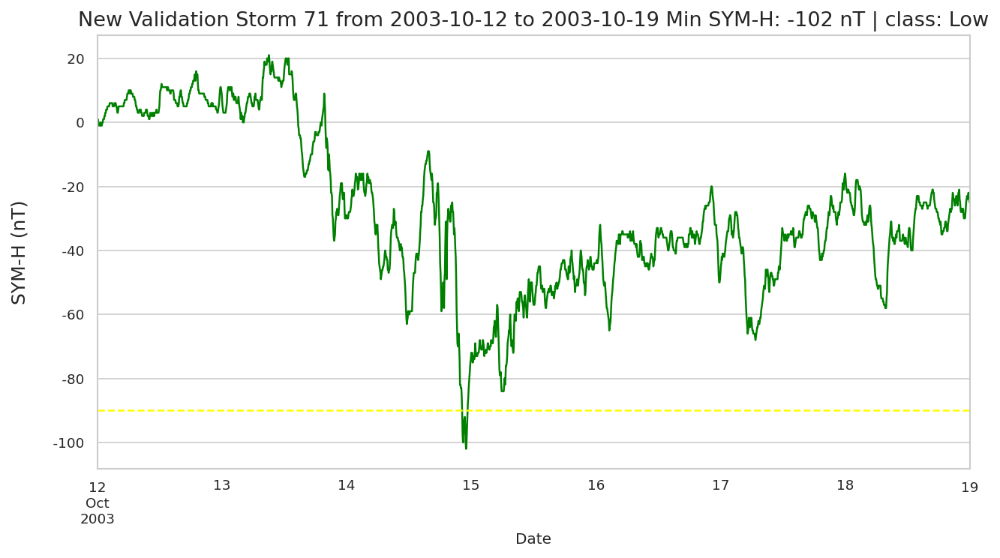

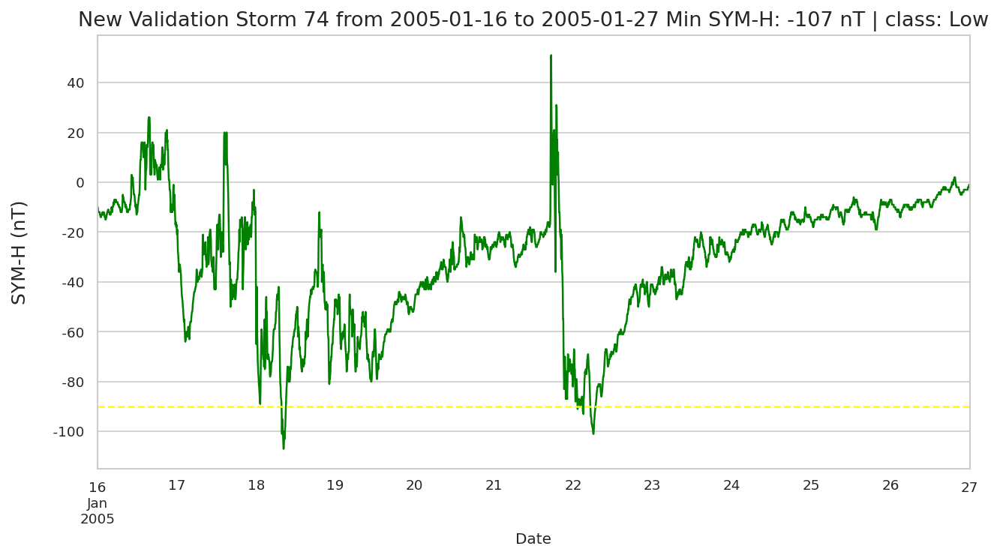

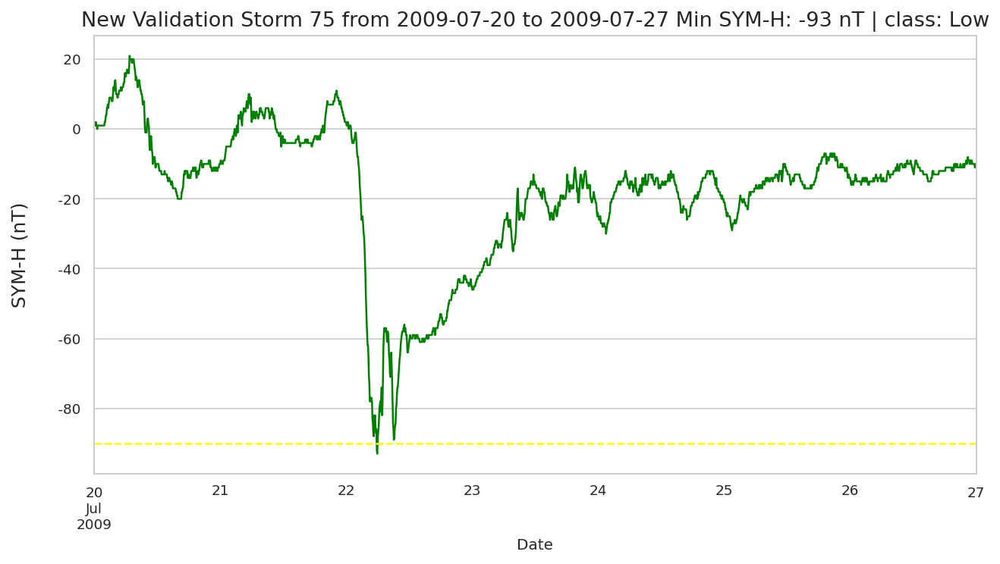

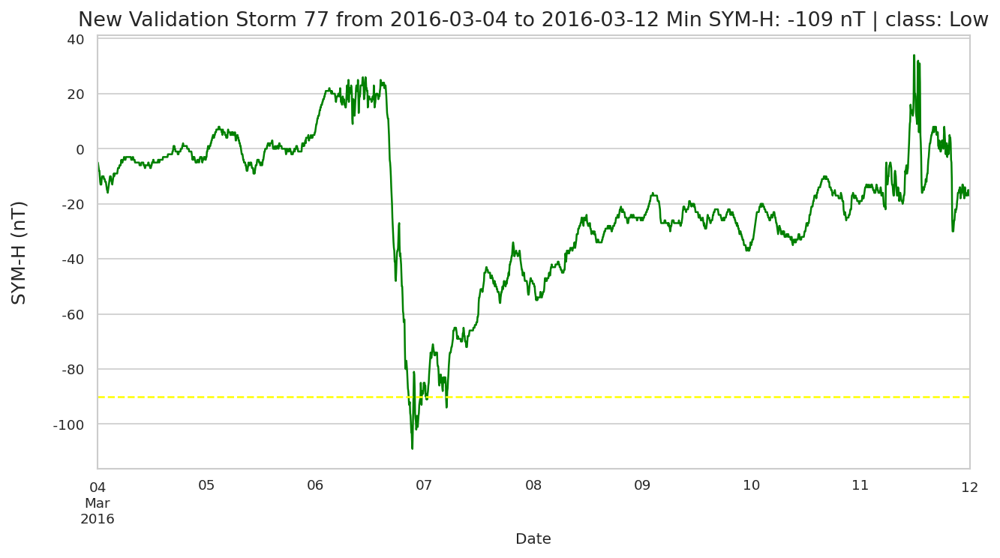

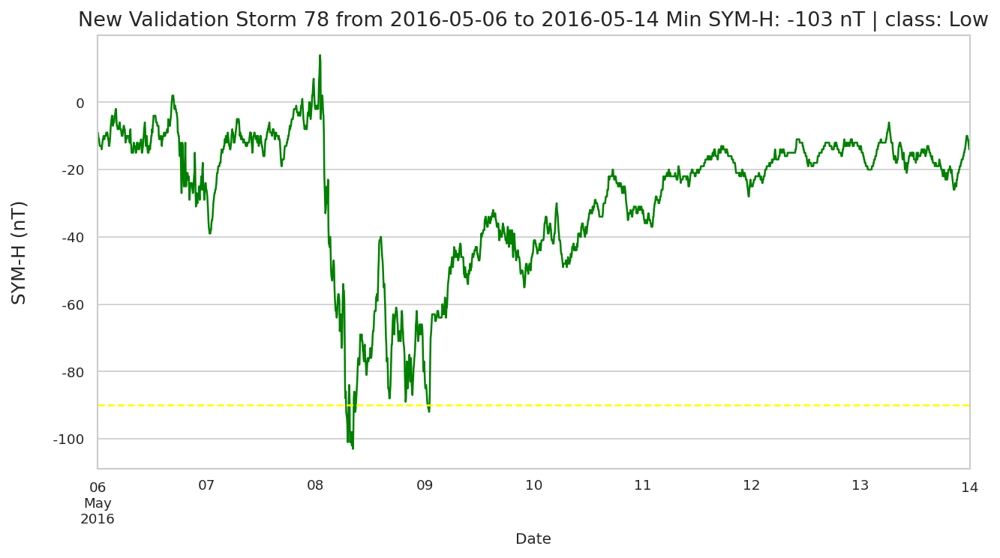

Plotting the test low storms


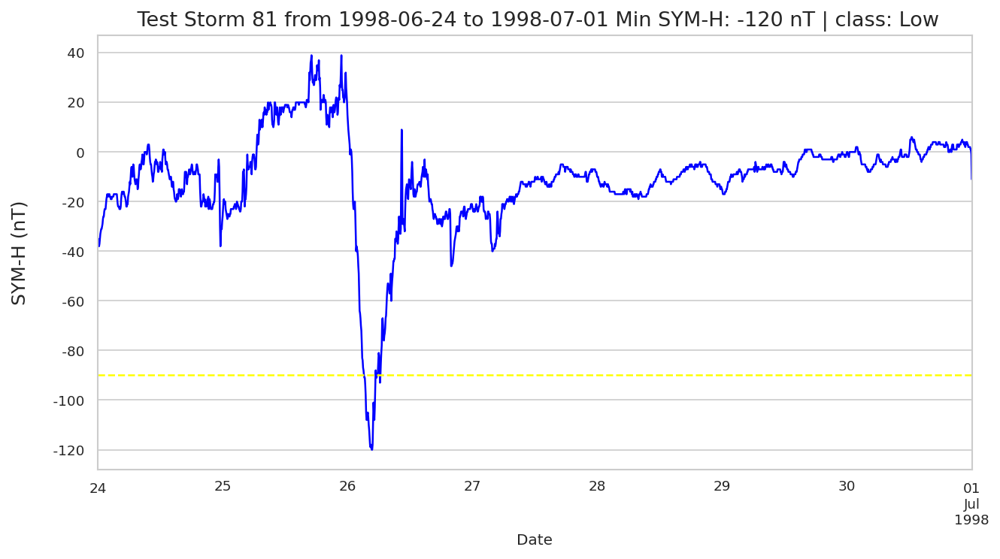

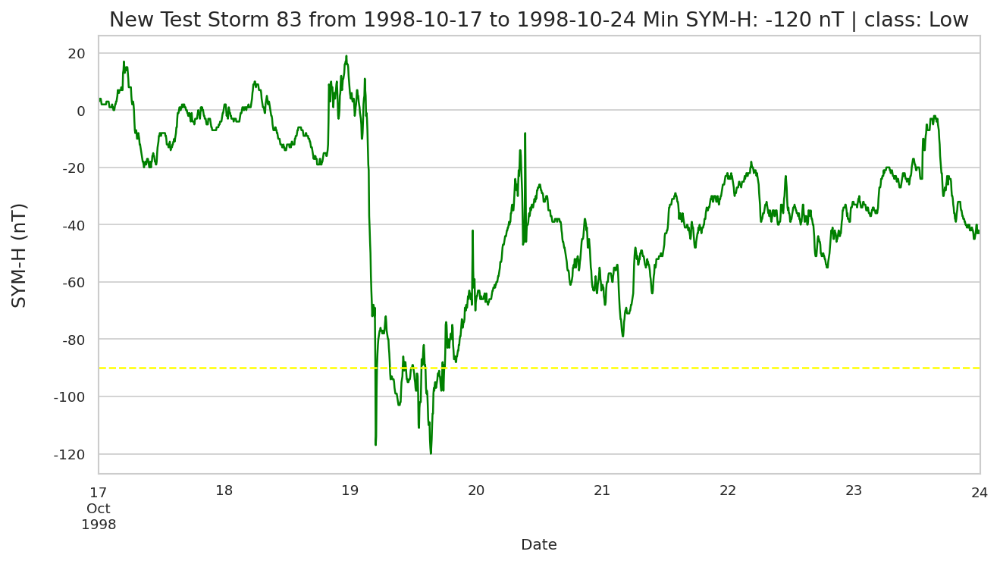

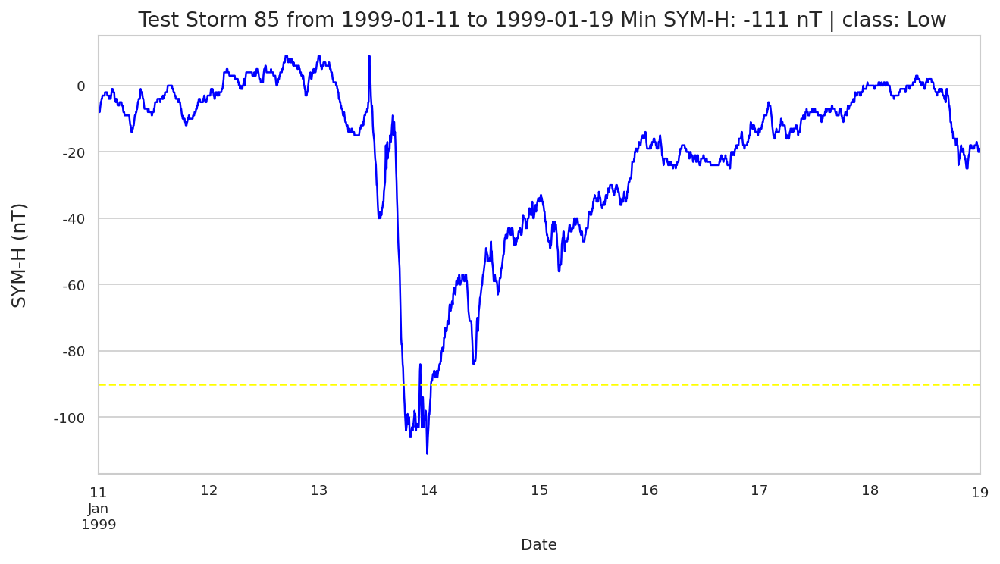

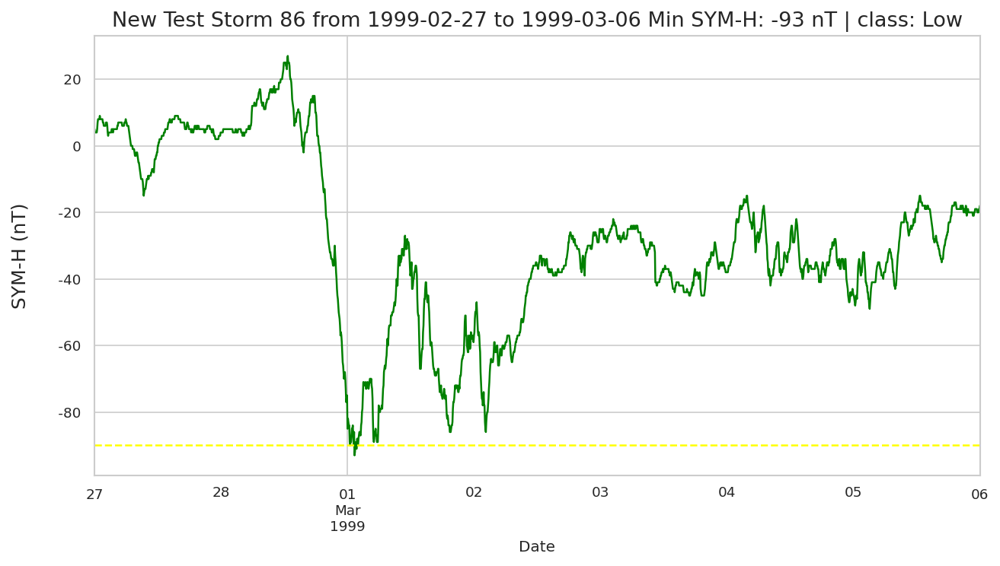

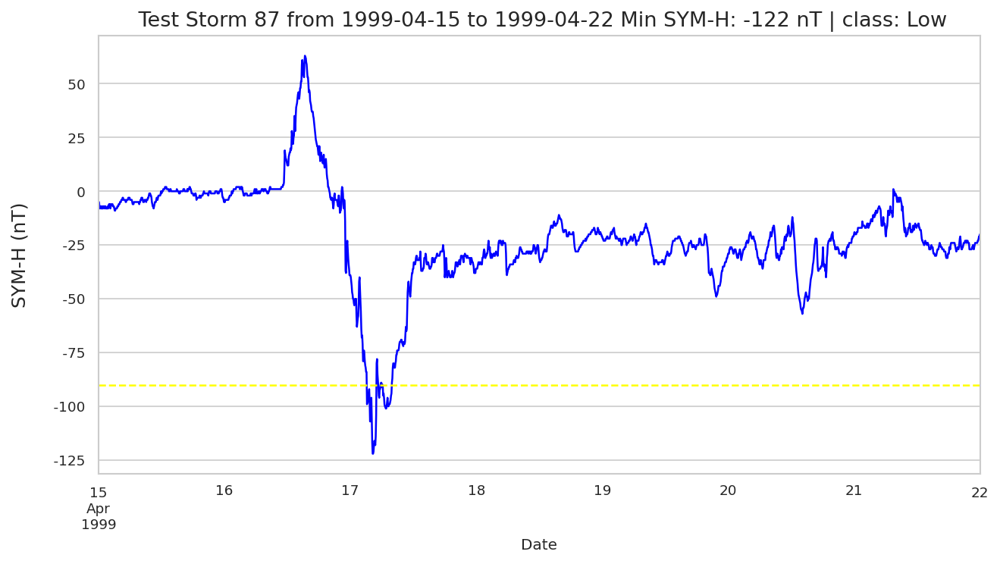

...

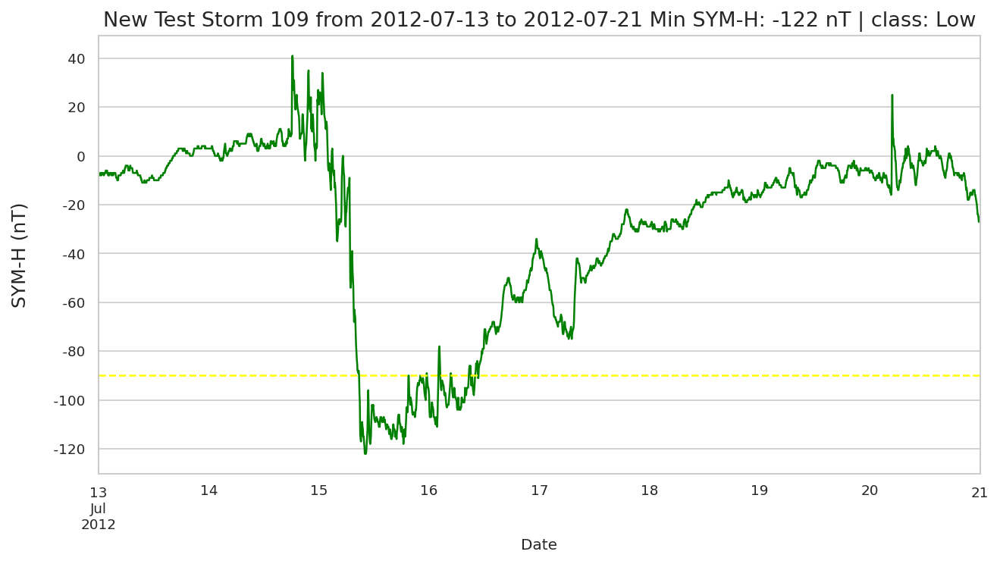

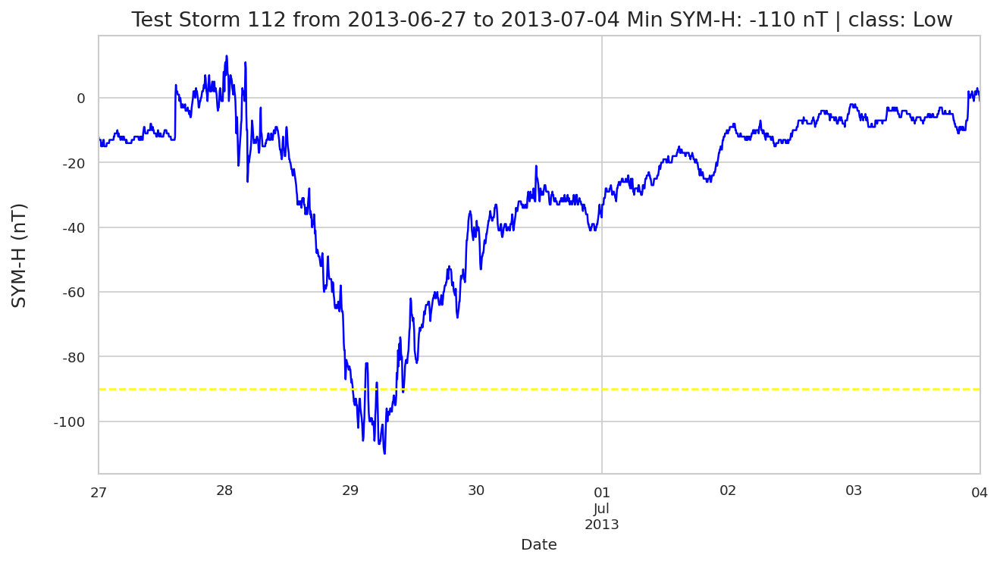

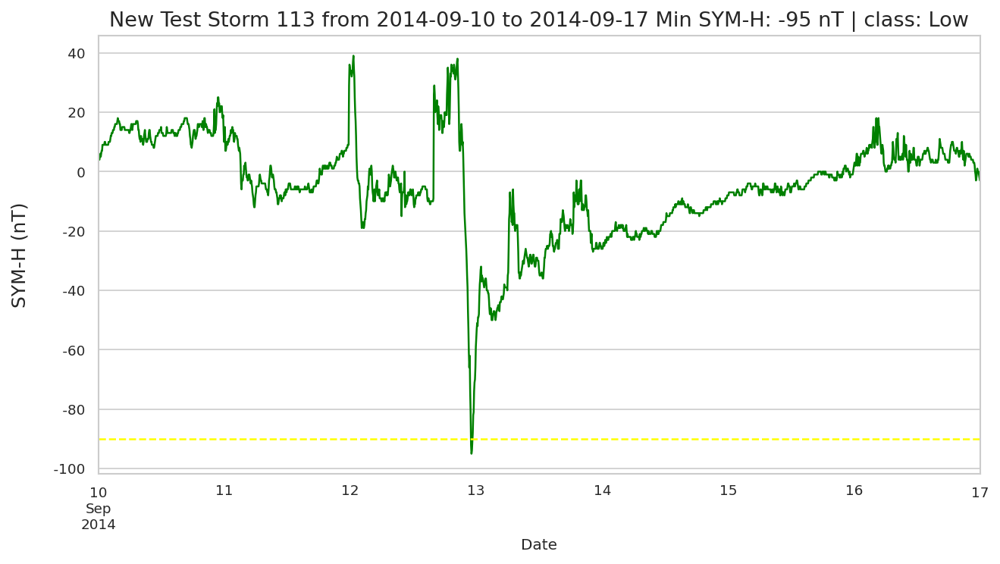

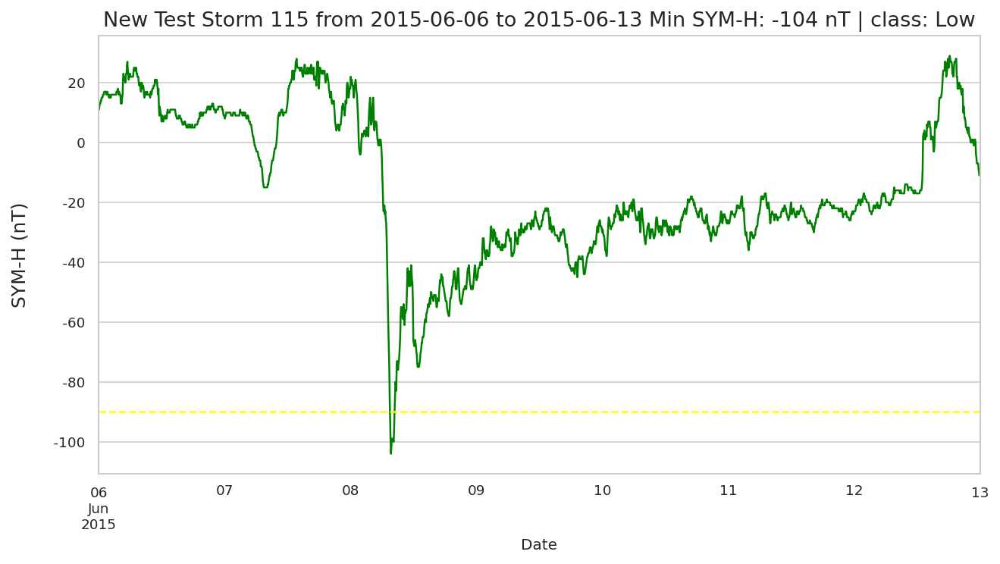

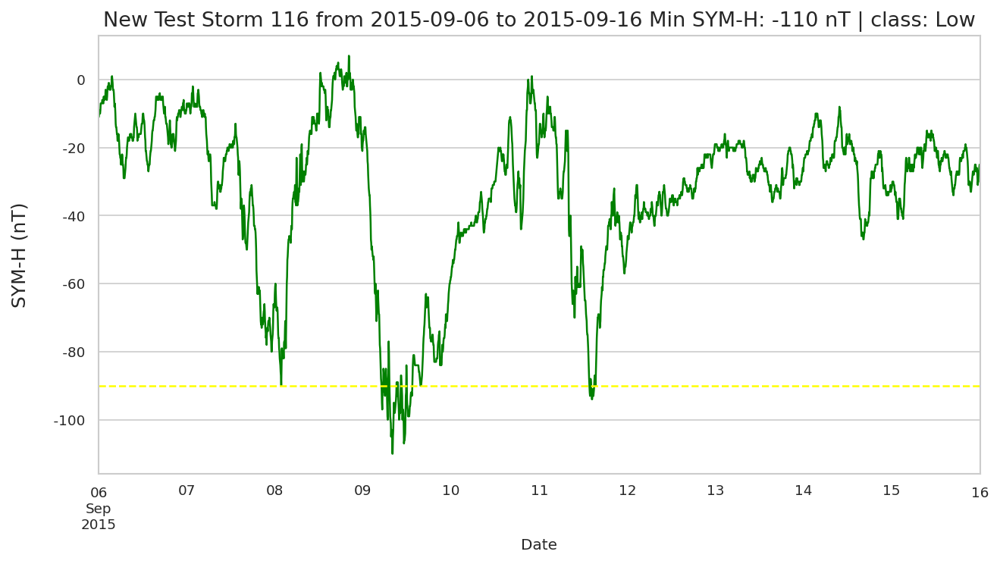

In [30]:
print('Plotting the training low storms')
for _,storm_row in new_storms_df.loc[(new_storms_df['classification'] == 'Low') & 
                                     (new_storms_df['subset'] == 'Train')].iterrows():
    utils.plot_storm_sym(indices[storm_row['Start date'] : storm_row['End date']], 
                         storm_row['subset'], 
                         storm_row['previous_subset'] == 'New storm',
                         storm_row['Storm index'])
    plt.show();
    
print('Plotting the validation low storms')
for _,storm_row in new_storms_df.loc[(new_storms_df['classification'] == 'Low') & 
                                     (new_storms_df['subset'] == 'Validation')].iterrows():
    utils.plot_storm_sym(indices[storm_row['Start date'] : storm_row['End date']], 
                         storm_row['subset'], 
                         storm_row['previous_subset'] == 'New storm',
                         storm_row['Storm index'])
    plt.show();
    
print('Plotting the test low storms')
for _,storm_row in new_storms_df.loc[(new_storms_df['classification'] == 'Low') & 
                                     (new_storms_df['subset'] == 'Test')].iterrows():
    utils.plot_storm_sym(indices[storm_row['Start date'] : storm_row['End date']], 
                         storm_row['subset'], 
                         storm_row['previous_subset'] == 'New storm',
                         storm_row['Storm index'])
    plt.show();

### Plot of the test key storms <a class="anchor" id="section_3_5_5"></a>

Plotting the key test storms


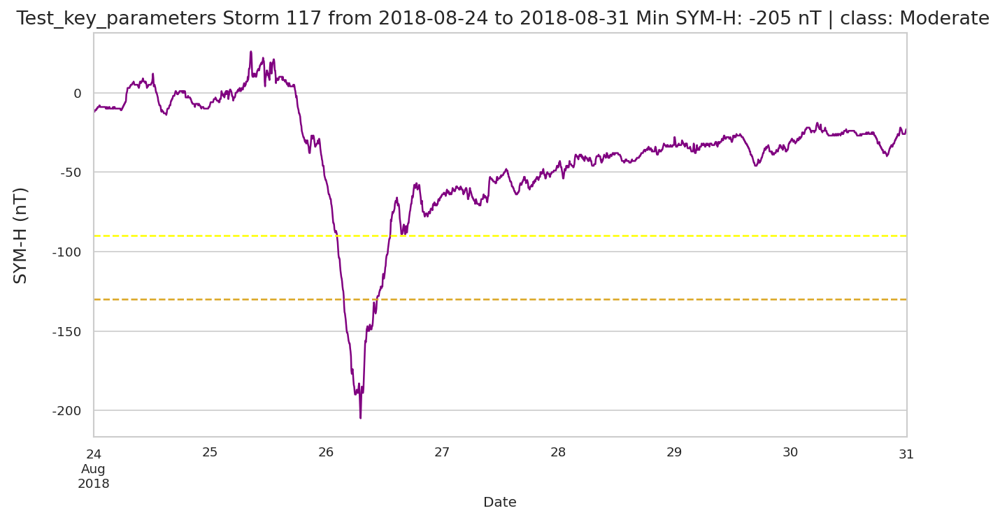

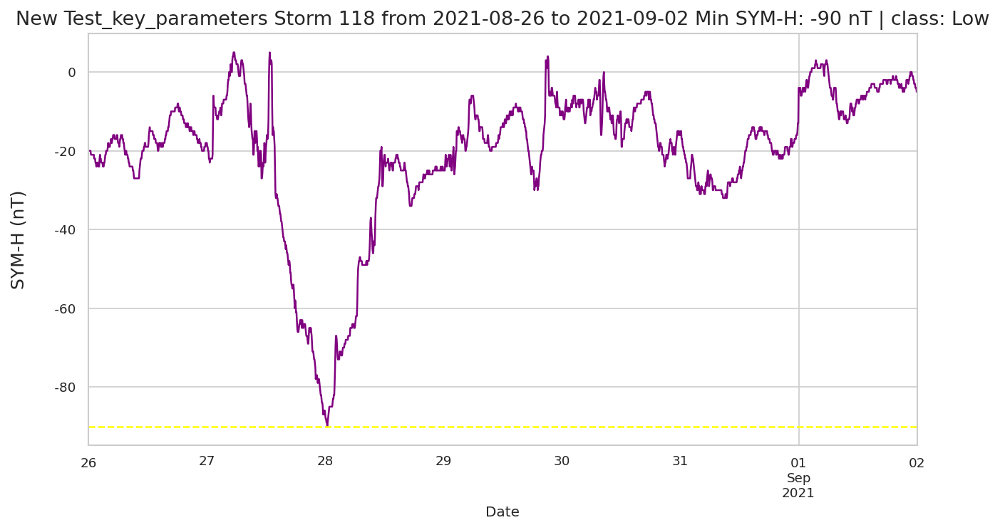

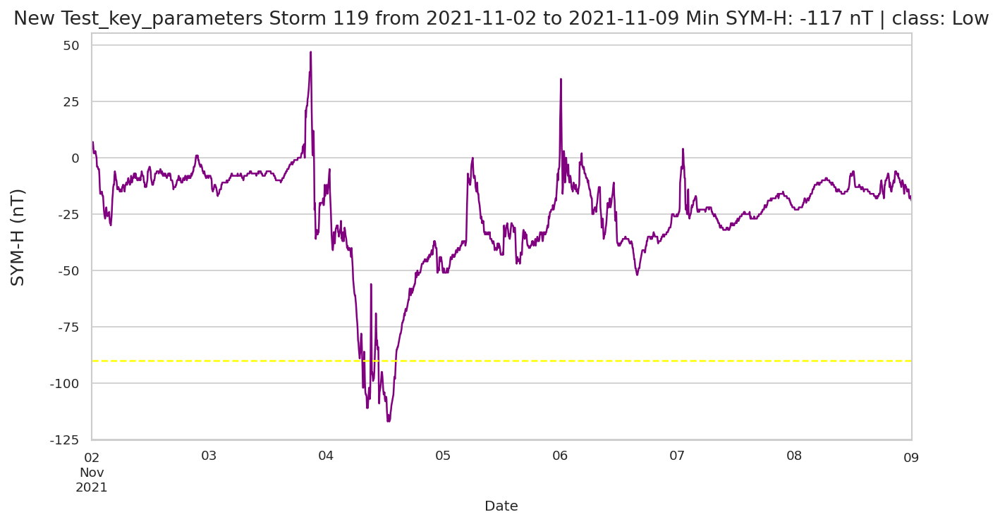

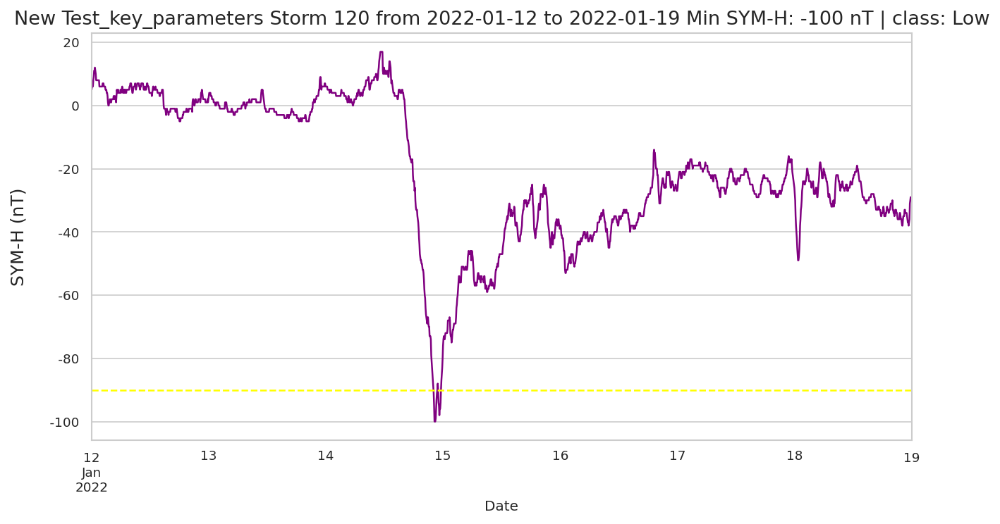

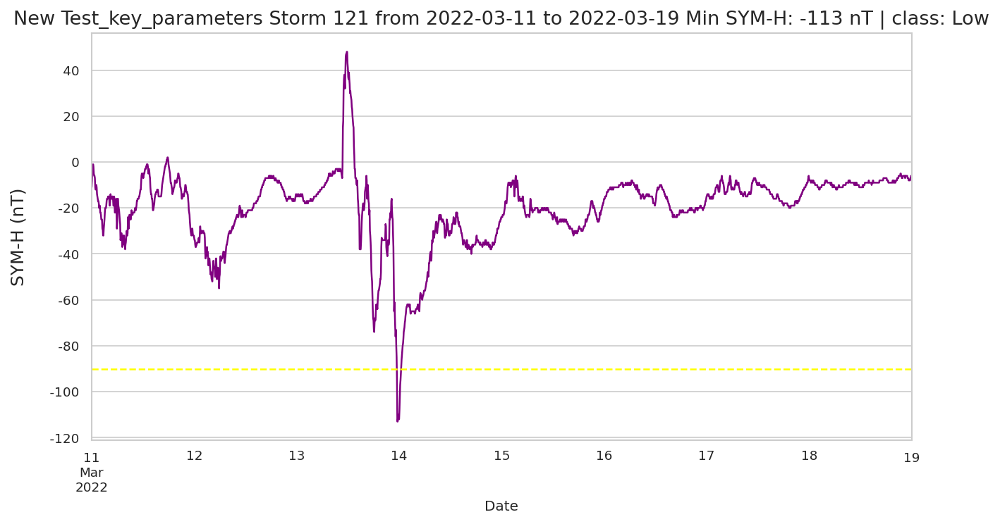

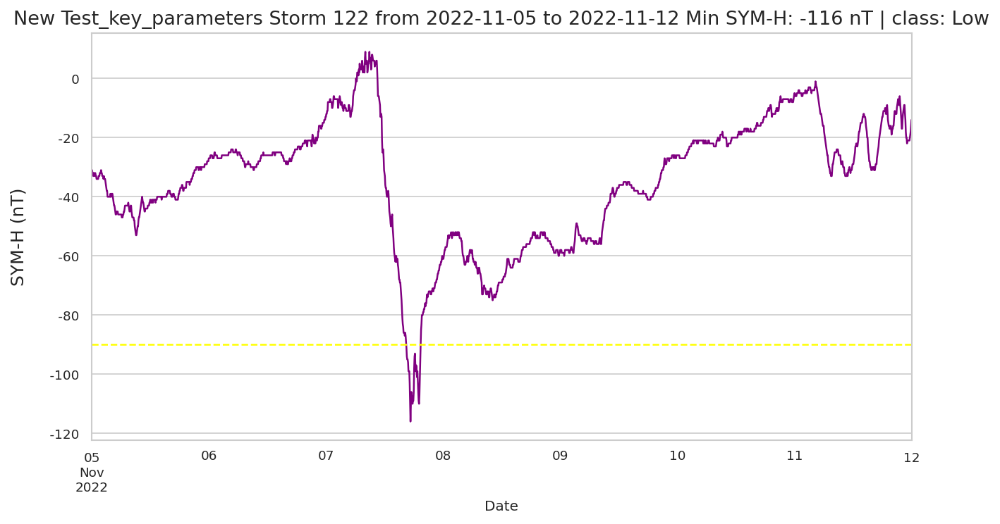

In [31]:
print('Plotting the key test storms')
for _,storm_row in new_storms_df.loc[new_storms_df['subset'] == 'Test_key_parameters'].iterrows():
    utils.plot_storm_sym(indices[storm_row['Start date'] : storm_row['End date']], 
                         storm_row['subset'], 
                         storm_row['previous_subset'] == 'New storm',
                         storm_row['Storm index'])
    plt.show();

## Superposed epoch analysis <a class="anchor" id="section_3_6"></a>

### Low storms <a class="anchor" id="section_3_6_1"></a>

In [32]:
print(indices)
print(train_storms_superintense)

                     SYM_H
datetime                  
1998-01-01 00:00:00   -9.0
1998-01-01 00:05:00   -9.0
1998-01-01 00:10:00   -9.0
1998-01-01 00:15:00   -9.0
1998-01-01 00:20:00   -9.0
...                    ...
2022-12-31 23:40:00  -25.0
2022-12-31 23:45:00  -24.0
2022-12-31 23:50:00  -23.0
2022-12-31 23:55:00  -23.0
2023-01-01 00:00:00  -21.0

[2629729 rows x 1 columns]
    Storm index Start date   End date  Min SYM-H classification  \
58           34 2003-11-18 2003-11-27       -488   Superintense   

   previous_subset  solar_cycle subset  
58       old TRAIN           23  Train  


Evaluating for indices: Prev Training Low | total storms: 4
Evaluating for indices: Prev Validation Low | total storms: 0
Evaluating for indices: Prev Test Low | total storms: 6
Evaluating for indices: Prev Key test Low | total storms: 0
Training MAD: 6.287, Validation MAD: NA, Test MAD: 4.191, Test key MAD: NA


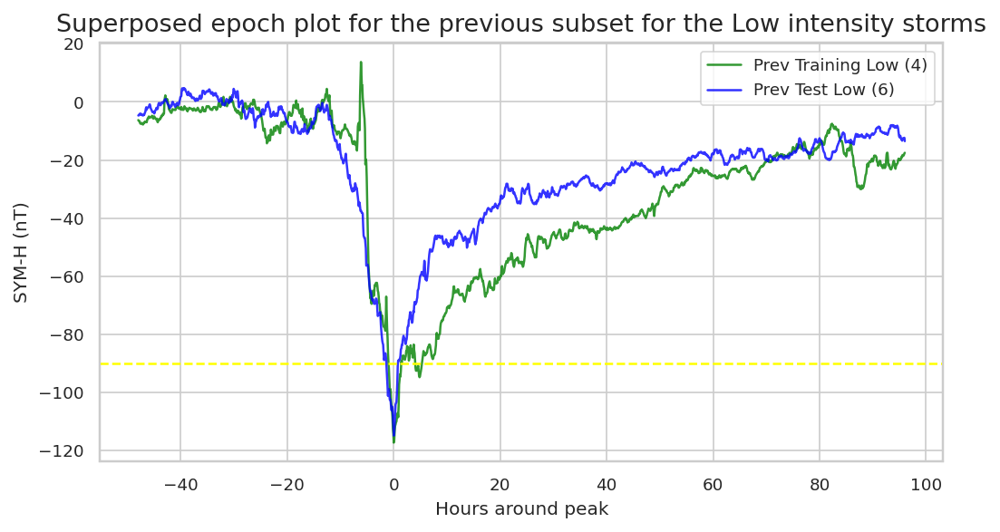

In [33]:
empty_test_key = pd.DataFrame(columns = prev_train_storms_low.columns)
names = ['Prev Training Low', 'Prev Validation Low', 'Prev Test Low', 'Prev Key test Low']
utils.superposed_plot_sym(indices, prev_train_storms_low, prev_validation_storms_low, prev_test_storms_low, empty_test_key, 
                          names, 'Superposed epoch plot for the previous subset for the Low intensity storms')

Evaluating for indices: Training Low | total storms: 34
Evaluating for indices: Validation Low | total storms: 7
Evaluating for indices: Test Low | total storms: 21
Evaluating for indices: Key test Low | total storms: 5
Training MAD: 2.573, Validation MAD: 5.693, Test MAD: 3.755, Test key MAD: 4.379


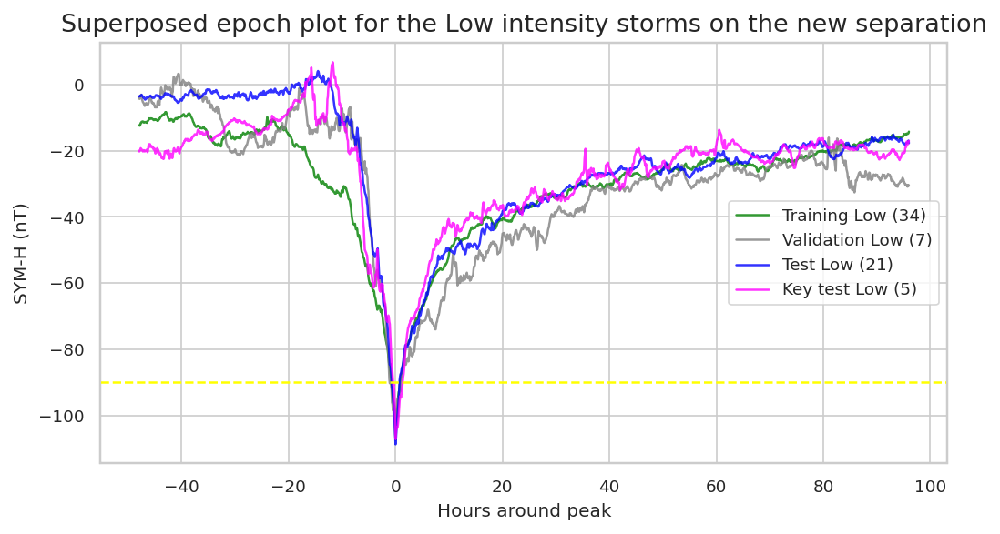

In [34]:
names = ['Training Low', 'Validation Low', 'Test Low', 'Key test Low']
utils.superposed_plot_sym(indices, train_storms_low, val_storms_low, test_storms_low, test_key_storms_low, 
                          names, 'Superposed epoch plot for the Low intensity storms on the new separation')

### Moderate storms <a class="anchor" id="section_3_6_2"></a>

Evaluating for indices: Prev Training Moderate | total storms: 10
Evaluating for indices: Prev Validation Moderate | total storms: 3
Evaluating for indices: Prev Test Moderate | total storms: 7
Evaluating for indices: Prev Key test Moderate | total storms: 0
Training MAD: 6.4, Validation MAD: 9.699, Test MAD: 6.925, Test key MAD: NA


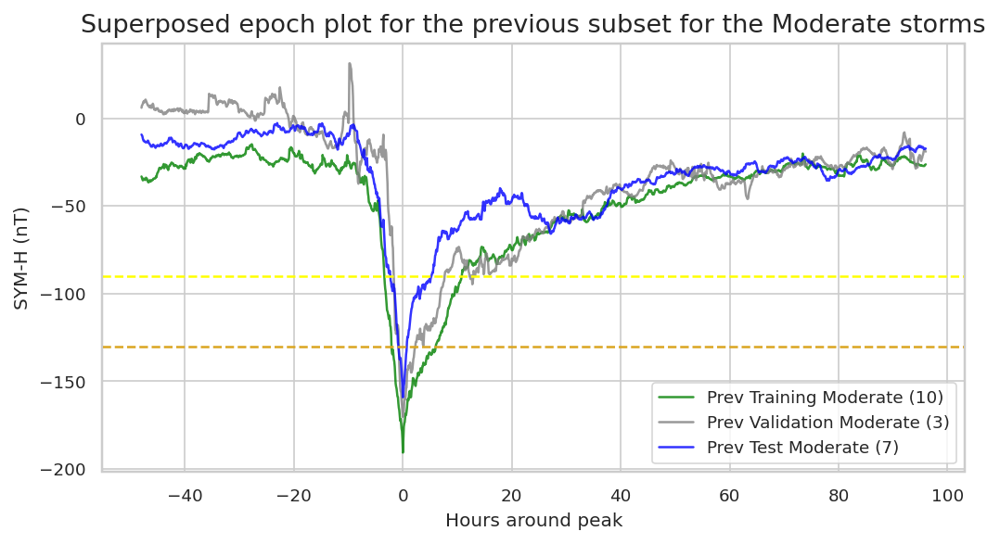

In [35]:
names = ['Prev Training Moderate', 'Prev Validation Moderate', 'Prev Test Moderate', 'Prev Key test Moderate']
utils.superposed_plot_sym(indices, prev_train_storms_moderate, prev_validation_storms_moderate, prev_test_storms_moderate, empty_test_key, 
                          names, 'Superposed epoch plot for the previous subset for the Moderate storms')

Evaluating for indices: Training Moderate | total storms: 19
Evaluating for indices: Validation Moderate | total storms: 6
Evaluating for indices: Test Moderate | total storms: 11
Evaluating for indices: Key test Moderate | total storms: 1
Training MAD: 4.795, Validation MAD: 5.484, Test MAD: 6.238, Test key MAD: 12.513


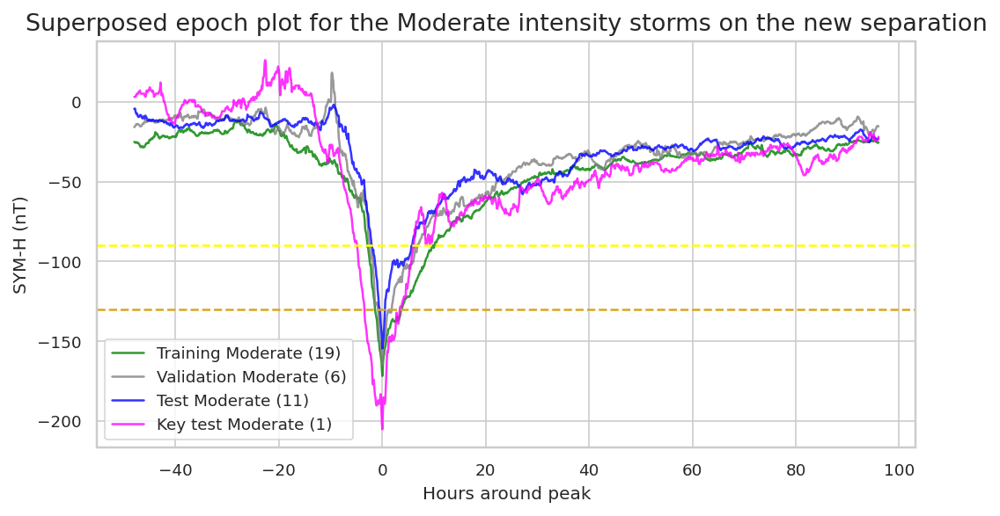

In [36]:
names = ['Training Moderate', 'Validation Moderate', 'Test Moderate', 'Key test Moderate']
utils.superposed_plot_sym(indices, train_storms_moderate, val_storms_moderate, test_storms_moderate, 
                          test_key_storms_moderate, names, 'Superposed epoch plot for the Moderate intensity storms on the new separation')

### Intense storms <a class="anchor" id="section_3_6_3"></a>

Evaluating for indices: Prev Training Intense | total storms: 5
Evaluating for indices: Prev Validation Intense | total storms: 1
Evaluating for indices: Prev Test Intense | total storms: 2
Evaluating for indices: Prev Key test Intense | total storms: 0
Training MAD: 5.481, Validation MAD: 19.601, Test MAD: 13.219, Test key MAD: NA


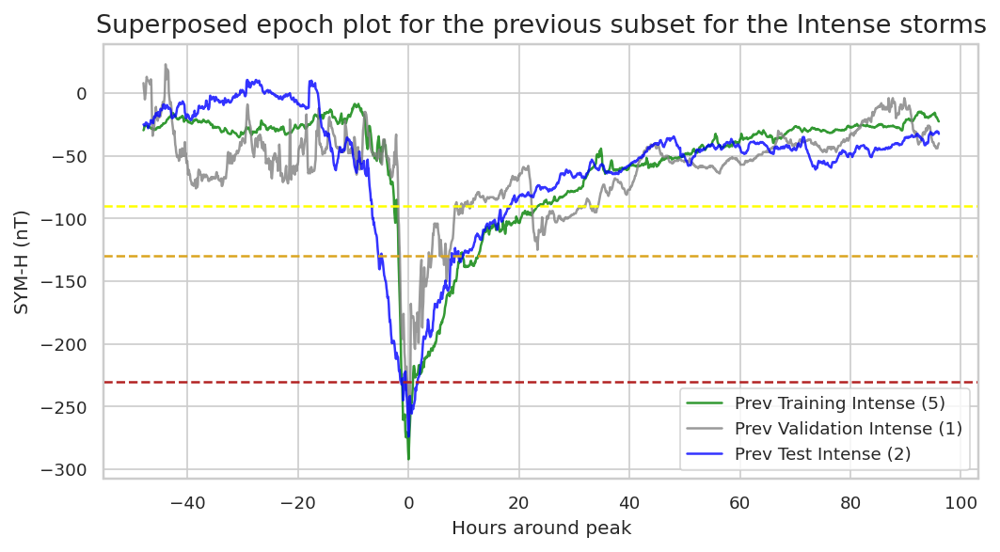

In [37]:
names = ['Prev Training Intense', 'Prev Validation Intense', 'Prev Test Intense', 'Prev Key test Intense']
utils.superposed_plot_sym(indices, prev_train_storms_intense, prev_validation_storms_intense, prev_test_storms_intense, empty_test_key, 
                          names, 'Superposed epoch plot for the previous subset for the Intense storms')

Evaluating for indices: Training Intense | total storms: 6
Evaluating for indices: Validation Intense | total storms: 1
Evaluating for indices: Test Intense | total storms: 2
Evaluating for indices: Key test Intense | total storms: 0
Training MAD: 4.89, Validation MAD: 19.881, Test MAD: 13.73, Test key MAD: NA


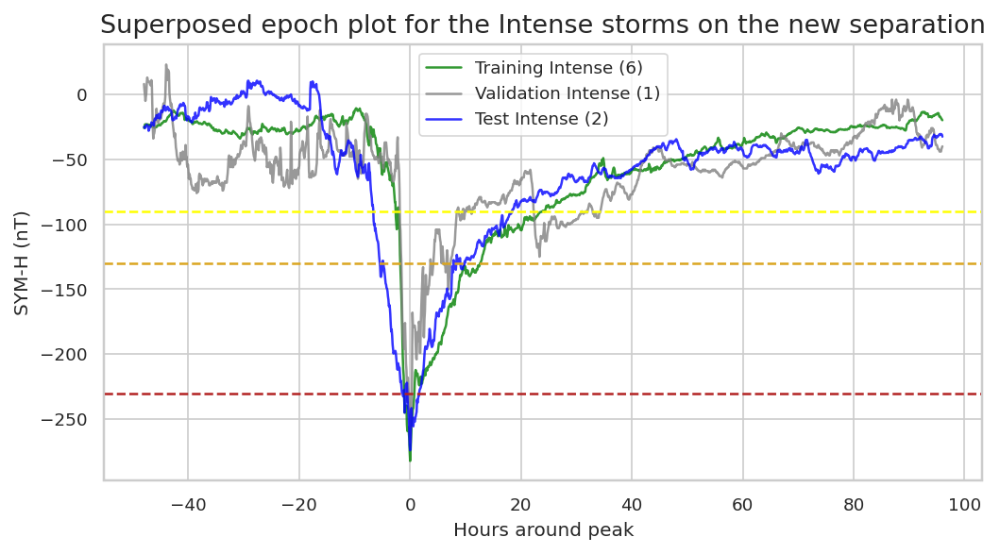

In [38]:
names = ['Training Intense', 'Validation Intense', 'Test Intense', 'Key test Intense']
utils.superposed_plot_sym(indices, train_storms_intense, val_storms_intense, test_storms_intense, 
                          test_key_storms_intense, names, 'Superposed epoch plot for the Intense storms on the new separation')

### Superintense storms <a class="anchor" id="section_3_6_4"></a>

Evaluating for indices: Training Superintense | total storms: 1
Evaluating for indices: Validation Superintense | total storms: 1
Evaluating for indices: Test Superintense | total storms: 2
Evaluating for indices: Key test Superintense | total storms: 0
Training MAD: 21.269, Validation MAD: 61.737, Test MAD: 29.274, Test key MAD: NA


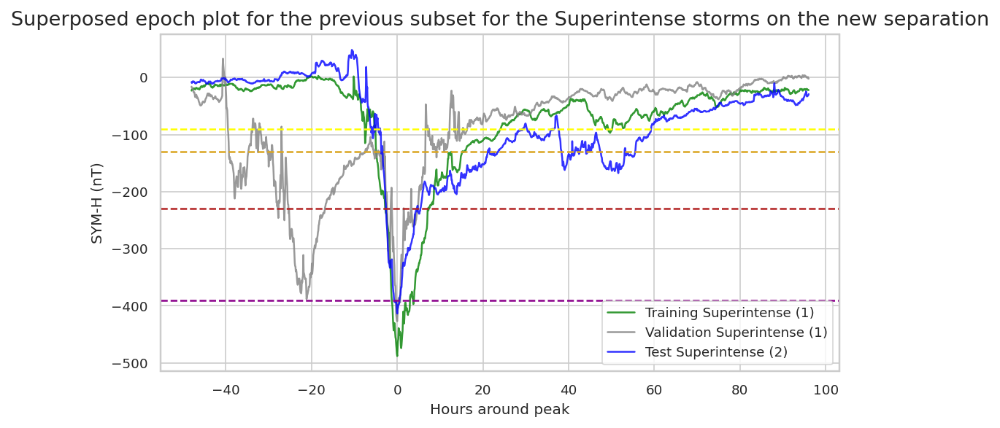

In [39]:
names = ['Training Superintense', 'Validation Superintense', 'Test Superintense', 'Key test Superintense']
utils.superposed_plot_sym(indices, prev_train_storms_superintense, prev_validation_storms_superintense, prev_test_storms_superintense, 
                          empty_test_key, names, 'Superposed epoch plot for the previous subset for the Superintense storms on the new separation')

Evaluating for indices: Training Superintense | total storms: 1
Evaluating for indices: Validation Superintense | total storms: 1
Evaluating for indices: Test Superintense | total storms: 2
Evaluating for indices: Key test Superintense | total storms: 0
Training MAD: 21.269, Validation MAD: 61.737, Test MAD: 29.274, Test key MAD: NA


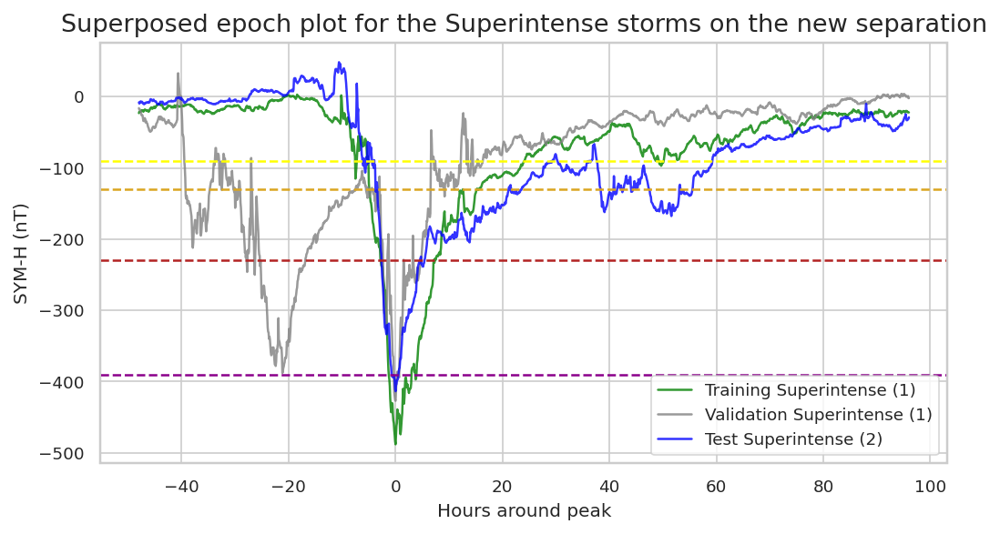

In [40]:
names = ['Training Superintense', 'Validation Superintense', 'Test Superintense', 'Key test Superintense']
utils.superposed_plot_sym(indices, train_storms_superintense, val_storms_superintense, test_storms_superintense, 
                          test_key_storms_superintense, names, 'Superposed epoch plot for the Superintense storms on the new separation')

In [41]:
def superposed_plot_sym_paper(
        df, train_indices, val_indices, test_indices, test_key_indices, names, title, ax=None
):
    all_indices = [train_indices, val_indices, test_indices, test_key_indices]

    delta_backward = pd.DateOffset(days=5)
    delta_forward = pd.DateOffset(days=5)

    superposed_total = pd.DataFrame(
        index=pd.timedelta_range(start=f"-2 days", end=f"4 days", freq="5min")
    )
    superposed_dfs_total = []
    fontsizes = 14

    min_sym = np.nanmin(
        [
            train_indices["Min SYM-H"].min(),
            val_indices["Min SYM-H"].min(),
            test_indices["Min SYM-H"].min(),
            test_key_indices["Min SYM-H"].min(),
        ]
    )

    for i in range(len(all_indices)):
        subset_data = all_indices[i]
        name = names[i]
        superposed_df = pd.DataFrame(
            index=pd.timedelta_range(start=f"-2 days", end=f"4 days", freq="5min")
        )

        print(f"Evaluating for indices: {name} | total storms: {len(subset_data)}")
        
        if len(subset_data) == 0:
            continue
        
        dfs_tmp = []

        for storm_ind, storm in subset_data.iterrows():
            # Get data for the current storm
            strm = df[
                   storm["Start date"] - delta_backward: storm["End date"] + delta_forward
                   ]
            strm = strm[["SYM_H"]]
            idxmin = strm["SYM_H"].idxmin()

            strm.columns = [[f'storm-{storm_ind}']]
            strm = strm[idxmin - delta_backward: idxmin + delta_forward].copy()

            # Create a new index for the data in 5-minute intervals
            strm.index = pd.timedelta_range(
                start=f"-5 days", freq="5min", periods=len(strm)
            )

            dfs_tmp.append(strm)

            superposed_df = pd.concat(dfs_tmp, axis=1)

        
        superposed_dfs_total.append(superposed_df.copy())
        # Average the storms for the superposed epoch plot
        superposed_df[f"{name} Superposed"] = superposed_df.mean(axis=1)        

        superposed_total[f"{name} Superposed"] = superposed_df[f"{name} Superposed"]

    # Create a new column in the main dataframe for hours to ease the plotting
    
    superposed_total["hours"] = superposed_total.index / pd.Timedelta(hours=1)
    superposed_dfs_total = pd.concat(superposed_dfs_total, axis = 1)
    superposed_total["overall_mean"] = superposed_dfs_total.mean(axis = 1, skipna=True)

    # Plot the superposed epoch storms for each class
    if ax is None:
        fig, ax = plt.subplots(1, figsize=(8, 4))

    mad_deviation_training = 'NA'
    mad_deviation_val = 'NA'
    mad_deviation_test = 'NA'    
    mad_deviation_test_key = 'NA'
    
    
    if len(train_indices) > 0:
        ax = superposed_total.plot(
            x="hours",
            y=f"{names[0]} Superposed",
            color="blue",
            ax=ax,
            alpha=0.8,
            label=f"{names[0]} ({len(train_indices)})"
        )
        
        mad_deviation_training = np.round((superposed_total[f"{names[0]} Superposed"] - superposed_total['overall_mean']).abs().mean(),3)



    if len(val_indices) > 0:
        ax = superposed_total.plot(
            x="hours",
            y=f"{names[1]} Superposed",
            color="gray",
            ax=ax,
            linestyle = '-',
            dashes = (5, 3),
            alpha=0.8,
            label=f"{names[1]} ({len(val_indices)})"
        )

        mad_deviation_val = np.round((superposed_total[f"{names[1]} Superposed"] - superposed_total['overall_mean']).abs().mean(),3)

    if len(test_indices) > 0:
        ax = superposed_total.plot(
            x="hours",
            y=f"{names[2]} Superposed",
            color="green",
            ax=ax,
            alpha=0.8,
            label=f"{names[2]} ({len(test_indices)})"
        )

        mad_deviation_test = np.round((superposed_total[f"{names[2]} Superposed"] - superposed_total['overall_mean']).abs().mean(),3)

    if len(test_key_indices) > 0:
        ax = superposed_total.plot(
            x="hours",
            y=f"{names[3]} Superposed",
            color="magenta",
            ax=ax,
            linestyle = ':',
            alpha=0.8,
            label=f"{names[3]} ({len(test_key_indices)})"
        )

        mad_deviation_test_key = np.round((superposed_total[f"{names[3]} Superposed"] - superposed_total['overall_mean']).abs().mean(),3)

    ax.patch.set_edgecolor('black')
    ax.patch.set_linewidth(1)
    ax.set_xlim(superposed_total['hours'].min(), superposed_total['hours'].max())
    ax.tick_params(axis="both", which="major", labelsize=14, width=2, length=10)

    print(f"Training MAD: {mad_deviation_training}, Validation MAD: {mad_deviation_val}," +
          f" Test MAD: {mad_deviation_test}, Test key MAD: {mad_deviation_test_key}")

    if min_sym <= utils.SYM_H_THRESHOLD_LOW:
        ax.axhline(utils.SYM_H_THRESHOLD_LOW, 
                   linestyle="--", 
                   dashes = (5, 10),
                   color=utils.COLOR_LOW)
        if min_sym <= utils.SYM_H_THRESHOLD_MODERATE:
            ax.axhline(utils.SYM_H_THRESHOLD_MODERATE, 
                       linestyle="--", 
                       dashes = (5, 10),
                       color=utils.COLOR_MODERATE)
            if min_sym <= utils.SYM_H_THRESHOLD_INTENSE:
                ax.axhline(utils.SYM_H_THRESHOLD_INTENSE, 
                           linestyle="--", 
                           dashes = (5, 10),
                           color=utils.COLOR_INTENSE)
                if min_sym <= utils.SYM_H_THRESHOLD_SUPERINTENSE:
                    ax.axhline(
                        utils.SYM_H_THRESHOLD_SUPERINTENSE,
                        linestyle="--",
                        dashes = (5, 10),
                        color=utils.COLOR_SUPERINTENSE,
                    )

    ax.set_ylabel("SYM-H (nT)", fontsize = fontsizes)
    ax.set_xlabel("Hours around peak", fontsize = fontsizes)
    ax.set_title(title, fontsize = fontsizes)

Superposed epoch plot of the paper

Evaluating for indices: Training Superintense | total storms: 1
Evaluating for indices: Validation Superintense | total storms: 1
Evaluating for indices: Test Superintense | total storms: 2
Evaluating for indices: Key test Superintense | total storms: 0
Training MAD: 21.269, Validation MAD: 61.737, Test MAD: 29.274, Test key MAD: NA
Evaluating for indices: Training Intense | total storms: 6
Evaluating for indices: Validation Intense | total storms: 1
Evaluating for indices: Test Intense | total storms: 2
Evaluating for indices: Key test Intense | total storms: 0
Training MAD: 4.89, Validation MAD: 19.881, Test MAD: 13.73, Test key MAD: NA
Evaluating for indices: Training Moderate | total storms: 19
Evaluating for indices: Validation Moderate | total storms: 6
Evaluating for indices: Test Moderate | total storms: 11
Evaluating for indices: Key test Moderate | total storms: 1
Training MAD: 4.795, Validation MAD: 5.484, Test MAD: 6.238, Test key MAD: 12.513
Evaluating for indices: Trainin

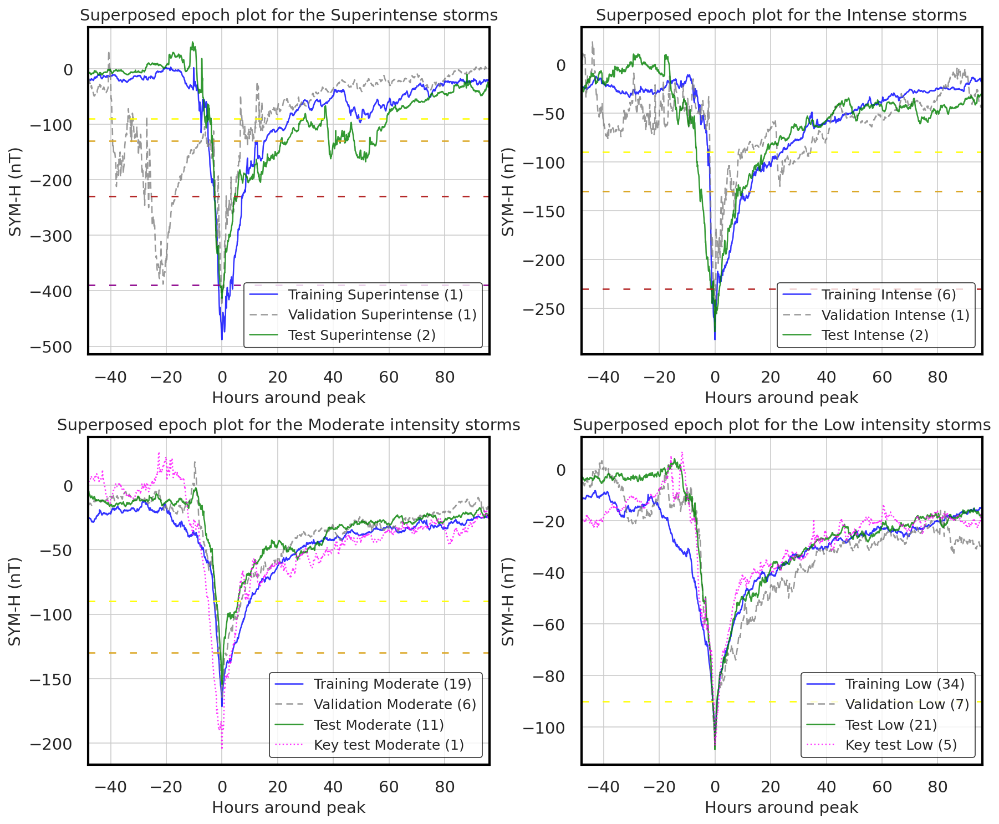

In [42]:
figs, axs = plt.subplots(2, 2, figsize = (12, 10))
all_names = [
    ['Training Superintense', 'Validation Superintense', 'Test Superintense', 'Key test Superintense'],
    ['Training Intense', 'Validation Intense', 'Test Intense', 'Key test Intense'],
    ['Training Moderate', 'Validation Moderate', 'Test Moderate', 'Key test Moderate'],
    ['Training Low', 'Validation Low', 'Test Low', 'Key test Low'],
]

all_train = [train_storms_superintense, train_storms_intense, train_storms_moderate, train_storms_low]
all_val = [val_storms_superintense, val_storms_intense, val_storms_moderate, val_storms_low]
all_test = [test_storms_superintense, test_storms_intense, test_storms_moderate, test_storms_low]
all_key_test = [test_key_storms_superintense, test_key_storms_intense, test_key_storms_moderate, test_key_storms_low]

all_titles = ['Superposed epoch plot for the Superintense storms', 
              'Superposed epoch plot for the Intense storms',
              'Superposed epoch plot for the Moderate intensity storms', 
              'Superposed epoch plot for the Low intensity storms']

for i in range(4):
    superposed_plot_sym_paper(indices, all_train[i], all_val[i], all_test[i], 
                          all_key_test[i], all_names[i], all_titles[i], axs[i // 2, i % 2])
    for axis in ['top', 'bottom', 'left', 'right']:
        axs[i // 2, i % 2].spines[axis].set_color('black')
        axs[i // 2, i % 2].spines[axis].set_linewidth(2)
        
    leg = axs[i // 2, i % 2].legend(fontsize = 12)
    leg.get_frame().set_edgecolor('black')    
    
plt.tight_layout()
#plt.setp(ax.spines.values(), lw=2, color="black", alpha=1)
plt.savefig('./figs/superposed_sym.png', transparent = True)
plt.show();

## Classification of the storms per cycle and subset <a class="anchor" id="section_3_7"></a>

In [43]:
counts = new_storms_df[['classification','solar_cycle', 'subset']].value_counts()
custom_order = {'Low' : 0, 'Moderate' : 1, 'Intense' : 2, 'Superintense' : 3, 23:23, 24:24, 25:25,
               'train': 26, 'validation' : 27, 'test' : 28, 'Test_key_parameters' : 29}
counts_df = pd.DataFrame(counts)
ordered = counts_df.sort_index(level=['classification', 'solar_cycle', 'subset'], key = lambda x : x.map(custom_order))

In [44]:
print(ordered)

                                                count
classification solar_cycle subset                    
Low            23          Train                   24
                           Test                    14
                           Validation               4
               24          Train                   15
                           Test                     7
                           Validation               3
               25          Test_key_parameters      5
Moderate       23          Train                   15
                           Test                     8
                           Validation               3
               24          Test_key_parameters      1
                           Train                    4
                           Test                     3
                           Validation               3
Intense        23          Train                    6
                           Test                     1
                           V

In [45]:
with pd.option_context('display.max_rows', 150, 'display.max_columns', 10):
    display(new_storms_df.set_index('Storm index'))

,Start date,End date,Min SYM-H,classification,previous_subset,solar_cycle,subset
Storm index,,,,,,,
1,1998-02-15,1998-02-23,-119,Low,old TRAIN,23,Train
2,1998-08-04,1998-08-12,-168,Moderate,old TRAIN,23,Train
3,1998-09-23,1998-09-30,-213,Moderate,old TRAIN,23,Train
4,1999-02-16,1999-02-24,-127,Low,old TRAIN,23,Train
5,1999-10-20,1999-10-27,-218,Moderate,old TRAIN,23,Train
6,1999-11-11,1999-11-18,-106,Low,New storm,23,Train
7,1999-12-11,1999-12-18,-97,Low,New storm,23,Train
8,2000-02-10,2000-02-17,-164,Moderate,New storm,23,Train
9,2000-04-14,2000-04-21,-94,Low,New storm,23,Train


### Check for overlapping <a class="anchor" id="section_3_7_1"></a>

Meaning that one storm from Siciliano's set corresponds to more than one storm of the proposed set

In [46]:
print('In the storms detected in the natural hazards paper, detect which ones correspond to more than one' +
      f' storm in the original dataset, because we extend the storm until 4 days after the last value below {utils.SYM_H_THRESHOLD_LOW} nT')

new_storms_rows = []
new_storm_index = 1

for row_name, row in new_storms_df.iterrows():
    overlapped_storm, problematic, overlap = check_belonging_previous_set_all(row['Start date'], row['End date'])
    if problematic:
        utils.print_colored(f"Problematic {row['subset']} storm number {row['Storm index']} from {row['Start date'].strftime('%Y-%m-%d')} to {row['End date'].strftime('%Y-%m-%d')} overlaps with: {overlap}", 'red')
        for os in overlapped_storm:
            ds = pd.to_datetime(os['Start date'].values[0])
            de = pd.to_datetime(os['End date'].values[0])
            print(f"\tOverlaps with Storm {os['Storm index'].values[0]} from {ds.strftime('%Y-%m-%d')} to {de.strftime('%Y-%m-%d')} | Class {os['Classification'].values[0]} | Min SYM {os['Min SYM-H'].values[0]}")
            
new_storms_df.loc[new_storms_df['Storm index'] == 22,'previous_subset'] = 'Train storms 12 and 13'
new_storms_df.loc[new_storms_df['Storm index'] == 91,'previous_subset'] = 'Train storm 11 and Test storm 33'

In the storms detected in the natural hazards paper, detect which ones correspond to more than one storm in the original dataset, because we extend the storm until 4 days after the last value below -90 nT
Problematic Train storm number 22 from 2001-10-19 to 2001-11-12 overlaps with: Train 12Train 13
	Overlaps with Storm 12 from 2001-10-17 to 2001-10-23 | Class Moderate | Min SYM -210
	Overlaps with Storm 13 from 2001-10-31 to 2001-11-11 | Class Intense | Min SYM -313
Problematic Test storm number 91 from 2001-03-29 to 2001-04-07 overlaps with: Test 33Train 11
	Overlaps with Storm 33 from 2001-03-26 to 2001-04-05 | Class Superintense | Min SYM -434
	Overlaps with Storm 11 from 2001-04-06 to 2001-04-17 | Class Intense | Min SYM -275


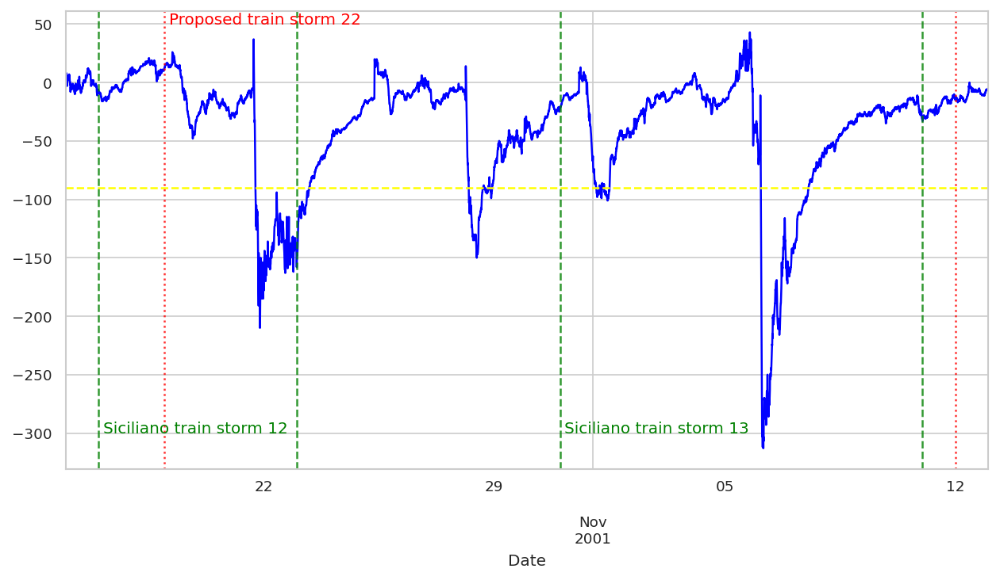

In [47]:
fig, ax = plt.subplots(figsize=(10, 5))
start_plot_global = pd.to_datetime('2001-10-16')
end_plot_global = pd.to_datetime('2001-11-13')
indices[start_plot_global : end_plot_global]["SYM_H"].plot(legend=False, xlabel="Date", ax=ax, color='blue')
plt.axhline(-90, linestyle = '--', color = 'yellow')

plt.axvline(pd.to_datetime('2001-10-17'), linestyle = '--', color = 'green', alpha = 0.8)
plt.axvline(pd.to_datetime('2001-10-23'), linestyle = '--', color = 'green', alpha = 0.8)
plt.text(pd.to_datetime('2001-10-17 03:00'), -300, f'Siciliano train storm 12', color = 'green')

plt.axvline(pd.to_datetime('2001-10-31'), linestyle = '--', color = 'green', alpha = 0.8)
plt.axvline(pd.to_datetime('2001-11-11'), linestyle = '--', color = 'green', alpha = 0.8)
plt.text(pd.to_datetime('2001-10-31 03:00'), -300, f'Siciliano train storm 13', color = 'green')

plt.axvline(pd.to_datetime('2001-10-19'), linestyle = 'dotted', color = 'red', alpha = 0.8)
plt.axvline(pd.to_datetime('2001-11-12'), linestyle = 'dotted', color = 'red', alpha = 0.8)
plt.text(pd.to_datetime('2001-10-19 03:00'), 50, f'Proposed train storm 22', color = 'red')


plt.show();

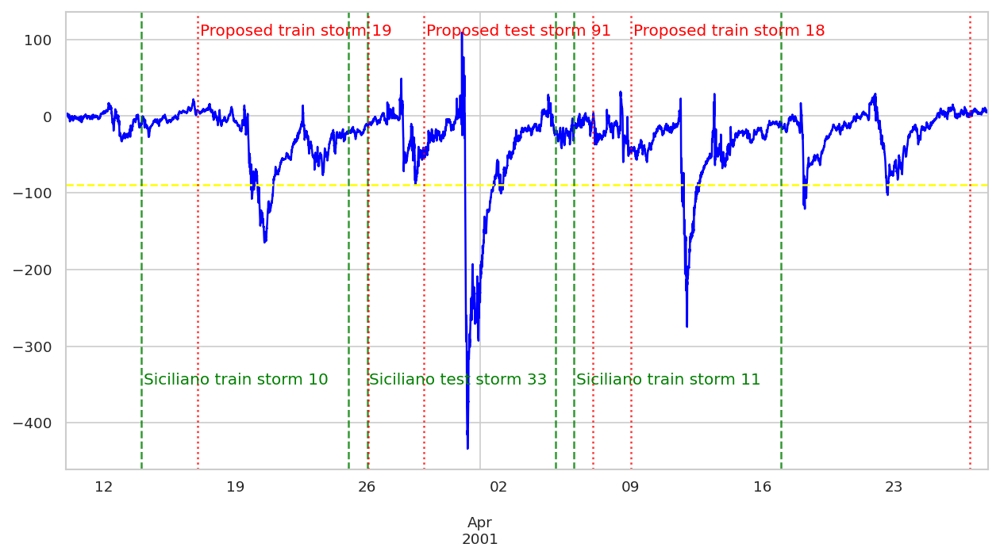

In [48]:
fig, ax = plt.subplots(figsize=(10, 5))
start_plot_global = pd.to_datetime('2001-03-10')
end_plot_global = pd.to_datetime('2001-04-28')
indices[start_plot_global : end_plot_global]["SYM_H"].plot(legend=False, ax=ax, color='blue', xlabel = '')
plt.axhline(-90, linestyle = '--', color = 'yellow')

plt.axvline(pd.to_datetime('2001-03-26'), linestyle = '--', color = 'green', alpha = 0.8)
plt.axvline(pd.to_datetime('2001-04-05'), linestyle = '--', color = 'green', alpha = 0.8)
plt.text(pd.to_datetime('2001-03-26 03:00'), -350, f'Siciliano test storm 33', color = 'green')

plt.axvline(pd.to_datetime('2001-04-06'), linestyle = '--', color = 'green', alpha = 0.8)
plt.axvline(pd.to_datetime('2001-04-17'), linestyle = '--', color = 'green', alpha = 0.8)
plt.text(pd.to_datetime('2001-04-06 03:00'), -350, f'Siciliano train storm 11', color = 'green')

plt.axvline(pd.to_datetime('2001-03-14'), linestyle = '--', color = 'green', alpha = 0.8)
plt.axvline(pd.to_datetime('2001-03-25'), linestyle = '--', color = 'green', alpha = 0.8)
plt.text(pd.to_datetime('2001-03-14 03:00'), -350, f'Siciliano train storm 10', color = 'green')

plt.axvline(pd.to_datetime('2001-03-17'), linestyle = 'dotted', color = 'red', alpha = 0.8)
plt.axvline(pd.to_datetime('2001-03-26 02:00'), linestyle = 'dotted', color = 'red', alpha = 0.8)
plt.text(pd.to_datetime('2001-03-17 03:00'), 105, f'Proposed train storm 19', color = 'red')

plt.axvline(pd.to_datetime('2001-03-29'), linestyle = 'dotted', color = 'red', alpha = 0.8)
plt.axvline(pd.to_datetime('2001-04-07'), linestyle = 'dotted', color = 'red', alpha = 0.8)
plt.text(pd.to_datetime('2001-03-29 03:00'), 105, f'Proposed test storm 91', color = 'red')

plt.axvline(pd.to_datetime('2001-04-09'), linestyle = 'dotted', color = 'red', alpha = 0.8)
plt.axvline(pd.to_datetime('2001-04-27'), linestyle = 'dotted', color = 'red', alpha = 0.8)
plt.text(pd.to_datetime('2001-04-09 03:00'), 105, f'Proposed train storm 18', color = 'red')

plt.show();

In [49]:
print('Correspondence new storms to the previous separation')

new_storms_rows = []
new_storm_index = 1

for row_name, row in new_storms_df.iterrows():
    overlapped_storm, problematic, overlap = check_belonging_previous_set_all(row['Start date'], row['End date'])
    if not problematic:        
        utils.print_colored(f"{row['subset']} Storm from {row['Start date'].strftime('%Y-%m-%d')} to {row['End date'].strftime('%Y-%m-%d')} overlaps with: {overlap}", 'green')
        if len(overlapped_storm) > 0:
            ds = pd.to_datetime(overlapped_storm[0]['Start date'].values[0])
            de = pd.to_datetime(overlapped_storm[0]['End date'].values[0])
            print(f"\tOverlaps with {overlapped_storm[0]['Subset'].values[0]} Storm {overlapped_storm[0]['Storm index'].values[0]} from {ds.strftime('%Y-%m-%d')} to {de.strftime('%Y-%m-%d')} | Class {overlapped_storm[0]['Classification'].values[0]} | Min SYM {overlapped_storm[0]['Min SYM-H'].values[0]}")
            new_storms_df.loc[new_storms_df['Storm index'] == row['Storm index'],'previous_subset'] = overlap


Correspondence new storms to the previous separation
Train Storm from 1998-02-15 to 1998-02-23 overlaps with: Train 1
	Overlaps with Training Storm 1 from 1998-02-14 to 1998-02-23 | Class Low | Min SYM -119
Train Storm from 1998-08-04 to 1998-08-12 overlaps with: Train 2
	Overlaps with Training Storm 2 from 1998-08-02 to 1998-08-09 | Class Moderate | Min SYM -168
Train Storm from 1998-09-23 to 1998-09-30 overlaps with: Train 3
	Overlaps with Training Storm 3 from 1998-09-19 to 1998-09-30 | Class Moderate | Min SYM -213
Train Storm from 1999-02-16 to 1999-02-24 overlaps with: Train 4
	Overlaps with Training Storm 4 from 1999-02-16 to 1999-02-25 | Class Low | Min SYM -127
Train Storm from 1999-10-20 to 1999-10-27 overlaps with: Train 5
	Overlaps with Training Storm 5 from 1999-10-15 to 1999-10-26 | Class Moderate | Min SYM -218
Train Storm from 1999-11-11 to 1999-11-18 overlaps with: New storm
Train Storm from 1999-12-11 to 1999-12-18 overlaps with: New storm
Train Storm from 2000-02-10 

## Print the storms to copy it to a .py file <a class="anchor" id="section_3_8"></a>

In [50]:
TRAIN_STORMS_INFO = []
print('TRAIN_STORMS_INFO_SYM_H = [')

for _, storm in new_storms_df.loc[new_storms_df['subset'] == 'Train'].iterrows():
    start_date = storm['Start date'].strftime('%Y%m%d')
    end_date = storm['End date'].strftime('%Y%m%d')
    checksum = int(indices[storm['Start date']:storm['End date']]['SYM_H'].sum())
    print(f'\t["{start_date}", "{end_date}", {storm["Storm index"]}, {checksum}],')
    TRAIN_STORMS_INFO.append([start_date, end_date, storm['Storm index'], checksum])
print(']\n\n')

VALIDATION_STORMS_INFO = []
print('VALIDATION_STORMS_INFO_SYM_H = [')
for _, storm in new_storms_df.loc[new_storms_df['subset'] == 'Validation'].iterrows():
    start_date = storm['Start date'].strftime('%Y%m%d')
    end_date = storm['End date'].strftime('%Y%m%d')
    checksum = int(indices[storm['Start date']:storm['End date']]['SYM_H'].sum())
    print(f'\t["{start_date}", "{end_date}", {storm["Storm index"]}, {checksum}],')
    VALIDATION_STORMS_INFO.append([start_date, end_date, storm['Storm index'], checksum])
print(']\n\n')

TEST_STORMS_INFO = []
print('TEST_STORMS_INFO_SYM_H = [')
for _, storm in new_storms_df.loc[new_storms_df['subset'] == 'Test'].iterrows():
    start_date = storm['Start date'].strftime('%Y%m%d')
    end_date = storm['End date'].strftime('%Y%m%d')
    checksum = int(indices[storm['Start date']:storm['End date']]['SYM_H'].sum())
    print(f'\t["{start_date}", "{end_date}", {storm["Storm index"]}, {checksum}],')
    TEST_STORMS_INFO.append([start_date, end_date, storm['Storm index'], checksum])
print(']\n\n')
    
TEST_KEY_STORMS_INFO = []
print('TEST_KEY_STORMS_INFO_SYM_H = [')
for _, storm in new_storms_df.loc[new_storms_df['subset'] == 'Test_key_parameters'].iterrows():
    start_date = storm['Start date'].strftime('%Y%m%d')
    end_date = storm['End date'].strftime('%Y%m%d')
    checksum = int(indices[storm['Start date']:storm['End date']]['SYM_H'].sum())
    print(f'\t["{start_date}", "{end_date}", {storm["Storm index"]}, {checksum}],')
    TEST_KEY_STORMS_INFO.append([start_date, end_date, storm['Storm index'], checksum])
print(']\n\n')

TRAIN_STORMS_INFO_SYM_H = [
	["19980215", "19980223", 1, -57648],
	["19980804", "19980812", 2, -50988],
	["19980923", "19980930", 3, -74099],
	["19990216", "19990224", 4, -55655],
	["19991020", "19991027", 5, -77852],
	["19991111", "19991118", 6, -80176],
	["19991211", "19991218", 7, -48934],
	["20000210", "20000217", 8, -76326],
	["20000414", "20000421", 9, -29620],
	["20000606", "20000613", 10, -43657],
	["20000713", "20000725", 11, -166655],
	["20000809", "20000817", 12, -97081],
	["20000915", "20000923", 13, -77988],
	["20000928", "20001011", 14, -132473],
	["20001012", "20001019", 15, -35992],
	["20001027", "20001103", 16, -38381],
	["20001104", "20001115", 17, -114277],
	["20001125", "20001204", 18, -88562],
	["20010317", "20010326", 19, -96258],
	["20010409", "20010427", 20, -162836],
	["20010508", "20010515", 21, -82711],
	["20011019", "20011112", 22, -308841],
	["20011122", "20011130", 23, -94109],
	["20020415", "20020425", 24, -153751],
	["20020509", "20020517", 25, -66426],


### Cross-compare the storm dates with the ICME catalog from doi.org/10.21950/XGUIYX <a class="anchor" id="section_3_8_1"></a>

In [51]:
new_storms_df['Start date'] = new_storms_df['Start date'].apply(lambda x : x.strftime('%Y-%m-%d'))
new_storms_df['End date'] = new_storms_df['End date'].apply(lambda x : x.strftime('%Y-%m-%d'))

In [52]:
icme_catalog = pd.read_csv('./data/icme_multicatalog.csv', parse_dates = ['icme_start', 'mo_start', 'mo_end'])
icme_catalog = icme_catalog[['icme_start', 'mo_start', 'mo_end']]

new_storms_df['Source'] = 'HSS'

def check_icme_overlap(start_date, end_date, icme_data):    
    for _, row in icme_data.iterrows():
        time_range = DateTimeRange(start_date, end_date)
        test_range = DateTimeRange(row['icme_start'], row['mo_end'])
        intersection = test_range.intersection(time_range)
        if intersection.start_datetime is not None:
            print(f'Storm from {start_date} to {end_date} was caused by the ICME {row}')
            return "CME"
    return "HSS"
    
new_storms_df['Source'] = new_storms_df.apply(lambda row: check_icme_overlap(row['Start date'], row['End date'], 
                                                                             icme_catalog), axis = 1)

Storm from 1998-02-15 to 1998-02-23 was caused by the ICME icme_start   1998-02-18 14:52:00
mo_start     1998-02-18 21:35:00
mo_end       1998-02-20 00:44:00
Name: 399, dtype: datetime64[ns]
Storm from 1998-08-04 to 1998-08-12 was caused by the ICME icme_start   1998-08-10 00:31:00
mo_start     1998-08-10 04:47:00
mo_end       1998-08-10 23:30:00
Name: 388, dtype: datetime64[ns]
Storm from 1998-09-23 to 1998-09-30 was caused by the ICME icme_start   1998-09-24 23:18:00
mo_start     1998-09-25 04:33:00
mo_end       1998-09-26 17:00:00
Name: 384, dtype: datetime64[ns]
Storm from 1999-02-16 to 1999-02-24 was caused by the ICME icme_start   1999-02-18 02:48:00
mo_start     1999-02-18 09:14:00
mo_end       1999-02-19 00:00:00
Name: 376, dtype: datetime64[ns]
Storm from 1999-10-20 to 1999-10-27 was caused by the ICME icme_start   1999-10-21 02:19:00
mo_start     1999-10-21 02:19:00
mo_end       1999-10-22 06:32:00
Name: 364, dtype: datetime64[ns]
Storm from 1999-11-11 to 1999-11-18 was cause

Storm from 2011-03-09 to 2011-03-16 was caused by the ICME icme_start   2011-03-09 02:07:00
mo_start     2011-03-09 02:07:00
mo_end       2011-03-09 12:29:00
Name: 1362, dtype: datetime64[ns]
Storm from 2011-05-26 to 2011-06-02 was caused by the ICME icme_start   2011-05-28 00:14:00
mo_start     2011-05-28 05:31:00
mo_end       2011-05-28 22:48:00
Name: 187, dtype: datetime64[ns]
Storm from 2011-09-24 to 2011-10-02 was caused by the ICME icme_start   2011-09-26 11:52:00
mo_start     2011-09-26 19:25:00
mo_end       2011-09-28 21:06:00
Name: 983, dtype: datetime64[ns]
Storm from 2012-03-05 to 2012-03-14 was caused by the ICME icme_start   2012-03-12 08:28:00
mo_start     2012-03-12 16:19:00
mo_end       2012-03-14 02:52:00
Name: 166, dtype: datetime64[ns]
Storm from 2012-04-21 to 2012-04-29 was caused by the ICME icme_start   2012-04-23 02:15:00
mo_start     2012-04-23 16:48:00
mo_end       2012-04-24 02:52:00
Name: 162, dtype: datetime64[ns]
Storm from 2012-11-12 to 2012-11-19 was caus

Storm from 2003-05-27 to 2003-06-07 was caused by the ICME icme_start   2003-05-29 11:52:00
mo_start     2003-05-29 13:00:00
mo_end       2003-05-29 18:30:00
Name: 551, dtype: datetime64[ns]
Storm from 2003-06-15 to 2003-06-23 was caused by the ICME icme_start   2003-06-16 22:33:00
mo_start     2003-06-17 17:48:00
mo_end       2003-06-18 08:18:00
Name: 284, dtype: datetime64[ns]
Storm from 2004-01-20 to 2004-01-27 was caused by the ICME icme_start   2004-01-22 01:05:00
mo_start     2004-01-22 10:00:00
mo_end       2004-01-23 07:00:00
Name: 563, dtype: datetime64[ns]
Storm from 2004-02-09 to 2004-02-16 was caused by the ICME icme_start   2004-02-06 21:07:12
mo_start     2004-02-06 21:07:12
mo_end       2004-02-13 21:07:12
Name: 1255, dtype: datetime64[ns]
Storm from 2004-11-05 to 2004-11-17 was caused by the ICME icme_start   2004-11-11 16:47:00
mo_start     2004-11-12 08:35:00
mo_end       2004-11-13 09:35:00
Name: 267, dtype: datetime64[ns]
Storm from 2005-01-05 to 2005-01-13 was caus

In [53]:
print(new_storms_df.to_latex(index=False, longtable = True, bold_rows = True, float_format = "%.0f"))

\begin{longtable}{rllrllrll}
\toprule
Storm index & Start date & End date & Min SYM-H & classification & previous_subset & solar_cycle & subset & Source \\
\midrule
\endfirsthead
\toprule
Storm index & Start date & End date & Min SYM-H & classification & previous_subset & solar_cycle & subset & Source \\
\midrule
\endhead
\midrule
\multicolumn{9}{r}{Continued on next page} \\
\midrule
\endfoot
\bottomrule
\endlastfoot
1 & 1998-02-15 & 1998-02-23 & -119 & Low & Train 1 & 23 & Train & CME \\
2 & 1998-08-04 & 1998-08-12 & -168 & Moderate & Train 2 & 23 & Train & CME \\
3 & 1998-09-23 & 1998-09-30 & -213 & Moderate & Train 3 & 23 & Train & CME \\
4 & 1999-02-16 & 1999-02-24 & -127 & Low & Train 4 & 23 & Train & CME \\
5 & 1999-10-20 & 1999-10-27 & -218 & Moderate & Train 5 & 23 & Train & CME \\
6 & 1999-11-11 & 1999-11-18 & -106 & Low & New storm & 23 & Train & CME \\
7 & 1999-12-11 & 1999-12-18 & -97 & Low & New storm & 23 & Train & CME \\
8 & 2000-02-10 & 2000-02-17 & -164 & Moderate & N

In [54]:
print(new_storms_df[['Storm index', 'Start date', 'End date', 'solar_cycle', 'Min SYM-H', 'classification', 'Source', 'previous_subset']].set_index('Storm index').style.to_latex(environment = 'longtable').
      replace('previous_subset', 'Correspondence Siciliano').
      replace('Test_key_parameters', 'Test key parameters').
      replace('classification', 'Classification').
      replace('solar_cycle', 'Solar Cycle')
    )

\begin{longtable}{lllrrlll}
 & Start date & End date & Solar Cycle & Min SYM-H & Classification & Source & Correspondence Siciliano \\
Storm index &  &  &  &  &  &  &  \\
\endfirsthead
 & Start date & End date & Solar Cycle & Min SYM-H & Classification & Source & Correspondence Siciliano \\
Storm index &  &  &  &  &  &  &  \\
\endhead
\multicolumn{8}{r}{Continued on next page} \\
\endfoot
\endlastfoot
1 & 1998-02-15 & 1998-02-23 & 23 & -119 & Low & CME & Train 1 \\
2 & 1998-08-04 & 1998-08-12 & 23 & -168 & Moderate & CME & Train 2 \\
3 & 1998-09-23 & 1998-09-30 & 23 & -213 & Moderate & CME & Train 3 \\
4 & 1999-02-16 & 1999-02-24 & 23 & -127 & Low & CME & Train 4 \\
5 & 1999-10-20 & 1999-10-27 & 23 & -218 & Moderate & CME & Train 5 \\
6 & 1999-11-11 & 1999-11-18 & 23 & -106 & Low & CME & New storm \\
7 & 1999-12-11 & 1999-12-18 & 23 & -97 & Low & CME & New storm \\
8 & 2000-02-10 & 2000-02-17 & 23 & -164 & Moderate & CME & New storm \\
9 & 2000-04-14 & 2000-04-21 & 23 & -94 & Low & CME

### Save to JSON file <a class="anchor" id="section_3_8_2"></a>

In [55]:
import json

geomagnetic_storms = {
    'train_storms' : TRAIN_STORMS_INFO ,
    'val_storms' : VALIDATION_STORMS_INFO ,
    'test_storms' : TEST_STORMS_INFO ,
    'test_key_storms': TEST_KEY_STORMS_INFO, 
}
    
with open('geomagnetic_storms_sym.json', 'w') as outfile:
    json.dump(geomagnetic_storms, outfile, indent=4, sort_keys=True)